In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import json
import os

os.chdir("../")
from scripts import utils, alerceanomalies
import matplotlib.gridspec as gridspec
from tqdm.auto import tqdm

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from sklearn.svm import OneClassSVM
import distclassipy as dcpy
from distclassipy.anomaly import DistanceAnomaly
from sklearn.model_selection import train_test_split

from sklearn.base import BaseEstimator, OutlierMixin
epsilon = np.finfo(np.float32).eps
with open("settings.txt") as f:
    settings_dict = json.load(f)
seed_val = settings_dict["seed_choice"]
np.random.seed(seed_val)
sns_dict = settings_dict["sns_dict"]
sns.set_theme(**sns_dict)

from IPython.core.display import HTML
from IPython.display import display

import squarify
set3colors = [matplotlib.colors.rgb2hex(x) for x in plt.cm.Set3.colors]
knowncolors = set3colors[:4]
unknowncolors = ['#e6194B', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#42d4f4', '#f032e6', '#bfef45', '#fabed4', '#469990', '#dcbeff', '#9A6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#a9a9a9']
unknowncolors = set3colors[4:]+unknowncolors

from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler

In [2]:
models_to_test = {
    "DistClassiPy (min-median)": DistanceAnomaly(
        cluster_agg='min',
        metric_agg='median',
        normalize_scores=True
    ),
    
    "DistClassiPy (min-mean)": DistanceAnomaly(
        cluster_agg='min',
        metric_agg='mean',
        normalize_scores=True
    ),

    "IsolationForest": IsolationForest( #using alerce anomaly params
        n_estimators=100,
        max_samples=256,
        contamination=0.001,
        random_state=seed_val+2
    ),
    "LocalOutlierFactor": LocalOutlierFactor(
        n_neighbors=20, 
        novelty=True,  # IMPORTANT: Allows use on new data
        contamination='auto'
    ),
    
    "OneClassSVM": OneClassSVM(
        kernel='rbf',
        nu=0.001
    ),

    # "Autoencoder": alerceanomalies.AutoencoderAnomalyDetector(
    #     encoding_dim=32, # Can be tuned
    #     epochs=500,
    #     patience=15,
    # ),


    # "Variational Autoencoder": alerceanomalies.VAEAnomalyDetector(
    #     encoding_dim=32, # Can be tuned
    #     epochs=500,
    #     patience=15,
    #     loss_samples=5 # Number of samples for the reconstruction term in ELBO
    # ),

    # "DeepSVDD": alerceanomalies.DeepSVDDAnomalyDetector(
    #     encoding_dim=32, # Can be tuned
    #     epochs=500,
    #     patience=15,
    # ),

    # "ClassSVDD": alerceanomalies.ClassSVDDAnomalyDetector(
    #     z_dim=64,
    #     epochs=500,
    #     patience=15,
    #     lr=1e-4,
    #     verbose=False
    # )
}

In [3]:
features1 = pd.read_parquet("data/allfeatures.parquet")

features2 = pd.read_parquet("data/otherclassobjs_features.parquet")
features2.index.name = "snid"
features2cl = pd.read_parquet("data/otherclassobjs.parquet")
features2cl.index.name = "snid"
features2["class"] = features2cl["class"]
assert (features2.index == features2cl.index).all()
del(features2cl)

features3 = pd.read_parquet("data/otherclassobjs_features_23AUG.parquet")
features3.index.name = "snid"
features3cl = pd.read_parquet("data/otherclassobjs_23AUG.parquet")
features3cl.index.name = "snid"
features3["class"] = features3cl["class"]
assert (features3.index == features3cl.index).all()
del(features3cl)

commondat = pd.concat([features1,features2,features3])
commondat=commondat[~commondat.index.duplicated()]
del(features1, features2, features3)

assert (len(commondat.index) == len(commondat.index.unique()))

In [4]:
myfeatures = ['SPM_A_g', 'SPM_gamma_g', 'SPM_beta_g',
       'SPM_tau_rise_g', 'SPM_tau_fall_g', 'SPM_A_r', 'SPM_gamma_r',
    'SPM_beta_r', 'SPM_tau_rise_r', 'SPM_tau_fall_r', 
]

In [10]:
def run_anom_exp(commondat, new_knowns, new_unknowns, final_features):
    knowns_idx = commondat[commondat["class"].isin(new_knowns)].sample(frac=1).index
    unknowns_idx = commondat[commondat["class"].isin(new_unknowns)].sample(frac=1).index
    knowns_idx = commondat.loc[knowns_idx, final_features].dropna().index
    unknowns_idx = commondat.loc[unknowns_idx, final_features].dropna().index

    X_knowns_df = commondat.loc[knowns_idx, final_features]
    y_knowns_df = commondat.loc[knowns_idx, "class"]

    X_anom_df = commondat.loc[unknowns_idx, final_features]
    y_anom_df = commondat.loc[unknowns_idx, "class"]

    # # Determine the size of the smallest class in the knowns dataset
    # min_class_size = y_knowns_df.value_counts().min()

    # # Create a balanced training set for the knowns
    # # We group by class and then take a random sample of size `min_class_size` from each class
    # train_knowns_indices = X_knowns_df.groupby(y_knowns_df).apply(lambda x: x.sample(min_class_size)).index.droplevel(0)
    
    # X_train_knowns_df = X_knowns_df.loc[train_knowns_indices]
    # y_train_knowns_df = y_knowns_df.loc[train_knowns_indices]

    # # The remaining knowns go into the test set
    # test_knowns_indices = X_knowns_df.index.difference(train_knowns_indices)
    # X_test_knowns_df = X_knowns_df.loc[test_knowns_indices]
    # y_test_knowns_df = y_knowns_df.loc[test_knowns_indices]

    # # X_all is now the combination of the imbalanced knowns test set and the unknowns
    # X_all_df = pd.concat([X_test_knowns_df, X_anom_df])
    # y_all_df = pd.concat([y_test_knowns_df, y_anom_df])


    # Determine the size of the smallest class in the knowns dataset
    min_class_size = y_knowns_df.value_counts().min()

    # If the smallest class has over 1000 samples, use that size for balancing.
    # Otherwise, the target is 1000 samples per class.
    if min_class_size > 1000:
        target_sample_size = min_class_size
    else:
        target_sample_size = 1000
    
    # Define a sampling function based on the new logic.
    # For each class, take the target number of samples, unless the class has fewer samples,
    # in which case, take all of them.
    def conditional_sampler(x):
        return x.sample(min(len(x), target_sample_size))

    # Group by class and apply the conditional sampling logic to create the training set
    train_knowns_indices = X_knowns_df.groupby(y_knowns_df).apply(conditional_sampler).index.droplevel(0)
    
    X_train_knowns_df = X_knowns_df.loc[train_knowns_indices]
    y_train_knowns_df = y_knowns_df.loc[train_knowns_indices]

    # The remaining knowns (the imbalanced portion) go into the test set
    test_knowns_indices = X_knowns_df.index.difference(train_knowns_indices)
    X_test_knowns_df = X_knowns_df.loc[test_knowns_indices]
    y_test_knowns_df = y_knowns_df.loc[test_knowns_indices]

    # X_all is now the combination of the leftover knowns and all the unknowns
    X_all_df = pd.concat([X_test_knowns_df, X_anom_df])
    y_all_df = pd.concat([y_test_knowns_df, y_anom_df])

    print("TRAIN VALUE COUNT:")
    print(y_train_knowns_df.value_counts())

    print("TEST VALUE COUNT:")
    print(y_all_df.value_counts())
    
    assert (X_all_df.index == y_all_df.index).all()

    print("Assert done")

    results_df = pd.DataFrame(index=X_all_df.index)
    results_df['class'] = y_all_df
    mask = results_df['class'].isin(new_knowns)
    results_df['status'] = np.where(mask, 'normal', 'anomalous')
    
    
    # Loop through models, fit, score, and store results
    for model_name, model in tqdm(models_to_test.items(), desc="Running Models"):
        # print(f"--- Training {model_name} ---")
        
        # Fit the model on the NORMAL data only
        if model_name in ["IsolationForest", "LocalOutlierFactor", "OneClassSVM"]:
            model.fit(X_train_knowns_df.to_numpy())
        else:
            model.fit(X_train_knowns_df.to_numpy(), y_train_knowns_df.to_numpy())
        
        # Get anomaly scores for ALL data
        # Note: IF and LOF score lower for anomalies, so we negate them.
        # Your method and AE score higher for anomalies, so no change is needed.
        scores = model.decision_function(X_all_df.to_numpy())
        
        if model_name in ["IsolationForest", "LocalOutlierFactor", "OneClassSVM"]:
            scores = -scores # Lower is more anomalous for these, so we flip
            
        results_df[f'score_{model_name}'] = scores

    # pass

    topn = 100
    print(f"How many anomalies in top {topn} preds?")
    for col in results_df.columns[2:]:
        print("*"*10, col, "*"*10)
        display(results_df.sort_values(by=[col],ascending=False)["status"].iloc[:topn].value_counts())



    anomcounts = y_anom_df.value_counts()
    knowncounts = y_train_knowns_df.value_counts()
    anomcounts.index = [x[:14] for x in anomcounts.index]
    
    # Utility function to build a labeled list
    def format_labels(series):
        return [f"{cls}\n({count})" for cls, count in zip(series.index, series.values)]
    
    
    squarify.plot(
        sizes=anomcounts.values,
        label=format_labels(anomcounts),
        color=sns.color_palette(unknowncolors),
        alpha=0.8,
        text_kwargs={'fontsize':6}
    )
    plt.gca().axis('off')
    plt.title(f'{anomcounts.sum()} Unseen Objects in {len(anomcounts)} Classes',fontsize=14)
    # plt.savefig("unknown.png", dpi=300, bbox_inches="tight")
    plt.show()

    squarify.plot(
        sizes=knowncounts.values,
        label=format_labels(knowncounts),
        color=sns.color_palette(knowncolors),
        alpha=0.8,
        text_kwargs={'fontsize':14}
    )
    plt.gca().axis('off')
    plt.title(f'{knowncounts.sum()} Seen Objects in {len(knowncounts)} Classes',fontsize=14)
    plt.show()

    print("Total anoms:")
    print(results_df["status"].value_counts())
    max_anom = results_df["status"].value_counts()["anomalous"]

    top_n = min(200, max_anom)
    
    print("*"*10, f"Check top {top_n} candidates for each model", "*"*10)
    # Example: Check top 200 candidates for each model
    
    for model_name in models_to_test.keys():
        score_col = f'score_{model_name}'
        print(f"\n--- Top {top_n} candidates for {model_name} ---")
        
        top_candidates = results_df.sort_values(score_col, ascending=False).head(top_n)
        display(top_candidates['status'].value_counts(normalize=True))


    methods_percent = {}
    
    # baseline = []
    
    for model_name in tqdm(models_to_test.keys(),desc="method",leave=False):
        methods_percent[model_name] = []
        topresults_df = results_df.sort_values(by=f"score_{model_name}",ascending=False).iloc[:top_n]
        score_col = f'score_{model_name}'
        for i in tqdm(range(len(topresults_df)), leave=False):
            top_candidates = topresults_df.head(i)
            valcounts = top_candidates['status'].value_counts(normalize=True,ascending=True)
            if "anomalous" in valcounts.index:
                frac = valcounts["anomalous"]
            else:
                frac = 0
            methods_percent[model_name].append(frac)

    endnum = min(200, max_anom-1)
    # endum = len(results_df)+1
    
    top_ns = np.arange(start=1, stop=endnum+1)
    
    
    for model_name in models_to_test.keys():
        plt.plot(top_ns, methods_percent[model_name][:endnum], label=model_name, linewidth=2)
    plt.ylabel("Purity", fontsize=16)
    plt.xlabel("Follow-up Budget (No. of sources)", fontsize=16)
    plt.gca().tick_params(axis='both', which='major', labelsize=16)
    plt.gca().tick_params(axis='both', which='minor', labelsize=12)
    plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=12)
    # plt.savefig(f"top{endnum}budget4methods.png",dpi=300,bbox_inches="tight")
    plt.show()


    endum = len(results_df)
    
    top_ns = np.arange(start=1, stop=endnum+1)
    
    
    for model_name in models_to_test.keys():
        plt.plot(top_ns, methods_percent[model_name][:endnum], label=model_name)
    plt.ylabel("Purity", fontsize=16)
    plt.xlabel("Follow-up Budget (No. of sources)", fontsize=16)
    plt.gca().tick_params(axis='both', which='major', labelsize=16)
    plt.gca().tick_params(axis='both', which='minor', labelsize=12)
    plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=12)
    # plt.savefig("allobjsbudget4methods.png",dpi=300,bbox_inches="tight")
    plt.show()

    # ranks = results_df.iloc[:, 2:].rank(ascending=False, method='dense')
    # ranks.loc[results_df[results_df["class"] == "KN_B19"].index].sum()
    
    n = min(100, max_anom)
    
    all_models = list(models_to_test.keys())
    
    print(f"Comparing top {n} {all_models[0]} with")
    for model_name in all_models[1:]:
        print("*"*3+model_name)
        common = len(np.intersect1d(results_df.sort_values(
            by="score_DistClassiPy (min-median)",
            ascending=False).iloc[:n].index, 
                                    results_df.sort_values(
                                        by=f"score_{model_name}",ascending=False).iloc[:n].index))
        
        print(f"\tCommon = {common}")
        print(f"\tCommon % = {(common/n):.1%}")
    
    # how many of the top 100 of dcpy are shared with the union (aka combined) top 100 for ALL OTHERS
    
    all_models = list(models_to_test.keys())
    
    othercommon_idxs = []
    for model_name in all_models[1:]:
        if "distclassipy" in model_name.lower():
            continue
        cur = results_df.sort_values(
            by=f"score_{model_name}",ascending=False).iloc[:n].index
        othercommon_idxs = np.union1d(othercommon_idxs, cur)
    
    topdcpy = results_df.sort_values(by=f"score_{all_models[0]}",ascending=False).iloc[:n]
    
    common = np.intersect1d(othercommon_idxs, topdcpy.index)
    common_len = len(common)
    print(f"{all_models[0]} common with top {n} for ALL OTHER: {common_len} ({(common_len/n):.1%})")
    
    print(topdcpy.loc[~topdcpy.index.isin(common)]["status"].value_counts())
    print(topdcpy.loc[~topdcpy.index.isin(common)]["status"].value_counts(normalize=True))
    #which of the unique dcpy ones are actually anomalous?
    
    # 
    # for j in range(len(all_models)):
    #     for model_name in all_models[1+j:]:
    #         print(f"{all_models[j]} - {model_name}")
    #         common = len(np.intersect1d(results_df.sort_values(
    #             by="score_DistClassiPy (min-median)",
    #             ascending=False).iloc[:n].index, 
    #                                     results_df.sort_values(
    #                                         by=f"score_{model_name}",ascending=False).iloc[:n].index))
            
    #         print(f"\tCommon = {common}")
    #         print(f"\tCommon % = {(common/n):.1%}")
    
    
    for col in results_df.columns[2:]:
        print(col)
        display(HTML(results_df.sort_values(by=col,ascending=False)[["class", "status"]].iloc[:20].to_html()))
    
    
    # snid = 141445943
    # lcdf = pd.read_parquet("data/otherclassobjs.parquet")
    # # lcdf = pd.read_parquet("data/Cepheid.parquet")
    # try:
    #     lcdf=lcdf.set_index("SNID")
    # except Exception:
    #     pass
    # def plot_lc(lcdf, snid):
    #     chosen_df = lcdf.loc[snid]
    #     cols = ["MJD", "FLUXCAL", "FLUXCALERR", "BAND", "PHOTFLAG", "ZEROPT"]
    #     dat = []
    #     for col in cols:
    #         if col in cols:
    #             dat.append(chosen_df.loc[col])
    #     dat = np.array(dat).T
    #     lc = pd.DataFrame(data=dat,columns=cols).sort_values(by="MJD")
    
    #     plt.figure(figsize=(4, 4))
    #     for band in "ugrizY":
    #         lc_band = lc[lc["BAND"] == band]
    #         plt.errorbar(
    #             x=lc_band["MJD"],
    #             y=lc_band["FLUXCAL"],
    #             yerr=lc_band["FLUXCALERR"],
    #             fmt="o",
    #             label=f"{band}",
    #         )
    #     plt.xlabel("Time (in days)")
    #     plt.ylabel("Brightness (flux)")
    #     ax = plt.gca()
    #     x = ax.get_xticks()
    #     ax.set_xticks(x[1:-1:1])
    #     ax.tick_params(axis="both", which="major")
    #     ax.grid(True, which="both", linestyle="--", linewidth=0.5)
    #     # ax.legend(bbox_to_anchor=(1.14, 0.55),ncol=1,loc="lower center")
    #     # plt.title(f"OID {objid} ({cur_cl})")
    #     # plt.xlim(peak_mjd - 40, peak_mjd + 90)
    #     # plt.grid()
    #     plt.savefig("lc.png", bbox_inches="tight", dpi=300)
    #     plt.show()
    # plot_lc(lcdf,snid)

In [11]:
run_anom_exp(commondat, new_knowns=["CEP", "RRL", "DSCT"], new_unknowns=["ILOT"], final_features=myfeatures)

TRAIN VALUE COUNT:
class
CEP     1660
DSCT    1660
RRL     1660
Name: count, dtype: int64
TEST VALUE COUNT:
class
RRL     43436
DSCT     6584
ILOT     1141
Name: count, dtype: int64
Assert done


Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [14]:
allclasses = sorted(commondat["class"].unique())
allclasses = [cl for cl in allclasses if cl not in ["RRL", "EB"]]

********************************************************************************
********************************  ANOMALY: AGN  ********************************
********************************************************************************
TRAIN VALUE COUNT:
class
CART                      1000
CEP                       1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       92
anomalous     8
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       91
anomalous     9
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal       93
anomalous     7
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       80
anomalous    20
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       97
anomalous     3
Name: count, dtype: int64

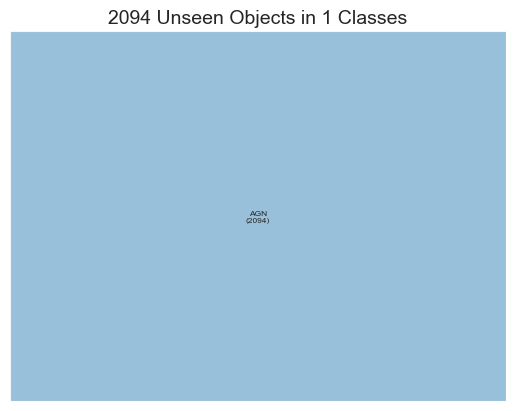

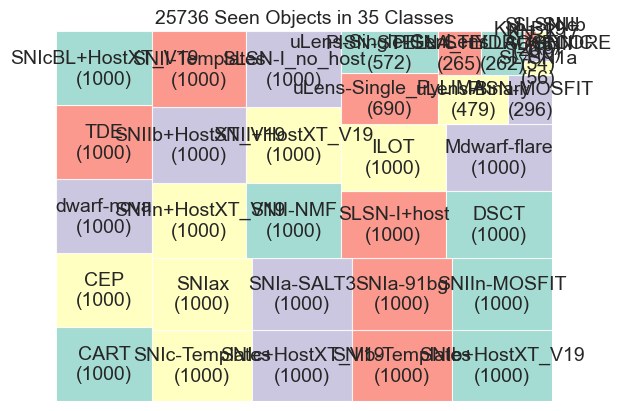

Total anoms:
status
normal       27365
anomalous     2094
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.915
anomalous    0.085
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.91
anomalous    0.09
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.91
anomalous    0.09
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.805
anomalous    0.195
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.86
anomalous    0.14
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

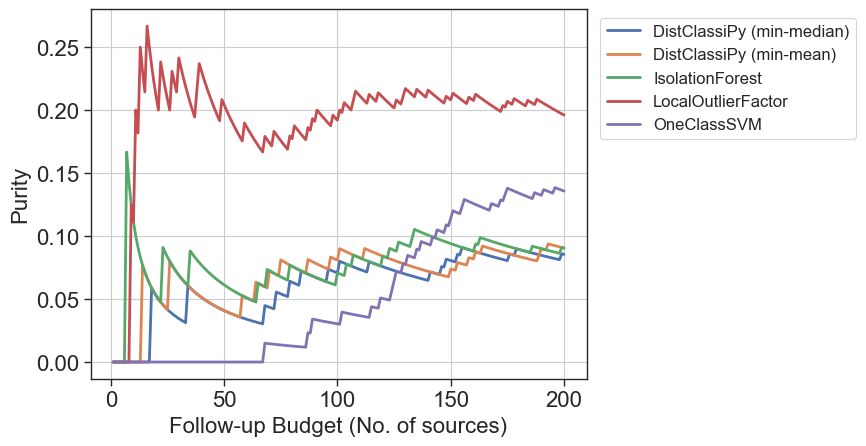

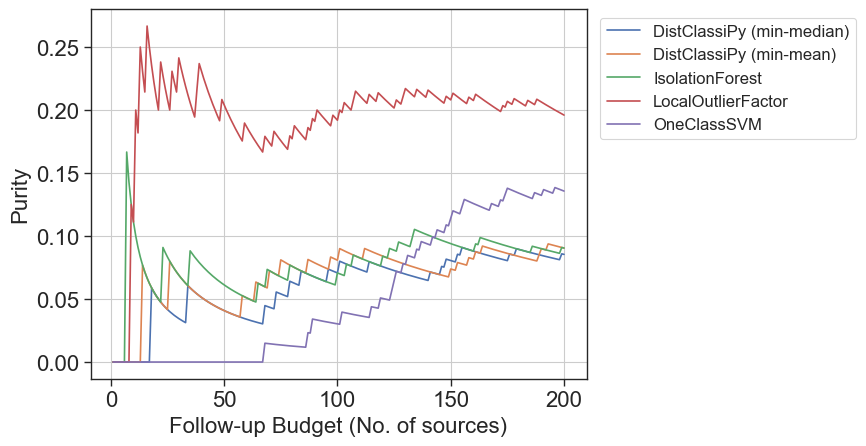

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 55
	Common % = 55.0%
***IsolationForest
	Common = 17
	Common % = 17.0%
***LocalOutlierFactor
	Common = 4
	Common % = 4.0%
***OneClassSVM
	Common = 9
	Common % = 9.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 20 (20.0%)
status
normal       73
anomalous     7
Name: count, dtype: int64
status
normal       0.9125
anomalous    0.0875
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
8591142,SNII-NMF,normal
106621934,TDE,normal
43757557,DSCT,normal
3365416,SNIa-SALT3,normal
17927341,SNII-NMF,normal
152540129,SNIIn-MOSFIT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
12874225,DSCT,normal
140955823,DSCT,normal
34892193,dwarf-nova,normal
48726309,DSCT,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
43757557,DSCT,normal
3365416,SNIa-SALT3,normal


score_IsolationForest


,class,status
snid,,
97153243,DSCT,normal
88027215,DSCT,normal
158182542,DSCT,normal
30406196,DSCT,normal
129423123,DSCT,normal
42088553,AGN,anomalous
35547238,DSCT,normal
50430377,DSCT,normal
15660705,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
140955823,DSCT,normal
48726309,DSCT,normal
106532076,TDE,normal
4357262,SNIc-Templates,normal
93099457,SNIIn-MOSFIT,normal
46505442,CEP,normal
24672901,AGN,anomalous
34892193,dwarf-nova,normal


score_OneClassSVM


,class,status
snid,,
40489115,DSCT,normal
34892193,dwarf-nova,normal
12874225,DSCT,normal
140955823,DSCT,normal
97153243,DSCT,normal
48726309,DSCT,normal
2008943,dwarf-nova,normal
40256654,DSCT,normal
64078252,dwarf-nova,normal


********************************************************************************
********************************  ANOMALY: CART  ********************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CEP                       1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       94
anomalous     6
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       93
anomalous     7
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       95
anomalous     5
Name: count, dtype: int64

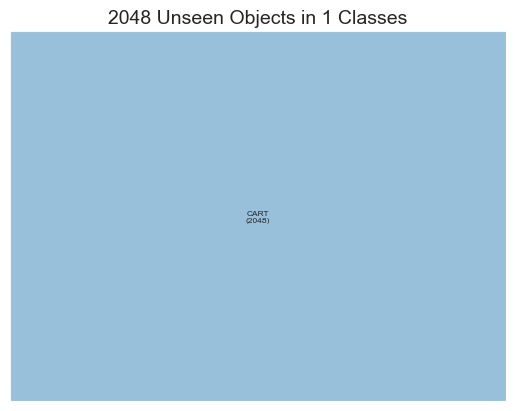

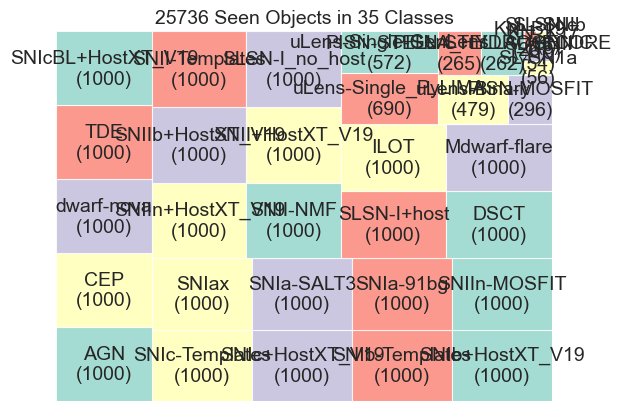

Total anoms:
status
normal       27411
anomalous     2048
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.965
anomalous    0.035
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.935
anomalous    0.065
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.945
anomalous    0.055
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.94
anomalous    0.06
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

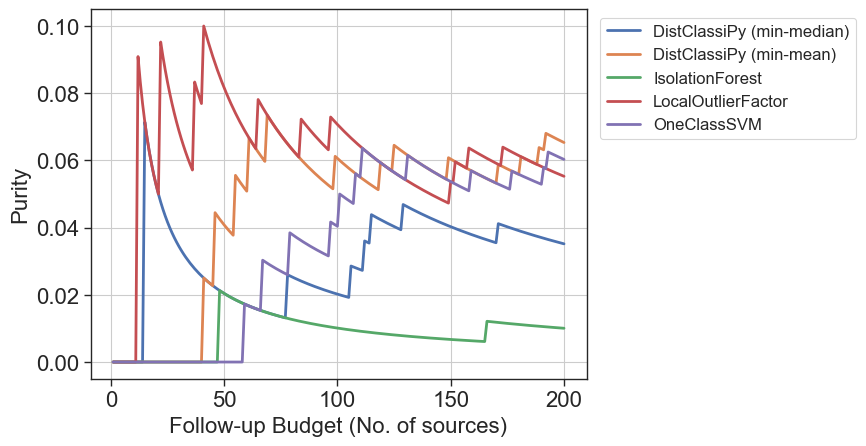

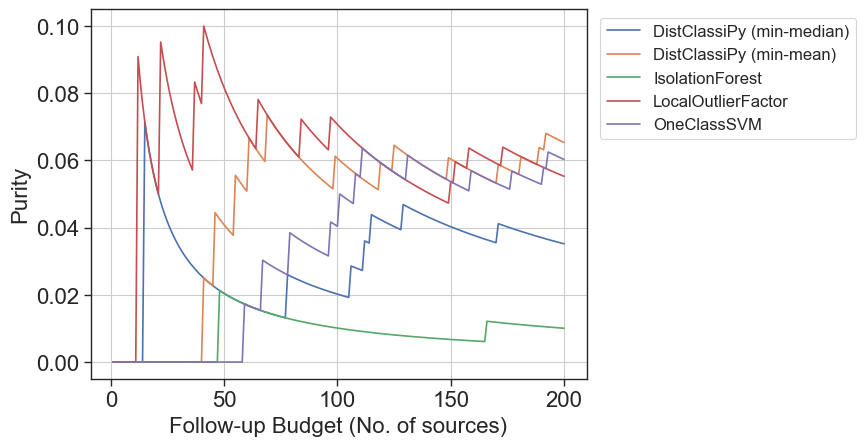

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 59
	Common % = 59.0%
***IsolationForest
	Common = 19
	Common % = 19.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 11
	Common % = 11.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 22 (22.0%)
status
normal       77
anomalous     1
Name: count, dtype: int64
status
normal       0.987179
anomalous    0.012821
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
12894334,SNIIn+HostXT_V19,normal
145318115,DSCT,normal
3365416,SNIa-SALT3,normal
89915162,TDE,normal
106621934,TDE,normal
12874225,DSCT,normal
155481312,CEP,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
155481312,CEP,normal
12874225,DSCT,normal
34892193,dwarf-nova,normal
48726309,DSCT,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal
12894334,SNIIn+HostXT_V19,normal
3365416,SNIa-SALT3,normal


score_IsolationForest


,class,status
snid,,
88027215,DSCT,normal
158182542,DSCT,normal
30406196,DSCT,normal
35547238,DSCT,normal
129423123,DSCT,normal
50430377,DSCT,normal
97153243,DSCT,normal
15660705,DSCT,normal
149692731,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
155481312,CEP,normal
10498551,SNIIn+HostXT_V19,normal
48726309,DSCT,normal
154302958,DSCT,normal
8016756,SNII-NMF,normal
24672901,AGN,normal
9078946,DSCT,normal
14063527,DSCT,normal


score_OneClassSVM


,class,status
snid,,
48726309,DSCT,normal
34892193,dwarf-nova,normal
155481312,CEP,normal
64078252,dwarf-nova,normal
12874225,DSCT,normal
62388074,DSCT,normal
97153243,DSCT,normal
97986635,DSCT,normal
79486150,DSCT,normal


********************************************************************************
********************************  ANOMALY: CEP  ********************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       82
anomalous    18
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       82
anomalous    18
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal       76
anomalous    24
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       80
anomalous    20
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       69
anomalous    31
Name: count, dtype: int64

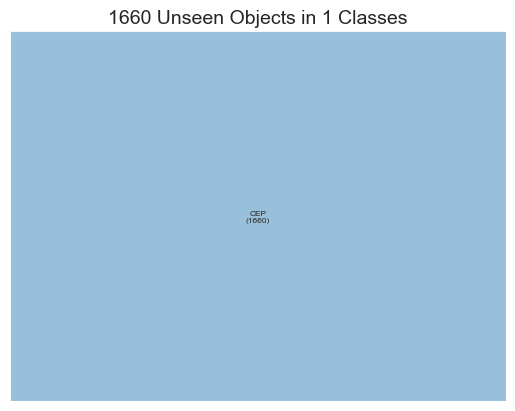

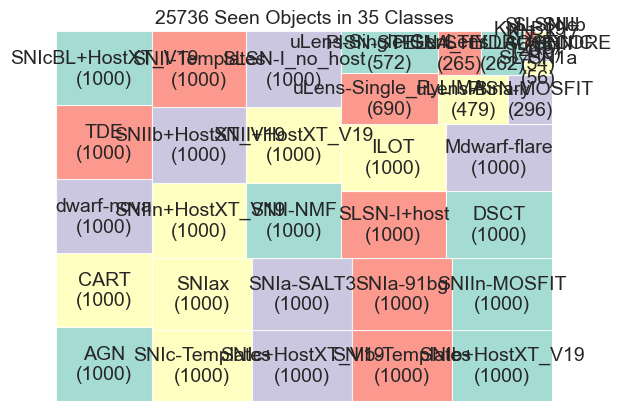

Total anoms:
status
normal       27799
anomalous     1660
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.855
anomalous    0.145
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.835
anomalous    0.165
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.735
anomalous    0.265
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.81
anomalous    0.19
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.735
anomalous    0.265
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

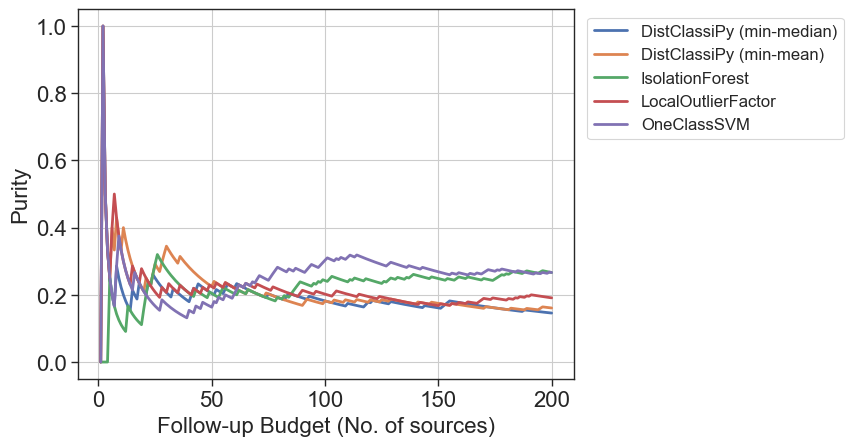

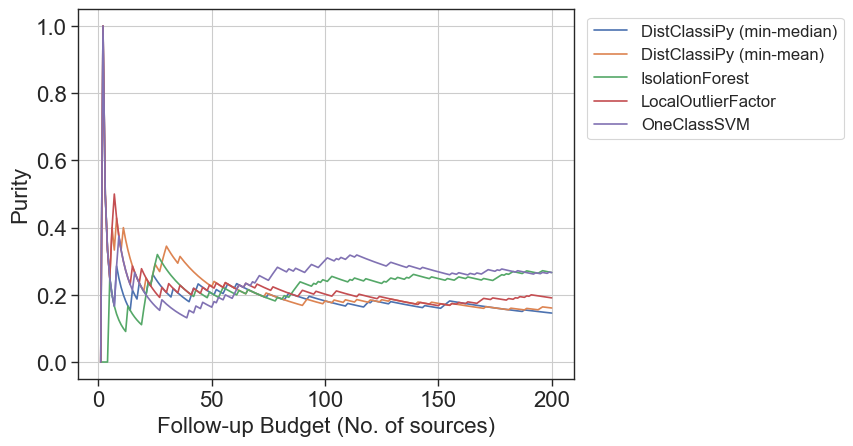

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 62
	Common % = 62.0%
***IsolationForest
	Common = 31
	Common % = 31.0%
***LocalOutlierFactor
	Common = 14
	Common % = 14.0%
***OneClassSVM
	Common = 27
	Common % = 27.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 44 (44.0%)
status
normal       50
anomalous     6
Name: count, dtype: int64
status
normal       0.892857
anomalous    0.107143
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,anomalous
12874225,DSCT,normal
43757557,DSCT,normal
48726309,DSCT,normal
35547238,DSCT,normal
158182542,DSCT,normal
39800396,CEP,anomalous
88027215,DSCT,normal
25095194,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,anomalous
12874225,DSCT,normal
48726309,DSCT,normal
35547238,DSCT,normal
39800396,CEP,anomalous
158182542,DSCT,normal
2746505,CEP,anomalous
140955823,DSCT,normal
43757557,DSCT,normal


score_IsolationForest


,class,status
snid,,
88027215,DSCT,normal
25095194,DSCT,normal
158182542,DSCT,normal
39800396,CEP,anomalous
15660705,DSCT,normal
1200489,DSCT,normal
134231880,DSCT,normal
80651702,dwarf-nova,normal
129423123,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,anomalous
140955823,DSCT,normal
48726309,DSCT,normal
34892193,dwarf-nova,normal
138399094,CEP,anomalous
39800396,CEP,anomalous
62388074,DSCT,normal
101267830,dwarf-nova,normal
93099457,SNIIn-MOSFIT,normal


score_OneClassSVM


,class,status
snid,,
39800396,CEP,anomalous
62388074,DSCT,normal
12874225,DSCT,normal
140955823,DSCT,normal
34892193,dwarf-nova,normal
48726309,DSCT,normal
155481312,CEP,anomalous
138399094,CEP,anomalous
97153243,DSCT,normal


********************************************************************************
********************************  ANOMALY: DSCT  ********************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
anomalous    58
normal       42
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       59
anomalous    41
Name: count, dtype: int64

********** score_IsolationForest **********


status
anomalous    83
normal       17
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       54
anomalous    46
Name: count, dtype: int64

********** score_OneClassSVM **********


status
anomalous    54
normal       46
Name: count, dtype: int64

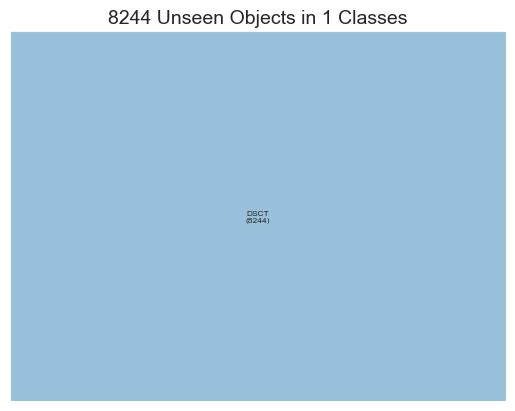

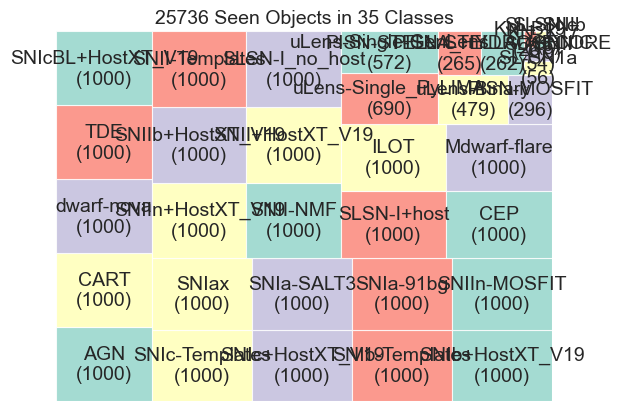

Total anoms:
status
normal       21215
anomalous     8244
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
anomalous    0.545
normal       0.455
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.53
anomalous    0.47
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
anomalous    0.805
normal       0.195
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.505
anomalous    0.495
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.68
anomalous    0.32
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

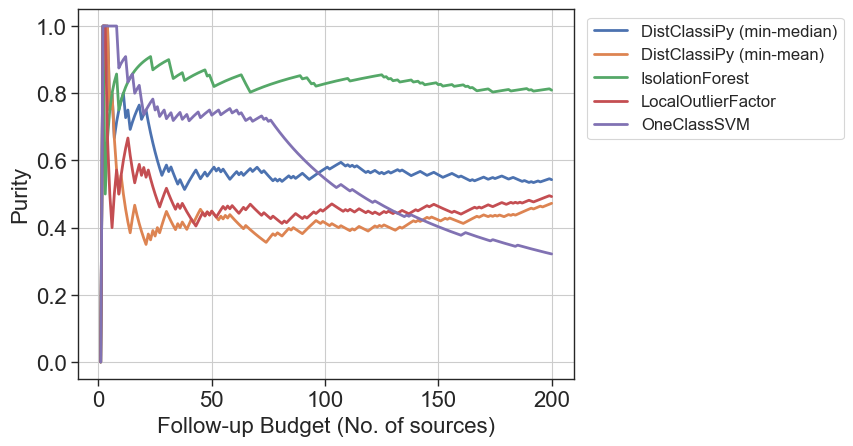

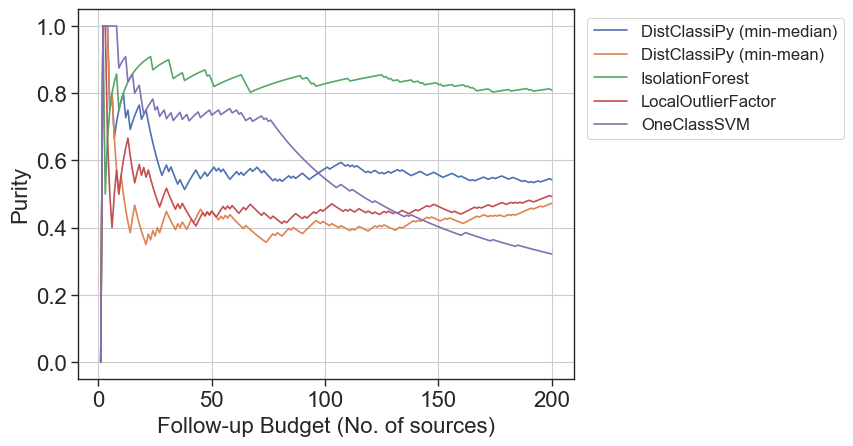

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 63
	Common % = 63.0%
***IsolationForest
	Common = 27
	Common % = 27.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 8
	Common % = 8.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 29 (29.0%)
status
normal       38
anomalous    33
Name: count, dtype: int64
status
normal       0.535211
anomalous    0.464789
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
12874225,DSCT,anomalous
140955823,DSCT,anomalous
48726309,DSCT,anomalous
39800396,CEP,normal
43757557,DSCT,anomalous
8591142,SNII-NMF,normal
145318115,DSCT,anomalous
15660705,DSCT,anomalous
19094894,DSCT,anomalous


score_DistClassiPy (min-mean)


,class,status
snid,,
12874225,DSCT,anomalous
140955823,DSCT,anomalous
48726309,DSCT,anomalous
39800396,CEP,normal
145318115,DSCT,anomalous
99295996,SNIIn-MOSFIT,normal
136000172,dwarf-nova,normal
86051575,SLSN-I+host,normal
97153243,DSCT,anomalous


score_IsolationForest


,class,status
snid,,
158182542,DSCT,anomalous
39800396,CEP,normal
88027215,DSCT,anomalous
30406196,DSCT,anomalous
129423123,DSCT,anomalous
41352453,DSCT,anomalous
25095194,DSCT,anomalous
2746505,CEP,normal
50430377,DSCT,anomalous


score_LocalOutlierFactor


,class,status
snid,,
140955823,DSCT,anomalous
48726309,DSCT,anomalous
10498551,SNIIn+HostXT_V19,normal
39800396,CEP,normal
93099457,SNIIn-MOSFIT,normal
62388074,DSCT,anomalous
97153243,DSCT,anomalous
6131735,AGN,normal
12874225,DSCT,anomalous


score_OneClassSVM


,class,status
snid,,
97153243,DSCT,anomalous
140955823,DSCT,anomalous
48726309,DSCT,anomalous
62388074,DSCT,anomalous
12874225,DSCT,anomalous
40489115,DSCT,anomalous
40256654,DSCT,anomalous
2008943,dwarf-nova,normal
79486150,DSCT,anomalous


********************************************************************************
********************************  ANOMALY: ILOT  ********************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       65
anomalous    35
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       81
anomalous    19
Name: count, dtype: int64

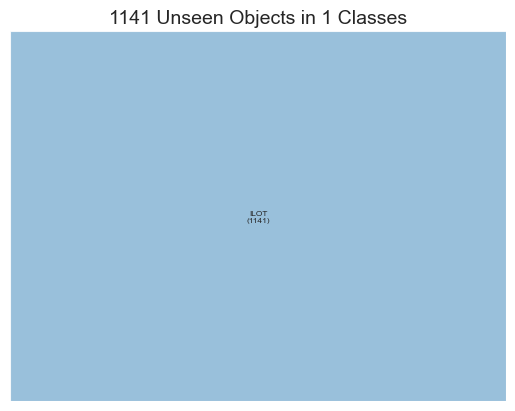

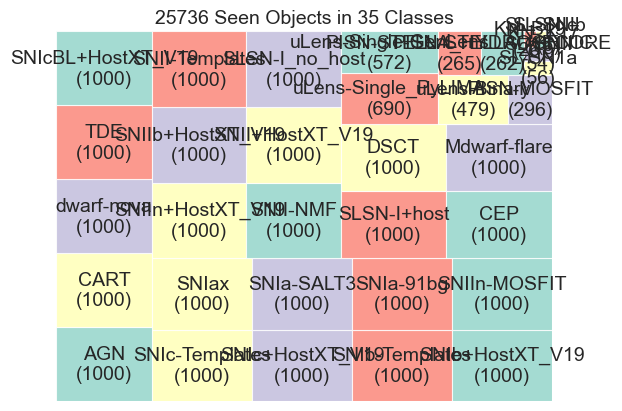

Total anoms:
status
normal       28318
anomalous     1141
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.97
anomalous    0.03
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.735
anomalous    0.265
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.55
anomalous    0.45
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

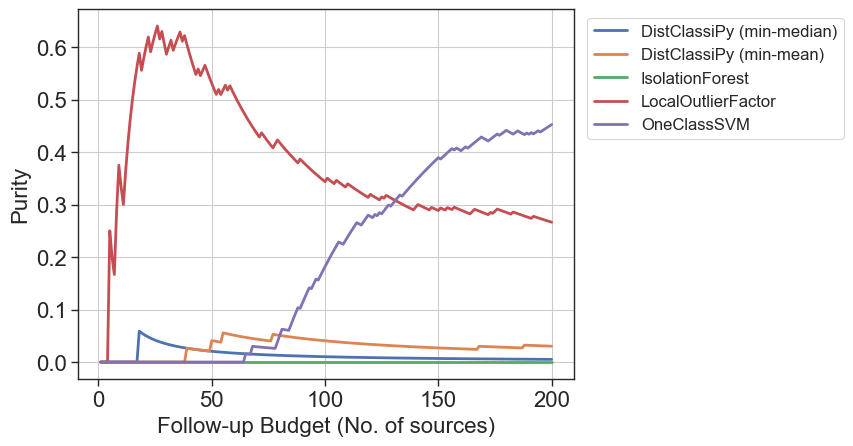

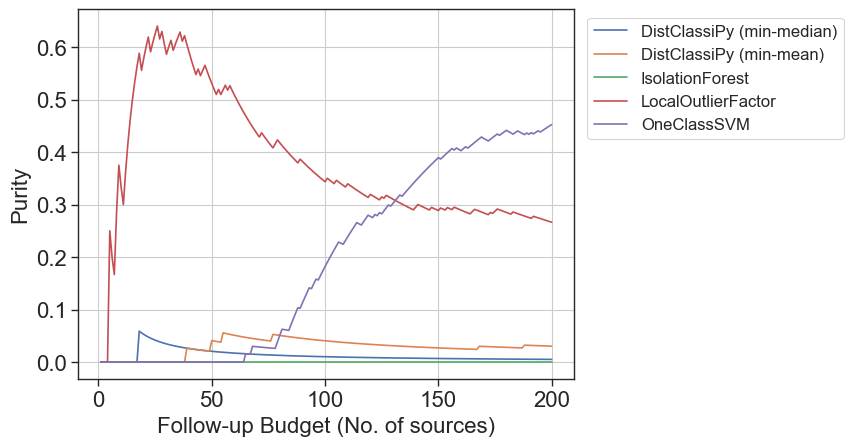

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 56
	Common % = 56.0%
***IsolationForest
	Common = 16
	Common % = 16.0%
***LocalOutlierFactor
	Common = 4
	Common % = 4.0%
***OneClassSVM
	Common = 8
	Common % = 8.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 20 (20.0%)
status
normal       79
anomalous     1
Name: count, dtype: int64
status
normal       0.9875
anomalous    0.0125
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
8591142,SNII-NMF,normal
145318115,DSCT,normal
8200402,SNIIn+HostXT_V19,normal
12894334,SNIIn+HostXT_V19,normal
17927341,SNII-NMF,normal
152540129,SNIIn-MOSFIT,normal
106621934,TDE,normal
84807149,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
140955823,DSCT,normal
34892193,dwarf-nova,normal
23353678,dwarf-nova,normal
145318115,DSCT,normal
12894334,SNIIn+HostXT_V19,normal
99295996,SNIIn-MOSFIT,normal
8591142,SNII-NMF,normal
17927341,SNII-NMF,normal


score_IsolationForest


,class,status
snid,,
42088553,AGN,normal
80651702,dwarf-nova,normal
97153243,DSCT,normal
88027215,DSCT,normal
158182542,DSCT,normal
2746505,CEP,normal
35547238,DSCT,normal
30406196,DSCT,normal
140005137,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
10498551,SNIIn+HostXT_V19,normal
140955823,DSCT,normal
15742380,ILOT,anomalous
93099457,SNIIn-MOSFIT,normal
106532076,TDE,normal
140295603,ILOT,anomalous
36203646,ILOT,anomalous
34892193,dwarf-nova,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
34892193,dwarf-nova,normal
62388074,DSCT,normal
64078252,dwarf-nova,normal
97153243,DSCT,normal
70950988,DSCT,normal
97986635,DSCT,normal
26482462,dwarf-nova,normal
34576023,dwarf-nova,normal


********************************************************************************
*******************************  ANOMALY: KN_B19  *******************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare      

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       99
anomalous     1
Name: count, dtype: int64

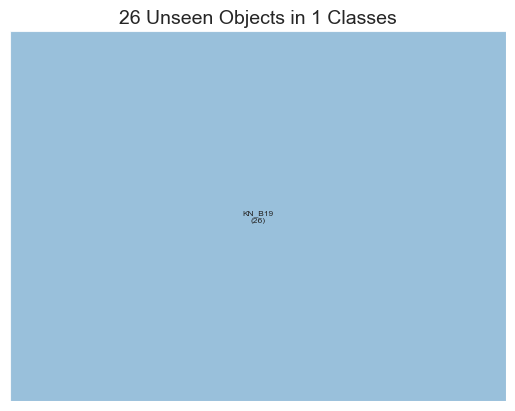

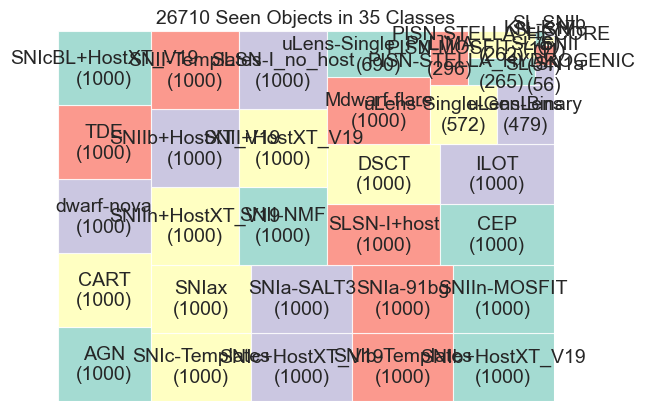

Total anoms:
status
normal       28459
anomalous       26
Name: count, dtype: int64
********** Check top 26 candidates for each model **********

--- Top 26 candidates for DistClassiPy (min-median) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 26 candidates for DistClassiPy (min-mean) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 26 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 26 candidates for LocalOutlierFactor ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 26 candidates for OneClassSVM ---


status
normal    1.0
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

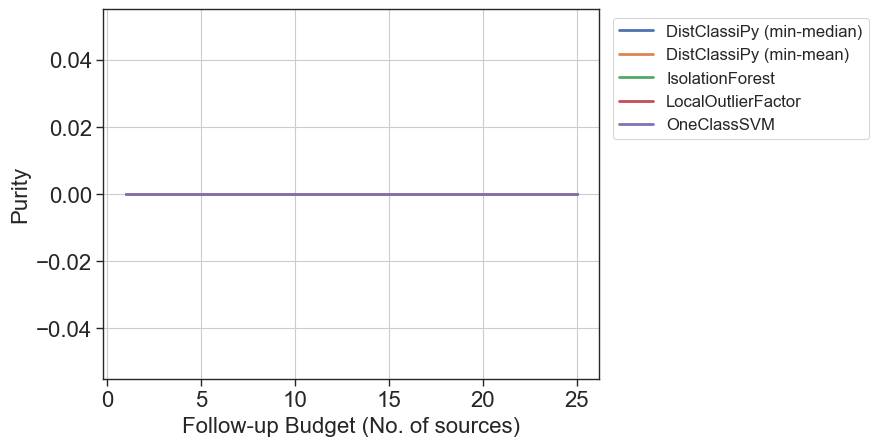

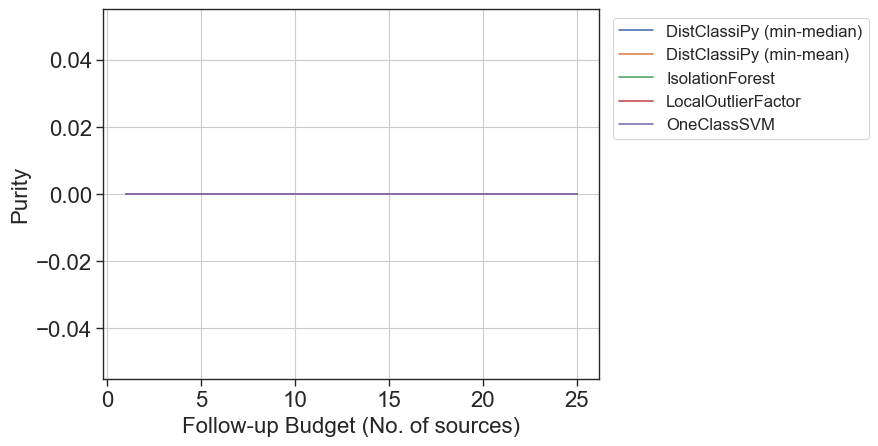

Comparing top 26 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 14
	Common % = 53.8%
***IsolationForest
	Common = 4
	Common % = 15.4%
***LocalOutlierFactor
	Common = 5
	Common % = 19.2%
***OneClassSVM
	Common = 5
	Common % = 19.2%
DistClassiPy (min-median) common with top 26 for ALL OTHER: 7 (26.9%)
status
normal    19
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,normal
48726309,DSCT,normal
145318115,DSCT,normal
39800396,CEP,normal
6638537,SNII+HostXT_V19,normal
134139354,TDE,normal
12894334,SNIIn+HostXT_V19,normal
8700272,SNII+HostXT_V19,normal
8591142,SNII-NMF,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,normal
48726309,DSCT,normal
39800396,CEP,normal
140955823,DSCT,normal
145318115,DSCT,normal
34892193,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
12894334,SNIIn+HostXT_V19,normal
3365416,SNIa-SALT3,normal


score_IsolationForest


,class,status
snid,,
39800396,CEP,normal
158182542,DSCT,normal
25095194,DSCT,normal
30406196,DSCT,normal
88027215,DSCT,normal
50430377,DSCT,normal
97153243,DSCT,normal
98945395,DSCT,normal
149692731,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,normal
140955823,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
48726309,DSCT,normal
34892193,dwarf-nova,normal
106532076,TDE,normal
46505442,CEP,normal
39800396,CEP,normal
150740300,TDE,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
48726309,DSCT,normal
34892193,dwarf-nova,normal
62388074,DSCT,normal
155481312,CEP,normal
97153243,DSCT,normal
39800396,CEP,normal
97986635,DSCT,normal
70950988,DSCT,normal


********************************************************************************
*******************************  ANOMALY: KN_K17  *******************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare      

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal    100
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

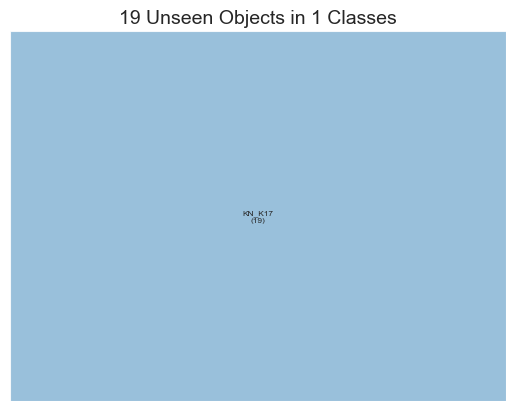

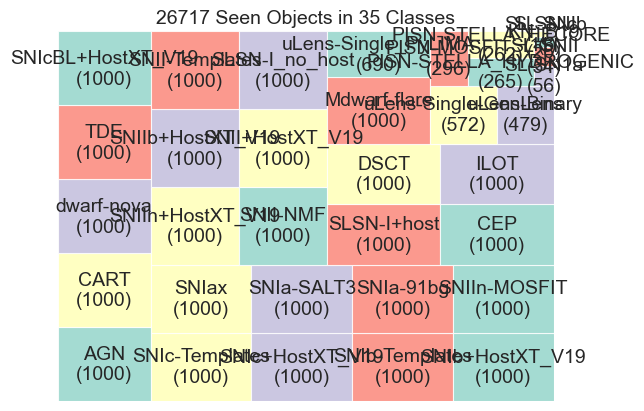

Total anoms:
status
normal       28459
anomalous       19
Name: count, dtype: int64
********** Check top 19 candidates for each model **********

--- Top 19 candidates for DistClassiPy (min-median) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 19 candidates for DistClassiPy (min-mean) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 19 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 19 candidates for LocalOutlierFactor ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 19 candidates for OneClassSVM ---


status
normal    1.0
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

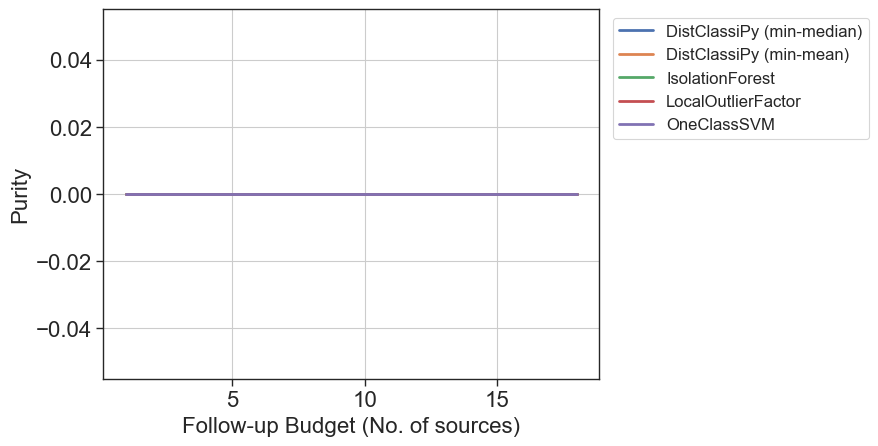

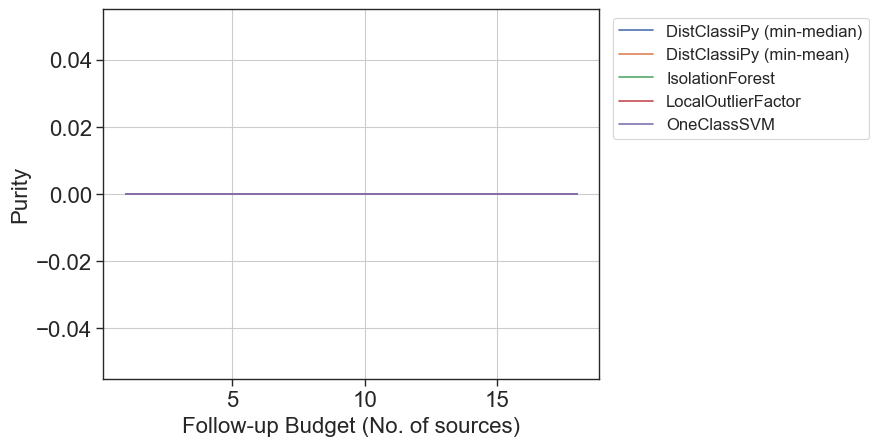

Comparing top 19 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 8
	Common % = 42.1%
***IsolationForest
	Common = 4
	Common % = 21.1%
***LocalOutlierFactor
	Common = 4
	Common % = 21.1%
***OneClassSVM
	Common = 4
	Common % = 21.1%
DistClassiPy (min-median) common with top 19 for ALL OTHER: 5 (26.3%)
status
normal    14
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
12874225,DSCT,normal
145318115,DSCT,normal
48726309,DSCT,normal
6638537,SNII+HostXT_V19,normal
142891596,DSCT,normal
39800396,CEP,normal
8591142,SNII-NMF,normal
19369061,DSCT,normal
140955823,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
34892193,dwarf-nova,normal
145318115,DSCT,normal
39800396,CEP,normal
6638537,SNII+HostXT_V19,normal
89915162,TDE,normal
19550954,CART,normal


score_IsolationForest


,class,status
snid,,
158182542,DSCT,normal
88027215,DSCT,normal
80651702,dwarf-nova,normal
35547238,DSCT,normal
39800396,CEP,normal
97153243,DSCT,normal
12874225,DSCT,normal
30406196,DSCT,normal
42088553,AGN,normal


score_LocalOutlierFactor


,class,status
snid,,
140955823,DSCT,normal
48726309,DSCT,normal
93099457,SNIIn-MOSFIT,normal
34892193,dwarf-nova,normal
39800396,CEP,normal
4357262,SNIc-Templates,normal
106532076,TDE,normal
46505442,CEP,normal
24672901,AGN,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
34892193,dwarf-nova,normal
48726309,DSCT,normal
12874225,DSCT,normal
97153243,DSCT,normal
39800396,CEP,normal
101267830,dwarf-nova,normal
97986635,DSCT,normal
70950988,DSCT,normal


********************************************************************************
****************************  ANOMALY: Mdwarf-flare  ****************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       92
anomalous     8
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       99
anomalous     1
Name: count, dtype: int64

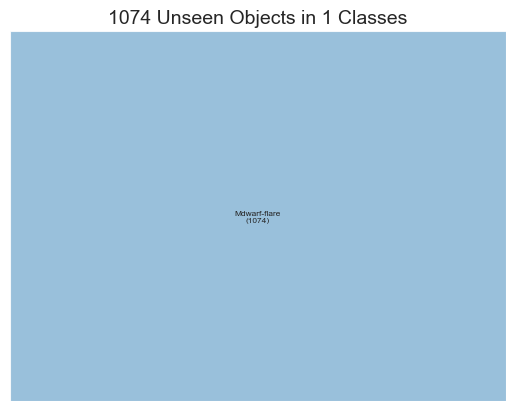

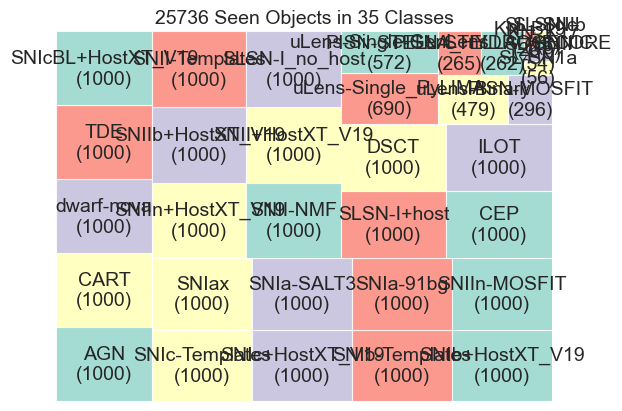

Total anoms:
status
normal       28385
anomalous     1074
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.96
anomalous    0.04
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.93
anomalous    0.07
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.94
anomalous    0.06
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

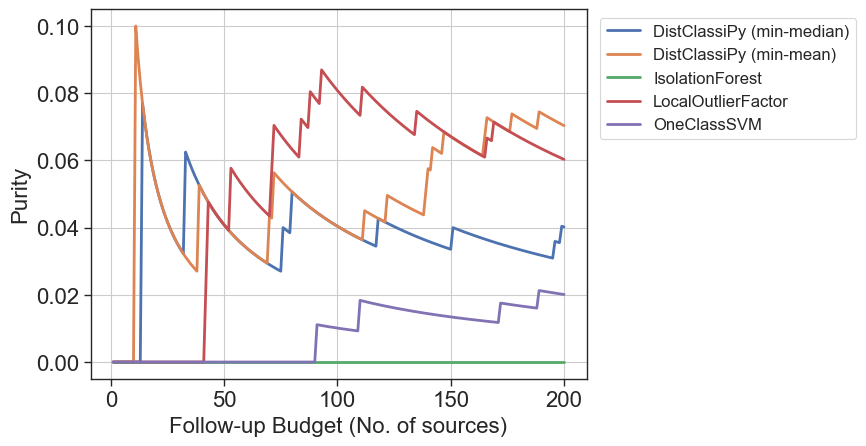

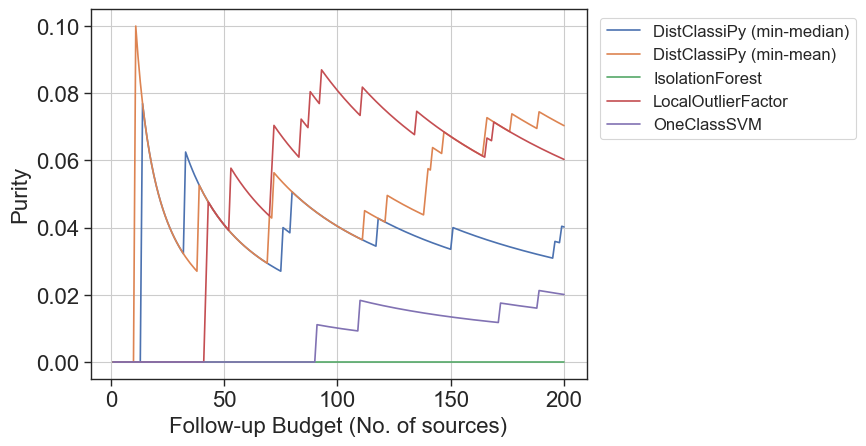

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 56
	Common % = 56.0%
***IsolationForest
	Common = 20
	Common % = 20.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 8
	Common % = 8.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 23 (23.0%)
status
normal       73
anomalous     4
Name: count, dtype: int64
status
normal       0.948052
anomalous    0.051948
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
145318115,DSCT,normal
17927341,SNII-NMF,normal
8200402,SNIIn+HostXT_V19,normal
23353678,dwarf-nova,normal
106621934,TDE,normal
5060681,AGN,normal
84807149,DSCT,normal
89915162,TDE,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
12874225,DSCT,normal
140955823,DSCT,normal
138399094,CEP,normal
48726309,DSCT,normal
23353678,dwarf-nova,normal
145318115,DSCT,normal
5060681,AGN,normal
17927341,SNII-NMF,normal


score_IsolationForest


,class,status
snid,,
158182542,DSCT,normal
42088553,AGN,normal
88027215,DSCT,normal
135511375,CEP,normal
35547238,DSCT,normal
129423123,DSCT,normal
30406196,DSCT,normal
50430377,DSCT,normal
25095194,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
140955823,DSCT,normal
48726309,DSCT,normal
138399094,CEP,normal
10498551,SNIIn+HostXT_V19,normal
24672901,AGN,normal
62388074,DSCT,normal
93099457,SNIIn-MOSFIT,normal
106532076,TDE,normal


score_OneClassSVM


,class,status
snid,,
62388074,DSCT,normal
140955823,DSCT,normal
64078252,dwarf-nova,normal
48726309,DSCT,normal
12874225,DSCT,normal
79486150,DSCT,normal
40256654,DSCT,normal
2008943,dwarf-nova,normal
40489115,DSCT,normal


********************************************************************************
****************************  ANOMALY: PISN-MOSFIT  ****************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
SLSN-I+host        

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal    100
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal    100
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

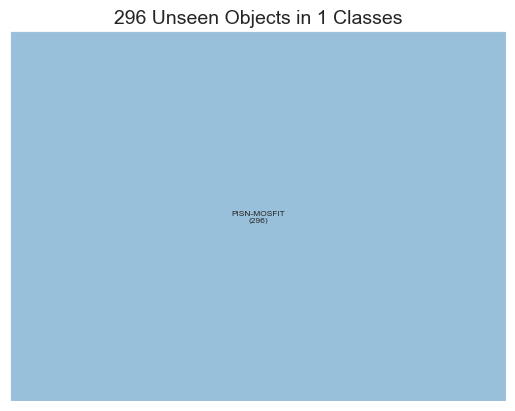

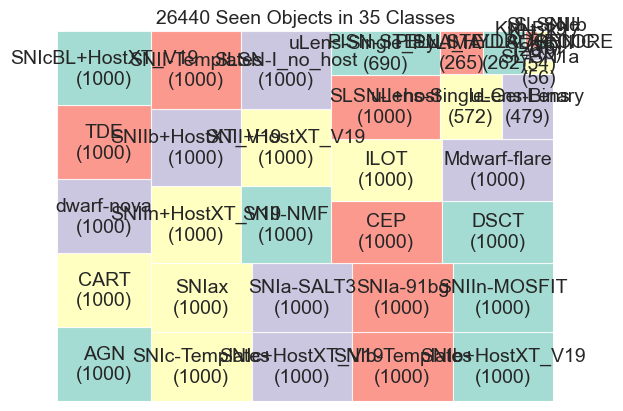

Total anoms:
status
normal       28459
anomalous      296
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal    1.0
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

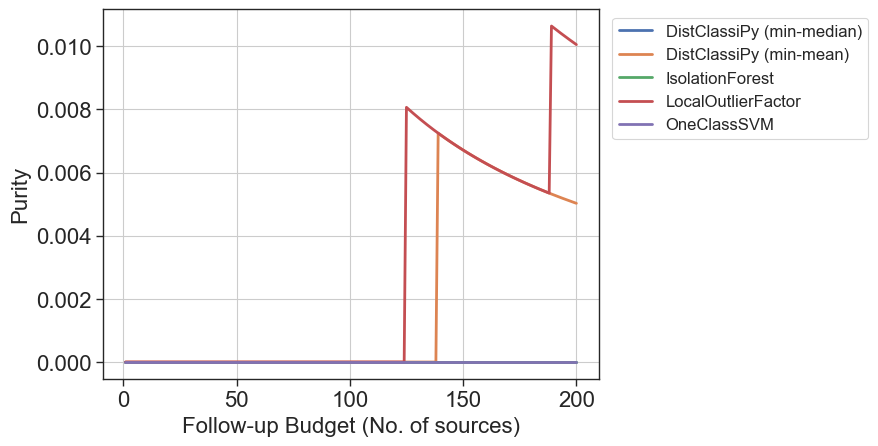

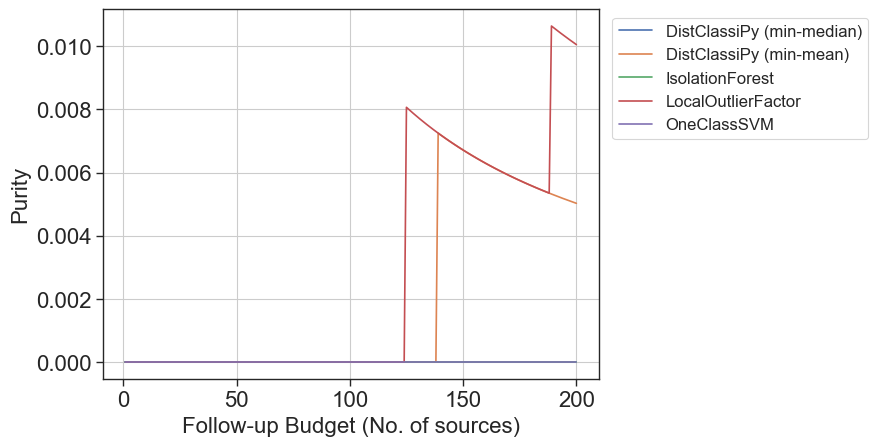

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 61
	Common % = 61.0%
***IsolationForest
	Common = 21
	Common % = 21.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 10
	Common % = 10.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 26 (26.0%)
status
normal    74
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
12874225,DSCT,normal
145318115,DSCT,normal
48726309,DSCT,normal
39800396,CEP,normal
17927341,SNII-NMF,normal
134139354,TDE,normal
19369061,DSCT,normal
64916976,SNIIn-MOSFIT,normal
12894334,SNIIn+HostXT_V19,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
39800396,CEP,normal
145318115,DSCT,normal
34892193,dwarf-nova,normal
12894334,SNIIn+HostXT_V19,normal
86051575,SLSN-I+host,normal
17927341,SNII-NMF,normal


score_IsolationForest


,class,status
snid,,
42088553,AGN,normal
158182542,DSCT,normal
135511375,CEP,normal
88027215,DSCT,normal
25095194,DSCT,normal
39800396,CEP,normal
2746505,CEP,normal
97153243,DSCT,normal
50430377,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
140955823,DSCT,normal
48726309,DSCT,normal
154302958,DSCT,normal
34892193,dwarf-nova,normal
10498551,SNIIn+HostXT_V19,normal
24672901,AGN,normal
46505442,CEP,normal
59882945,AGN,normal
8016756,SNII-NMF,normal


score_OneClassSVM


,class,status
snid,,
34892193,dwarf-nova,normal
62388074,DSCT,normal
48726309,DSCT,normal
12874225,DSCT,normal
140955823,DSCT,normal
97153243,DSCT,normal
40489115,DSCT,normal
40256654,DSCT,normal
2008943,dwarf-nova,normal


********************************************************************************
*************************  ANOMALY: PISN-STELLA_HECORE  *************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
SLSN-I+host       

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal    100
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal    100
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

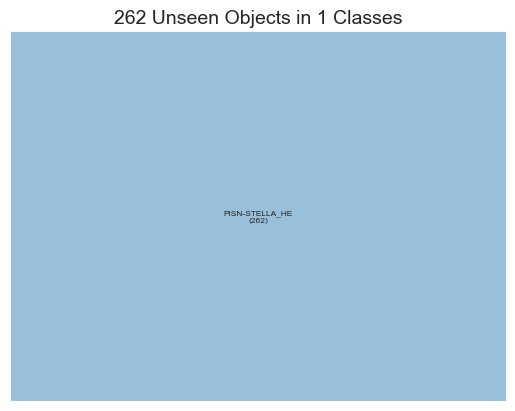

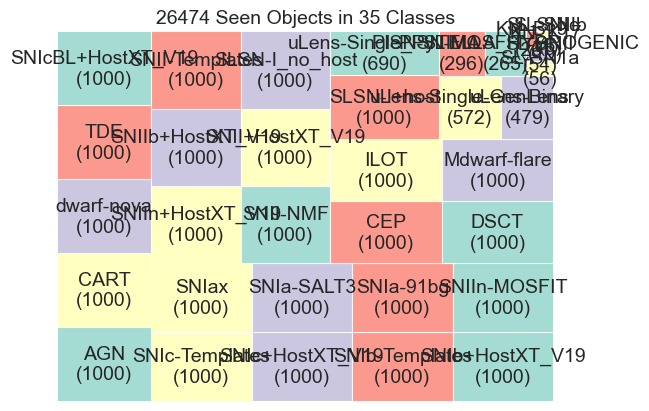

Total anoms:
status
normal       28459
anomalous      262
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal    1.0
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

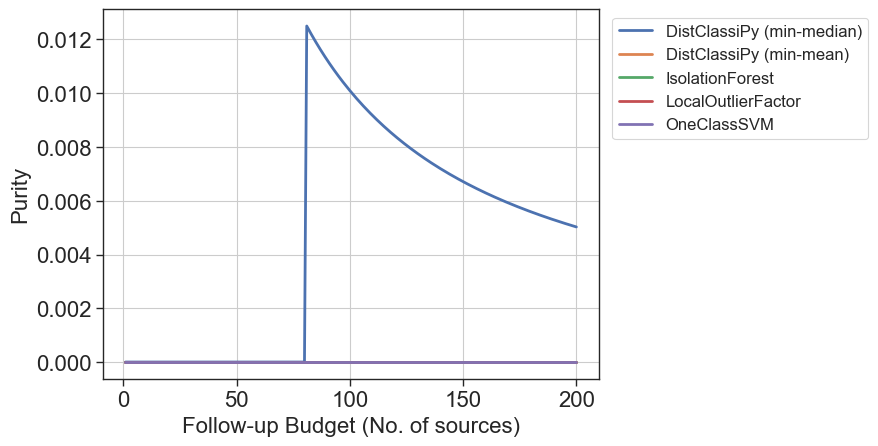

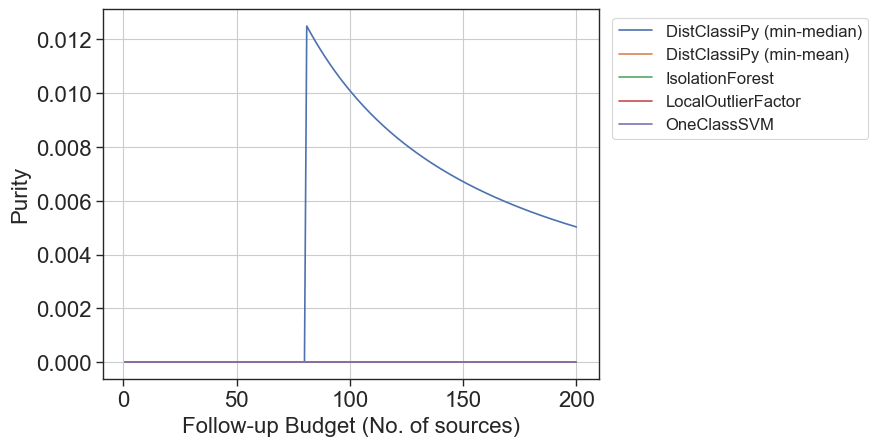

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 54
	Common % = 54.0%
***IsolationForest
	Common = 20
	Common % = 20.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 12
	Common % = 12.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 26 (26.0%)
status
normal       73
anomalous     1
Name: count, dtype: int64
status
normal       0.986486
anomalous    0.013514
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
12874225,DSCT,normal
145318115,DSCT,normal
48726309,DSCT,normal
134139354,TDE,normal
142891596,DSCT,normal
17927341,SNII-NMF,normal
43757557,DSCT,normal
23353678,dwarf-nova,normal
8591142,SNII-NMF,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
34892193,dwarf-nova,normal
145318115,DSCT,normal
23353678,dwarf-nova,normal
3365416,SNIa-SALT3,normal
86051575,SLSN-I+host,normal
136000172,dwarf-nova,normal


score_IsolationForest


,class,status
snid,,
2746505,CEP,normal
42088553,AGN,normal
50430377,DSCT,normal
97153243,DSCT,normal
30406196,DSCT,normal
129423123,DSCT,normal
35547238,DSCT,normal
80651702,dwarf-nova,normal
158182542,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
140955823,DSCT,normal
48726309,DSCT,normal
15742380,ILOT,normal
93099457,SNIIn-MOSFIT,normal
34892193,dwarf-nova,normal
22922254,SNIb-Templates,normal
24672901,AGN,normal
62388074,DSCT,normal
154302958,DSCT,normal


score_OneClassSVM


,class,status
snid,,
34892193,dwarf-nova,normal
62388074,DSCT,normal
140955823,DSCT,normal
48726309,DSCT,normal
12874225,DSCT,normal
97153243,DSCT,normal
40489115,DSCT,normal
2008943,dwarf-nova,normal
40256654,DSCT,normal


********************************************************************************
***********************  ANOMALY: PISN-STELLA_HYDROGENIC  ***********************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                     1000
CART                    1000
dwarf-nova              1000
TDE                     1000
SNIcBL+HostXT_V19       1000
SNIc-Templates          1000
SNIc+HostXT_V19         1000
SNIb-Templates          1000
SNIb+HostXT_V19         1000
SNIax                   1000
SNIa-SALT3              1000
SNIa-91bg               1000
SNIIn-MOSFIT            1000
SNIIn+HostXT_V19        1000
SNIIb+HostXT_V19        1000
SNII-Templates          1000
SNII-NMF                1000
SNII+HostXT_V19         1000
SLSN-I_no_host          1000
CEP                     1000
DSCT                    1000
ILOT                    1000
Mdwarf-flare            1000
SLSN-I+host             1000
uLens-Single_PyLIMA      690
uLens-

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal    100
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

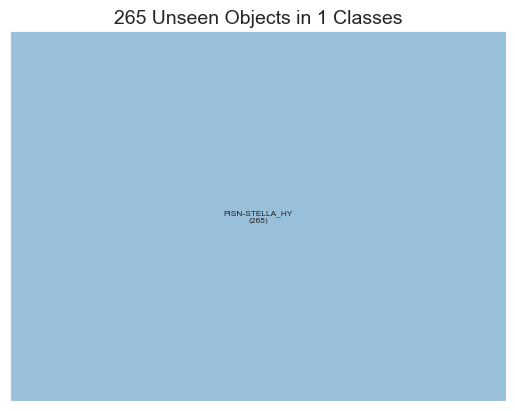

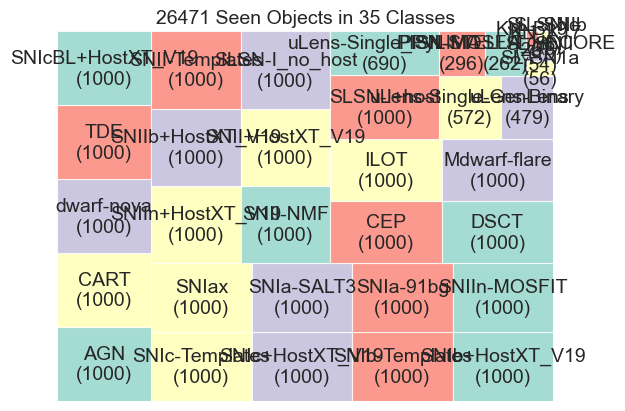

Total anoms:
status
normal       28459
anomalous      265
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal    1.0
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

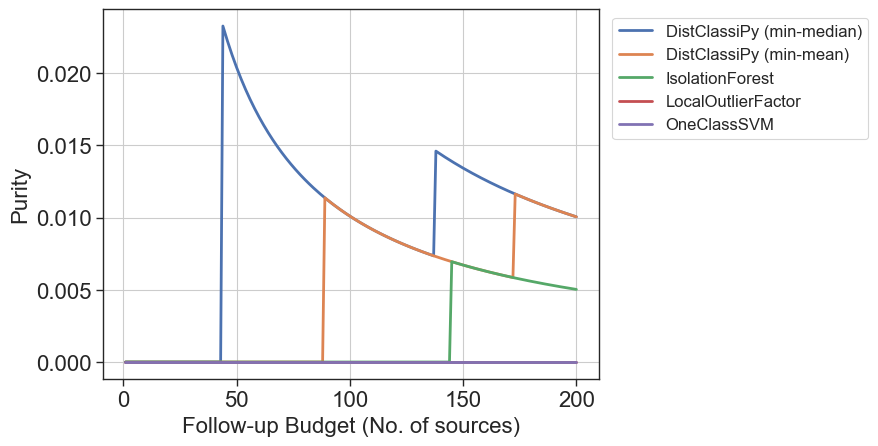

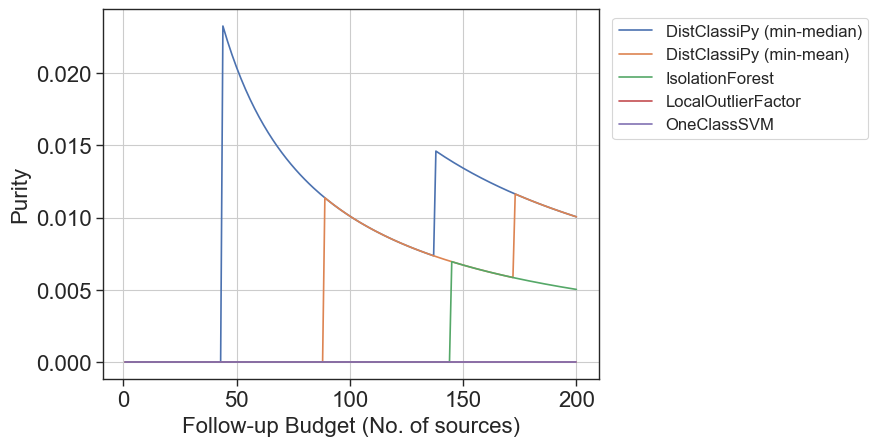

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 59
	Common % = 59.0%
***IsolationForest
	Common = 20
	Common % = 20.0%
***LocalOutlierFactor
	Common = 4
	Common % = 4.0%
***OneClassSVM
	Common = 13
	Common % = 13.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 23 (23.0%)
status
normal       76
anomalous     1
Name: count, dtype: int64
status
normal       0.987013
anomalous    0.012987
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
8200402,SNIIn+HostXT_V19,normal
17927341,SNII-NMF,normal
3365416,SNIa-SALT3,normal
84807149,DSCT,normal
106621934,TDE,normal
134139354,TDE,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
155481312,CEP,normal
12874225,DSCT,normal
140955823,DSCT,normal
48726309,DSCT,normal
34892193,dwarf-nova,normal
84807149,DSCT,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal


score_IsolationForest


,class,status
snid,,
129423123,DSCT,normal
30406196,DSCT,normal
88027215,DSCT,normal
158182542,DSCT,normal
97153243,DSCT,normal
134231880,DSCT,normal
50430377,DSCT,normal
149692731,DSCT,normal
41352453,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
10498551,SNIIn+HostXT_V19,normal
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
93099457,SNIIn-MOSFIT,normal
106532076,TDE,normal
34892193,dwarf-nova,normal
4357262,SNIc-Templates,normal


score_OneClassSVM


,class,status
snid,,
64078252,dwarf-nova,normal
48726309,DSCT,normal
140955823,DSCT,normal
155481312,CEP,normal
62388074,DSCT,normal
97153243,DSCT,normal
34892193,dwarf-nova,normal
12874225,DSCT,normal
51038624,DSCT,normal


********************************************************************************
******************************  ANOMALY: SL-SN1a  ******************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
SLSN-I+host        

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal    100
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal    100
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

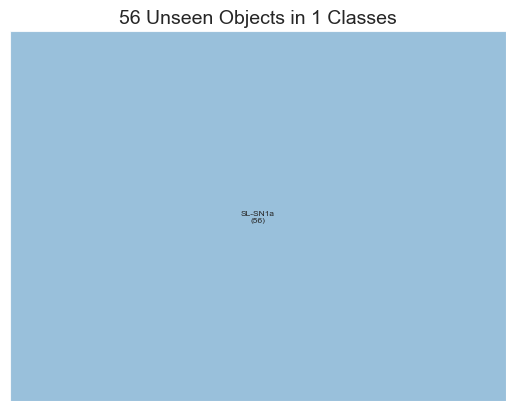

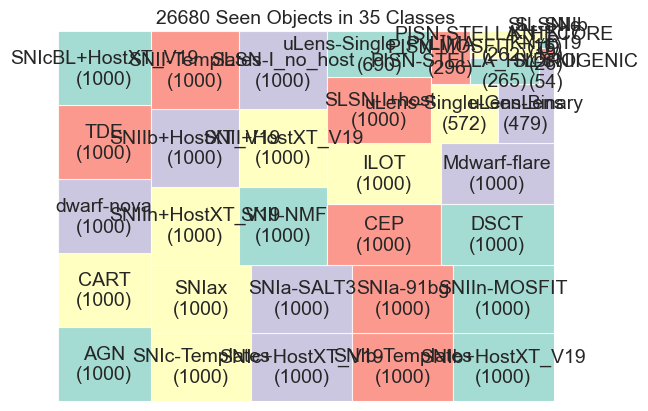

Total anoms:
status
normal       28459
anomalous       56
Name: count, dtype: int64
********** Check top 56 candidates for each model **********

--- Top 56 candidates for DistClassiPy (min-median) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 56 candidates for DistClassiPy (min-mean) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 56 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 56 candidates for LocalOutlierFactor ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 56 candidates for OneClassSVM ---


status
normal    1.0
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

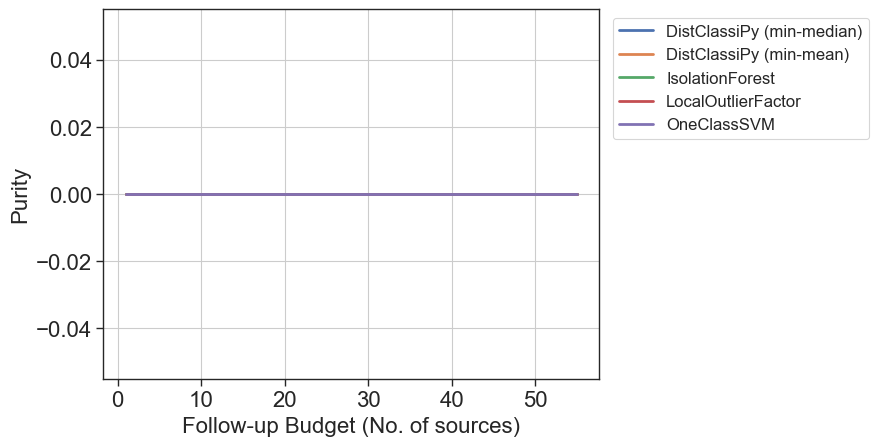

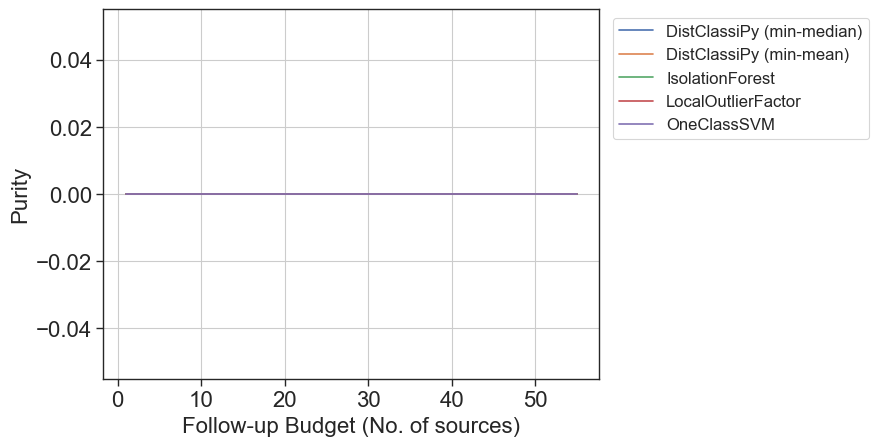

Comparing top 56 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 31
	Common % = 55.4%
***IsolationForest
	Common = 17
	Common % = 30.4%
***LocalOutlierFactor
	Common = 5
	Common % = 8.9%
***OneClassSVM
	Common = 9
	Common % = 16.1%
DistClassiPy (min-median) common with top 56 for ALL OTHER: 18 (32.1%)
status
normal    38
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,normal
48726309,DSCT,normal
12874225,DSCT,normal
140955823,DSCT,normal
39800396,CEP,normal
158182542,DSCT,normal
35547238,DSCT,normal
88027215,DSCT,normal
145318115,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
39800396,CEP,normal
35547238,DSCT,normal
140955823,DSCT,normal
158182542,DSCT,normal
145318115,DSCT,normal
12894334,SNIIn+HostXT_V19,normal


score_IsolationForest


,class,status
snid,,
158182542,DSCT,normal
30406196,DSCT,normal
88027215,DSCT,normal
50430377,DSCT,normal
42088553,AGN,normal
129423123,DSCT,normal
25095194,DSCT,normal
149692731,DSCT,normal
39800396,CEP,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
138399094,CEP,normal
39800396,CEP,normal
22922254,SNIb-Templates,normal
24672901,AGN,normal
9078946,DSCT,normal


score_OneClassSVM


,class,status
snid,,
12874225,DSCT,normal
138399094,CEP,normal
39800396,CEP,normal
140955823,DSCT,normal
155481312,CEP,normal
48726309,DSCT,normal
62388074,DSCT,normal
97986635,DSCT,normal
70950988,DSCT,normal


********************************************************************************
******************************  ANOMALY: SL-SNII  ******************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
SLSN-I+host        

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal    100
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal    100
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

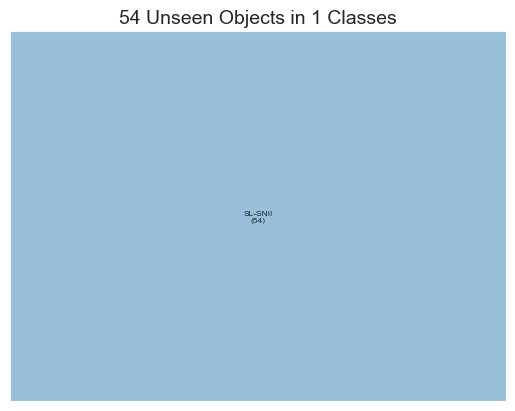

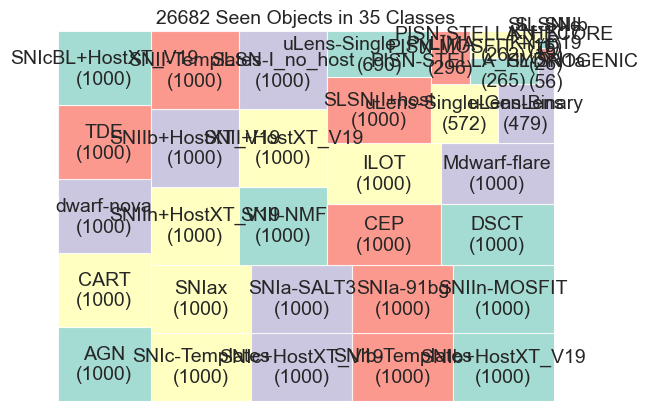

Total anoms:
status
normal       28459
anomalous       54
Name: count, dtype: int64
********** Check top 54 candidates for each model **********

--- Top 54 candidates for DistClassiPy (min-median) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 54 candidates for DistClassiPy (min-mean) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 54 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 54 candidates for LocalOutlierFactor ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 54 candidates for OneClassSVM ---


status
normal    1.0
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

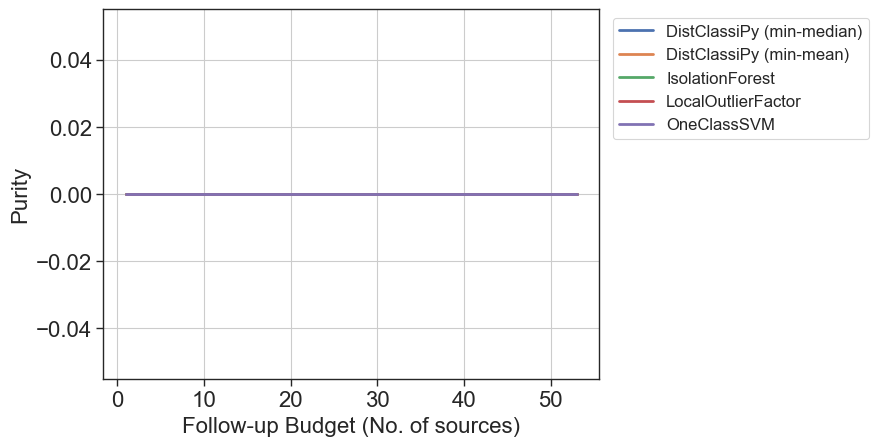

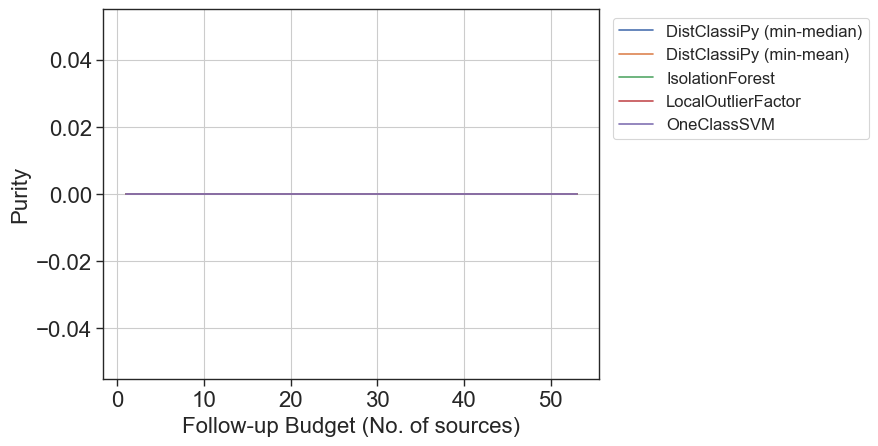

Comparing top 54 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 32
	Common % = 59.3%
***IsolationForest
	Common = 6
	Common % = 11.1%
***LocalOutlierFactor
	Common = 4
	Common % = 7.4%
***OneClassSVM
	Common = 9
	Common % = 16.7%
DistClassiPy (min-median) common with top 54 for ALL OTHER: 11 (20.4%)
status
normal    43
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
8591142,SNII-NMF,normal
145318115,DSCT,normal
12894334,SNIIn+HostXT_V19,normal
8200402,SNIIn+HostXT_V19,normal
17927341,SNII-NMF,normal
3365416,SNIa-SALT3,normal
23353678,dwarf-nova,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
12874225,DSCT,normal
140955823,DSCT,normal
34892193,dwarf-nova,normal
138399094,CEP,normal
23353678,dwarf-nova,normal
48726309,DSCT,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal


score_IsolationForest


,class,status
snid,,
2746505,CEP,normal
97153243,DSCT,normal
42088553,AGN,normal
35547238,DSCT,normal
88027215,DSCT,normal
140005137,DSCT,normal
25095194,DSCT,normal
50430377,DSCT,normal
48726309,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
140955823,DSCT,normal
48726309,DSCT,normal
93099457,SNIIn-MOSFIT,normal
34892193,dwarf-nova,normal
4357262,SNIc-Templates,normal
22922254,SNIb-Templates,normal
138399094,CEP,normal
46505442,CEP,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
12874225,DSCT,normal
64078252,dwarf-nova,normal
34892193,dwarf-nova,normal
48726309,DSCT,normal
97153243,DSCT,normal
138399094,CEP,normal
2746505,CEP,normal
34576023,dwarf-nova,normal


********************************************************************************
******************************  ANOMALY: SL-SNIb  ******************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
SLSN-I+host        

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal    100
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal    100
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

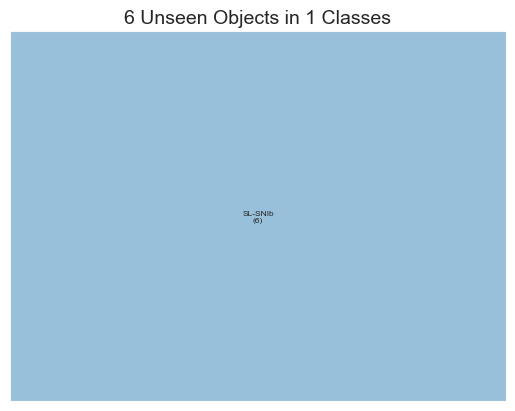

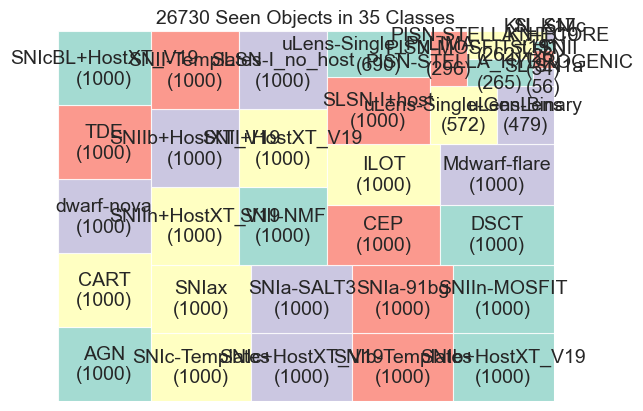

Total anoms:
status
normal       28459
anomalous        6
Name: count, dtype: int64
********** Check top 6 candidates for each model **********

--- Top 6 candidates for DistClassiPy (min-median) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 6 candidates for DistClassiPy (min-mean) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 6 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 6 candidates for LocalOutlierFactor ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 6 candidates for OneClassSVM ---


status
normal    1.0
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

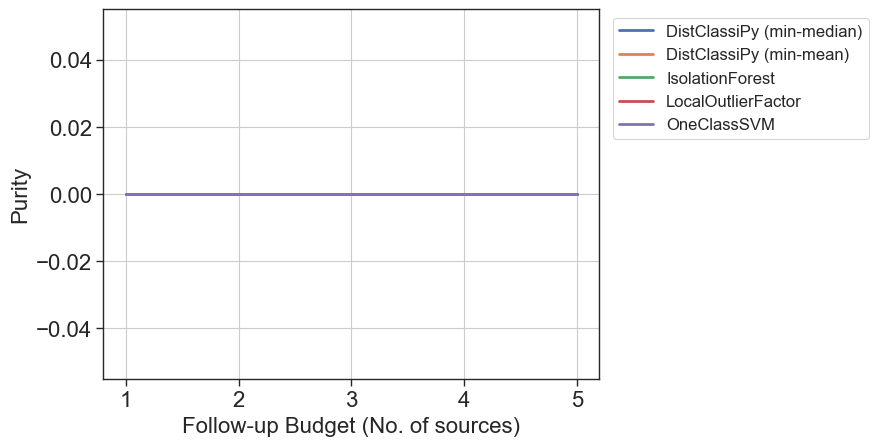

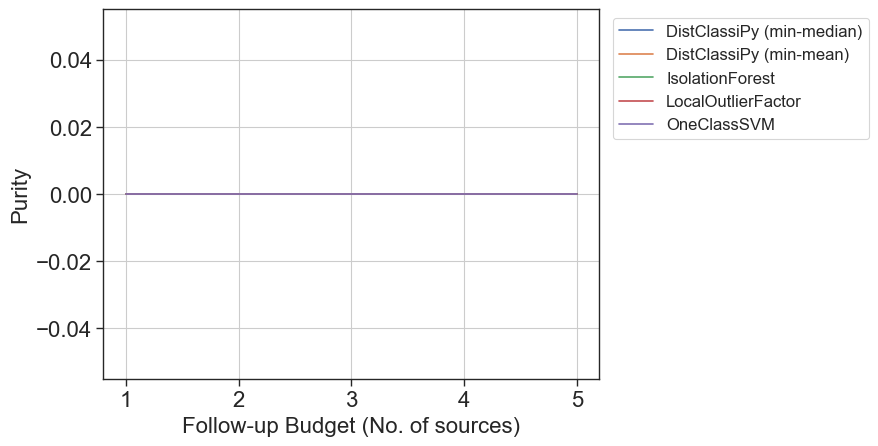

Comparing top 6 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 1
	Common % = 16.7%
***IsolationForest
	Common = 0
	Common % = 0.0%
***LocalOutlierFactor
	Common = 1
	Common % = 16.7%
***OneClassSVM
	Common = 1
	Common % = 16.7%
DistClassiPy (min-median) common with top 6 for ALL OTHER: 1 (16.7%)
status
normal    5
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
15778858,SNIIn+HostXT_V19,normal
17927341,SNII-NMF,normal
1544999,SNII+HostXT_V19,normal
145318115,DSCT,normal
38304588,SNIIb+HostXT_V19,normal
106621934,TDE,normal
8200402,SNIIn+HostXT_V19,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
12874225,DSCT,normal
140955823,DSCT,normal
138399094,CEP,normal
48726309,DSCT,normal
39800396,CEP,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
38304588,SNIIb+HostXT_V19,normal


score_IsolationForest


,class,status
snid,,
158182542,DSCT,normal
39800396,CEP,normal
35547238,DSCT,normal
30406196,DSCT,normal
129423123,DSCT,normal
25095194,DSCT,normal
50430377,DSCT,normal
88027215,DSCT,normal
80651702,dwarf-nova,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
10498551,SNIIn+HostXT_V19,normal
140955823,DSCT,normal
48726309,DSCT,normal
4357262,SNIc-Templates,normal
138399094,CEP,normal
39800396,CEP,normal
106532076,TDE,normal
46505442,CEP,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
39800396,CEP,normal
64078252,dwarf-nova,normal
62388074,DSCT,normal
48726309,DSCT,normal
138399094,CEP,normal
12874225,DSCT,normal
97153243,DSCT,normal
34576023,dwarf-nova,normal


********************************************************************************
******************************  ANOMALY: SL-SNIc  ******************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
SLSN-I+host        

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal    100
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal    100
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

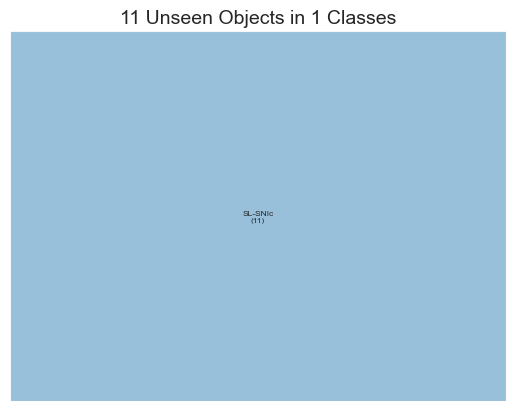

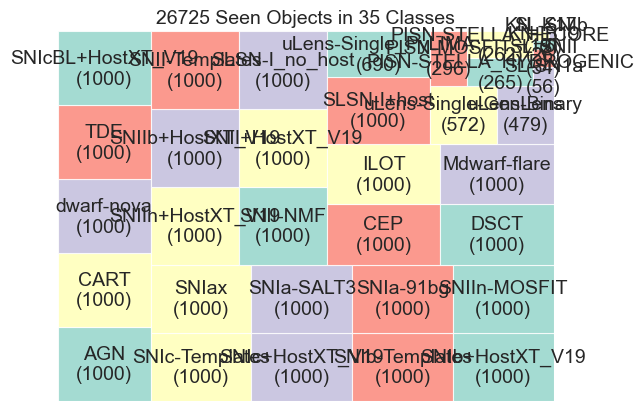

Total anoms:
status
normal       28459
anomalous       11
Name: count, dtype: int64
********** Check top 11 candidates for each model **********

--- Top 11 candidates for DistClassiPy (min-median) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 11 candidates for DistClassiPy (min-mean) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 11 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 11 candidates for LocalOutlierFactor ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 11 candidates for OneClassSVM ---


status
normal    1.0
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

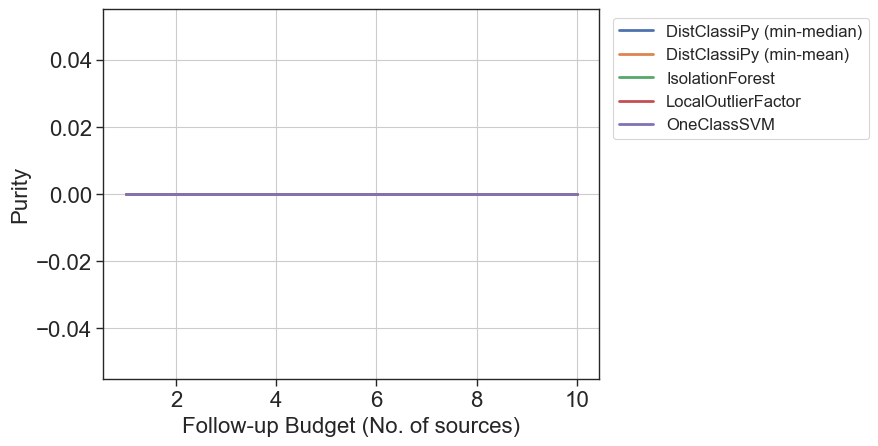

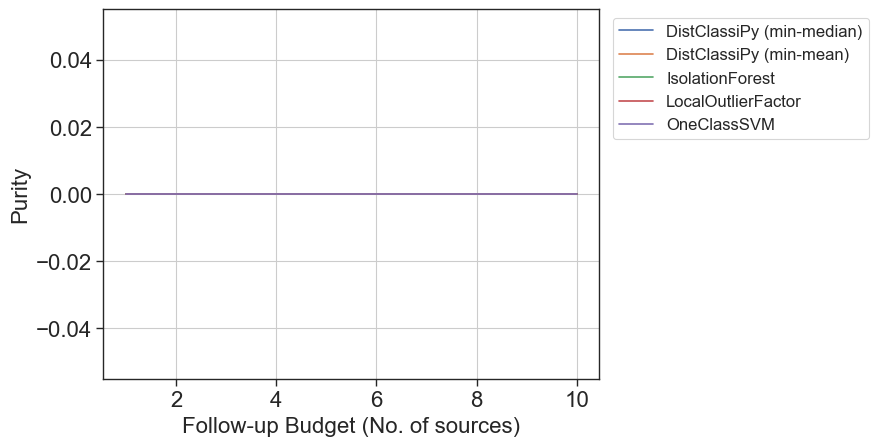

Comparing top 11 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 4
	Common % = 36.4%
***IsolationForest
	Common = 0
	Common % = 0.0%
***LocalOutlierFactor
	Common = 1
	Common % = 9.1%
***OneClassSVM
	Common = 1
	Common % = 9.1%
DistClassiPy (min-median) common with top 11 for ALL OTHER: 1 (9.1%)
status
normal    10
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
8591142,SNII-NMF,normal
3365416,SNIa-SALT3,normal
43757557,DSCT,normal
23353678,dwarf-nova,normal
152540129,SNIIn-MOSFIT,normal
84807149,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
155481312,CEP,normal
140955823,DSCT,normal
12874225,DSCT,normal
48726309,DSCT,normal
39800396,CEP,normal
23353678,dwarf-nova,normal
97153243,DSCT,normal
34892193,dwarf-nova,normal


score_IsolationForest


,class,status
snid,,
158182542,DSCT,normal
129423123,DSCT,normal
88027215,DSCT,normal
35547238,DSCT,normal
39800396,CEP,normal
50430377,DSCT,normal
30406196,DSCT,normal
135511375,CEP,normal
98945395,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
93099457,SNIIn-MOSFIT,normal
39800396,CEP,normal
34892193,dwarf-nova,normal
106532076,TDE,normal
46505442,CEP,normal


score_OneClassSVM


,class,status
snid,,
2008943,dwarf-nova,normal
39800396,CEP,normal
97153243,DSCT,normal
64078252,dwarf-nova,normal
62388074,DSCT,normal
40256654,DSCT,normal
140955823,DSCT,normal
40489115,DSCT,normal
155481312,CEP,normal


********************************************************************************
****************************  ANOMALY: SLSN-I+host  ****************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       87
anomalous    13
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       95
anomalous     5
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       99
anomalous     1
Name: count, dtype: int64

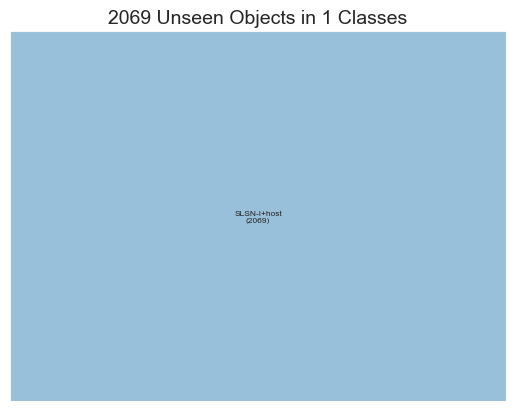

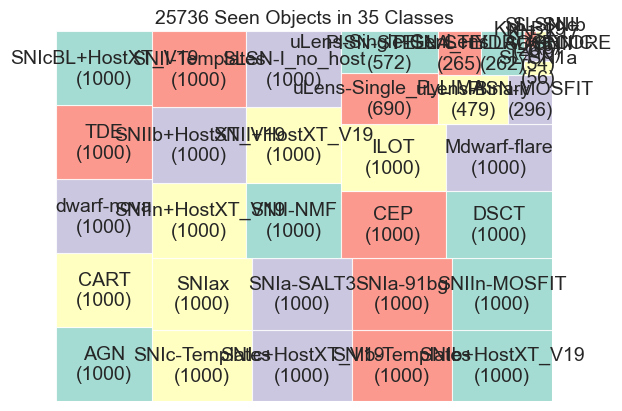

Total anoms:
status
normal       27390
anomalous     2069
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.875
anomalous    0.125
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.945
anomalous    0.055
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.97
anomalous    0.03
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

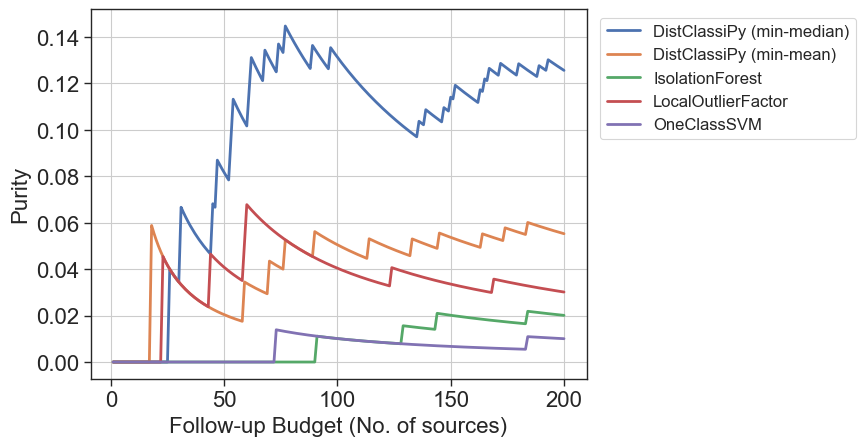

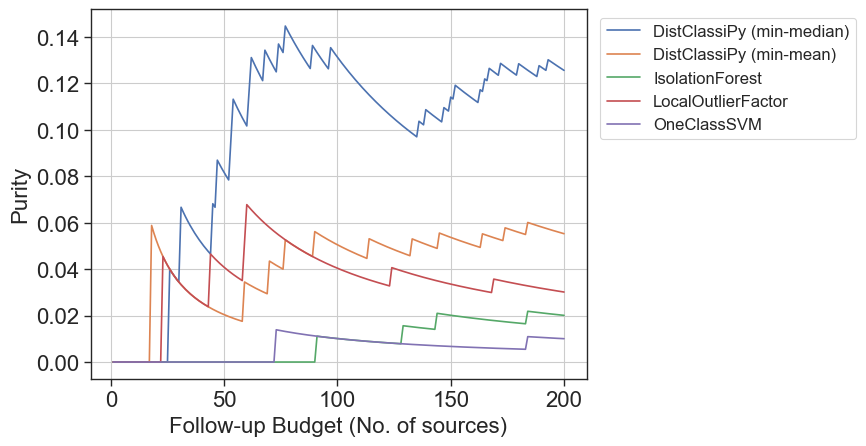

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 48
	Common % = 48.0%
***IsolationForest
	Common = 18
	Common % = 18.0%
***LocalOutlierFactor
	Common = 4
	Common % = 4.0%
***OneClassSVM
	Common = 8
	Common % = 8.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 19 (19.0%)
status
normal       68
anomalous    13
Name: count, dtype: int64
status
normal       0.839506
anomalous    0.160494
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
8591142,SNII-NMF,normal
12894334,SNIIn+HostXT_V19,normal
3365416,SNIa-SALT3,normal
17927341,SNII-NMF,normal
8728665,SNII-NMF,normal
152540129,SNIIn-MOSFIT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
12874225,DSCT,normal
34892193,dwarf-nova,normal
138399094,CEP,normal
48726309,DSCT,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
12894334,SNIIn+HostXT_V19,normal
5060681,AGN,normal


score_IsolationForest


,class,status
snid,,
158182542,DSCT,normal
88027215,DSCT,normal
35547238,DSCT,normal
50430377,DSCT,normal
30406196,DSCT,normal
15660705,DSCT,normal
97153243,DSCT,normal
25095194,DSCT,normal
129423123,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
48726309,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
93099457,SNIIn-MOSFIT,normal
22922254,SNIb-Templates,normal
46505442,CEP,normal
34892193,dwarf-nova,normal
138399094,CEP,normal
4357262,SNIc-Templates,normal


score_OneClassSVM


,class,status
snid,,
12874225,DSCT,normal
34892193,dwarf-nova,normal
62388074,DSCT,normal
64078252,dwarf-nova,normal
48726309,DSCT,normal
97153243,DSCT,normal
138399094,CEP,normal
109904981,dwarf-nova,normal
101267830,dwarf-nova,normal


********************************************************************************
***************************  ANOMALY: SLSN-I_no_host  ***************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal    100
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

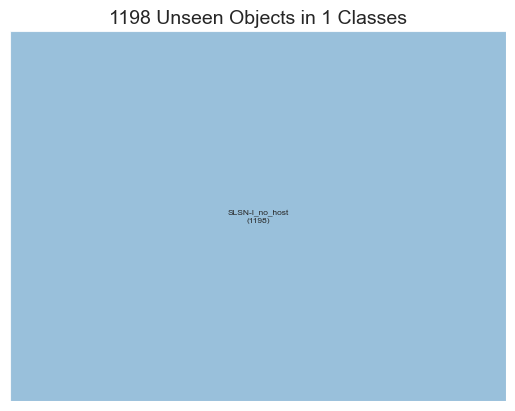

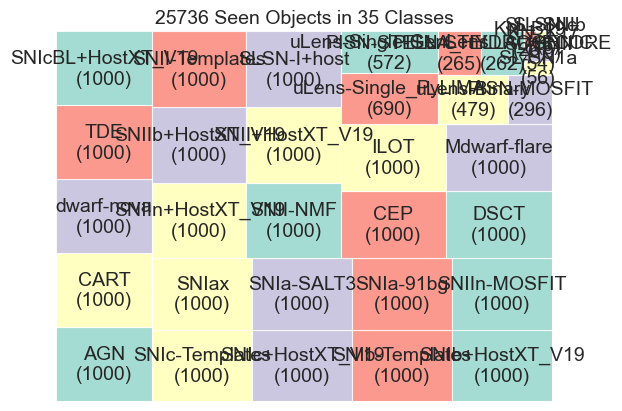

Total anoms:
status
normal       28261
anomalous     1198
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.985
anomalous    0.015
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

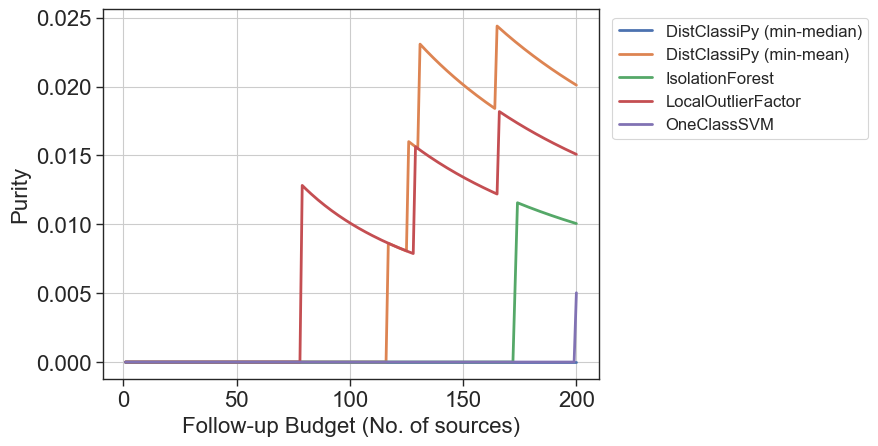

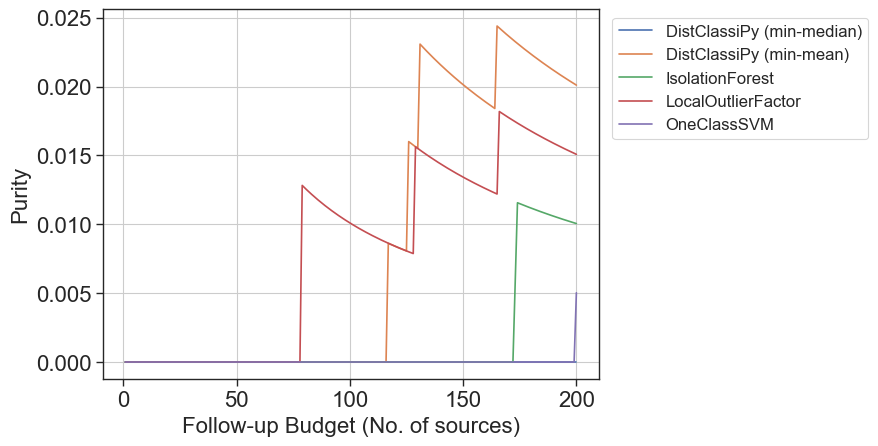

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 59
	Common % = 59.0%
***IsolationForest
	Common = 22
	Common % = 22.0%
***LocalOutlierFactor
	Common = 8
	Common % = 8.0%
***OneClassSVM
	Common = 21
	Common % = 21.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 29 (29.0%)
status
normal    71
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
8591142,SNII-NMF,normal
155481312,CEP,normal
12894334,SNIIn+HostXT_V19,normal
3365416,SNIa-SALT3,normal
43757557,DSCT,normal
8728665,SNII-NMF,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
12874225,DSCT,normal
39800396,CEP,normal
138399094,CEP,normal
97153243,DSCT,normal
23353678,dwarf-nova,normal


score_IsolationForest


,class,status
snid,,
158182542,DSCT,normal
25095194,DSCT,normal
135511375,CEP,normal
97153243,DSCT,normal
88027215,DSCT,normal
129423123,DSCT,normal
2746505,CEP,normal
134231880,DSCT,normal
140005137,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
34892193,dwarf-nova,normal
93099457,SNIIn-MOSFIT,normal
138399094,CEP,normal
39800396,CEP,normal


score_OneClassSVM


,class,status
snid,,
64078252,dwarf-nova,normal
97153243,DSCT,normal
70950988,DSCT,normal
48726309,DSCT,normal
62388074,DSCT,normal
140955823,DSCT,normal
115944780,DSCT,normal
13316585,DSCT,normal
138399094,CEP,normal


********************************************************************************
**************************  ANOMALY: SNII+HostXT_V19  **************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       94
anomalous     6
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       95
anomalous     5
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       97
anomalous     3
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       99
anomalous     1
Name: count, dtype: int64

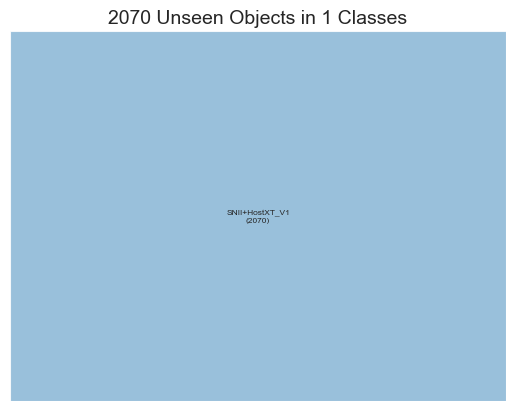

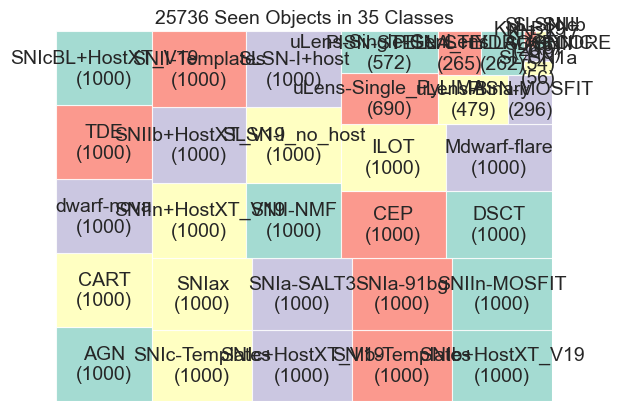

Total anoms:
status
normal       27389
anomalous     2070
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.945
anomalous    0.055
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.94
anomalous    0.06
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.97
anomalous    0.03
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.96
anomalous    0.04
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

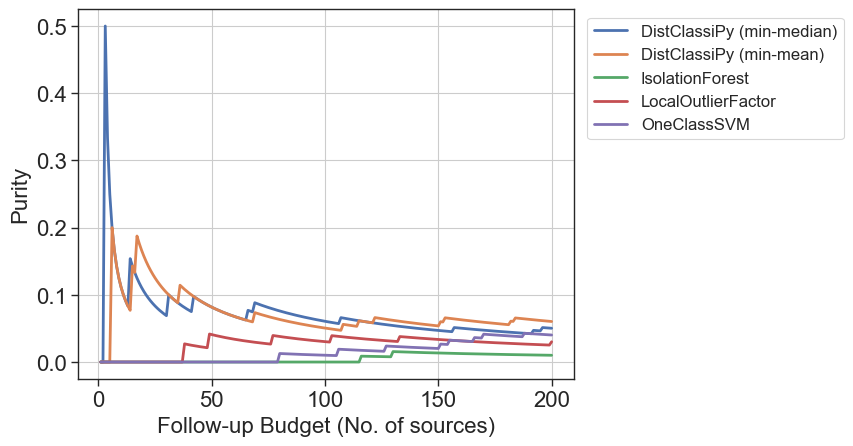

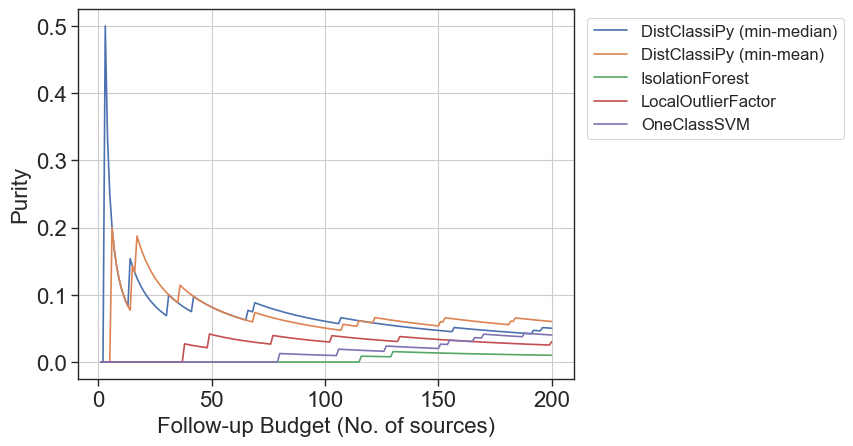

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 58
	Common % = 58.0%
***IsolationForest
	Common = 14
	Common % = 14.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 8
	Common % = 8.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 16 (16.0%)
status
normal       78
anomalous     6
Name: count, dtype: int64
status
normal       0.928571
anomalous    0.071429
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,anomalous
8591142,SNII-NMF,normal
145318115,DSCT,normal
8200402,SNIIn+HostXT_V19,normal
4807364,SNIIn+HostXT_V19,normal
134139354,TDE,normal
84807149,DSCT,normal
64916976,SNIIn-MOSFIT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
12874225,DSCT,normal
48726309,DSCT,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,anomalous
39800396,CEP,normal
88027215,DSCT,normal
5060681,AGN,normal
8591142,SNII-NMF,normal


score_IsolationForest


,class,status
snid,,
2746505,CEP,normal
80651702,dwarf-nova,normal
30406196,DSCT,normal
88027215,DSCT,normal
25095194,DSCT,normal
158182542,DSCT,normal
39800396,CEP,normal
50430377,DSCT,normal
135511375,CEP,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
48726309,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
39800396,CEP,normal
106532076,TDE,normal
22922254,SNIb-Templates,normal
4357262,SNIc-Templates,normal
62388074,DSCT,normal
24672901,AGN,normal


score_OneClassSVM


,class,status
snid,,
48726309,DSCT,normal
64078252,dwarf-nova,normal
62388074,DSCT,normal
12874225,DSCT,normal
79486150,DSCT,normal
40256654,DSCT,normal
2008943,dwarf-nova,normal
40489115,DSCT,normal
97986635,DSCT,normal


********************************************************************************
******************************  ANOMALY: SNII-NMF  ******************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       93
anomalous     7
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       86
anomalous    14
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       93
anomalous     7
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       90
anomalous    10
Name: count, dtype: int64

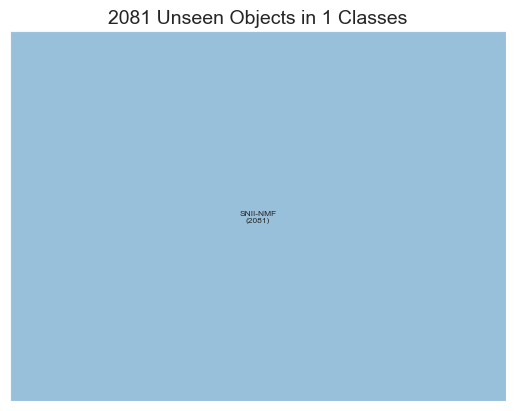

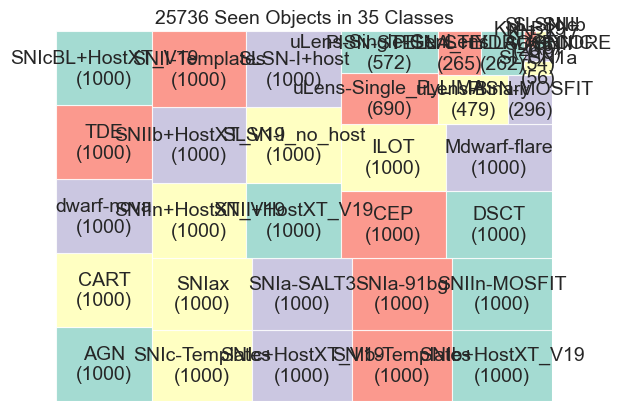

Total anoms:
status
normal       27378
anomalous     2081
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.935
anomalous    0.065
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.9
anomalous    0.1
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.955
anomalous    0.045
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.91
anomalous    0.09
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

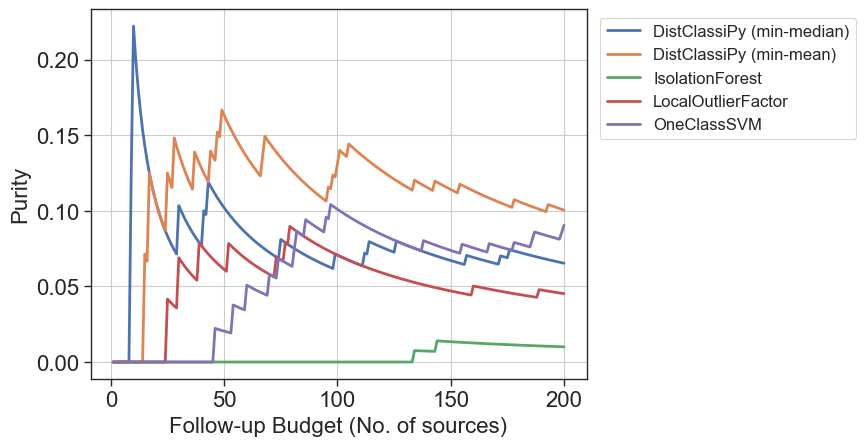

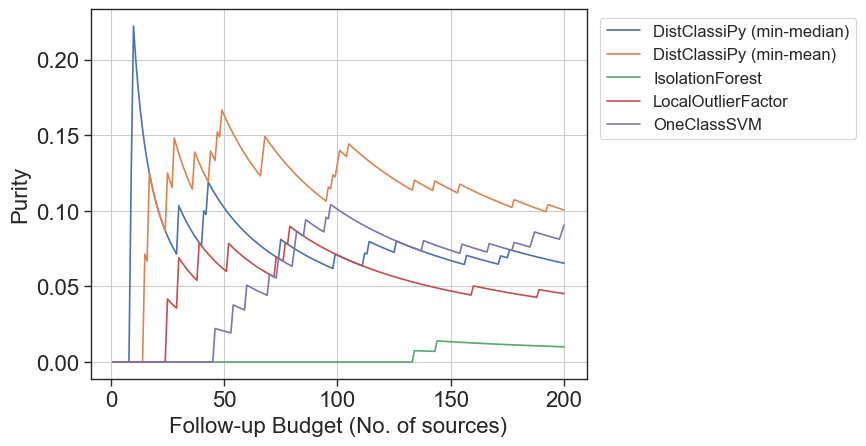

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 58
	Common % = 58.0%
***IsolationForest
	Common = 26
	Common % = 26.0%
***LocalOutlierFactor
	Common = 6
	Common % = 6.0%
***OneClassSVM
	Common = 14
	Common % = 14.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 32 (32.0%)
status
normal       64
anomalous     4
Name: count, dtype: int64
status
normal       0.941176
anomalous    0.058824
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
158182542,DSCT,normal
145318115,DSCT,normal
43757557,DSCT,normal
8591142,SNII-NMF,anomalous
17927341,SNII-NMF,anomalous


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
2746505,CEP,normal
145318115,DSCT,normal
119433681,dwarf-nova,normal
23353678,dwarf-nova,normal
1544999,SNII+HostXT_V19,normal


score_IsolationForest


,class,status
snid,,
50430377,DSCT,normal
129423123,DSCT,normal
42088553,AGN,normal
25095194,DSCT,normal
97153243,DSCT,normal
88027215,DSCT,normal
2746505,CEP,normal
30406196,DSCT,normal
12874225,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
93099457,SNIIn-MOSFIT,normal
22922254,SNIb-Templates,normal
6131735,AGN,normal
9078946,DSCT,normal
138399094,CEP,normal
24672901,AGN,normal


score_OneClassSVM


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
140955823,DSCT,normal
62388074,DSCT,normal
48726309,DSCT,normal
97153243,DSCT,normal
138399094,CEP,normal
40489115,DSCT,normal
2746505,CEP,normal


********************************************************************************
***************************  ANOMALY: SNII-Templates  ***************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       95
anomalous     5
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       93
anomalous     7
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       91
anomalous     9
Name: count, dtype: int64

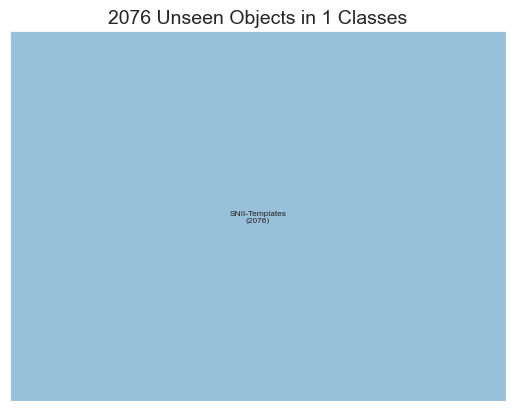

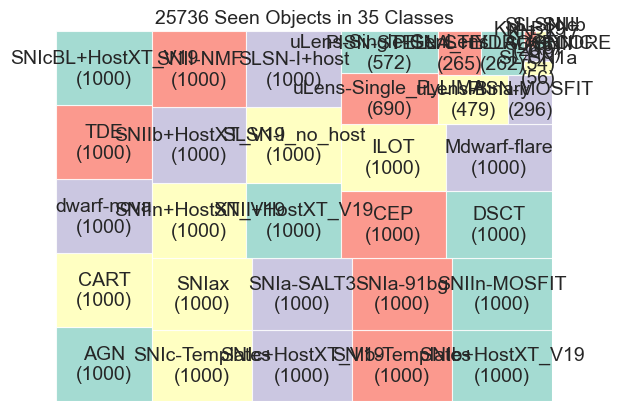

Total anoms:
status
normal       27383
anomalous     2076
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.955
anomalous    0.045
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.935
anomalous    0.065
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.925
anomalous    0.075
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

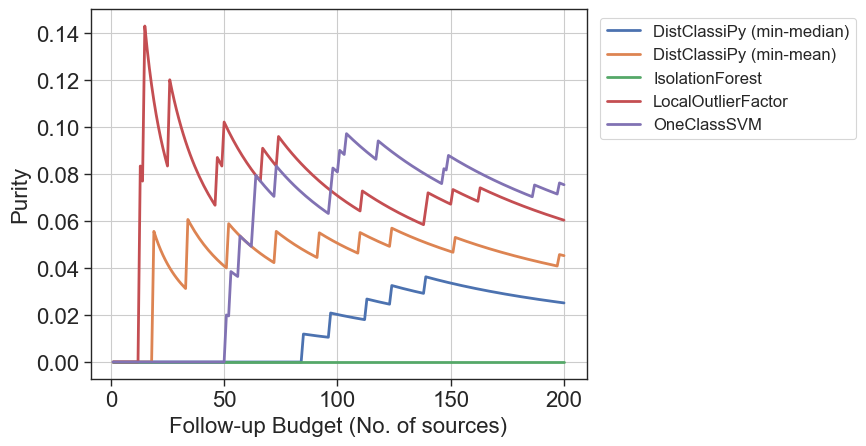

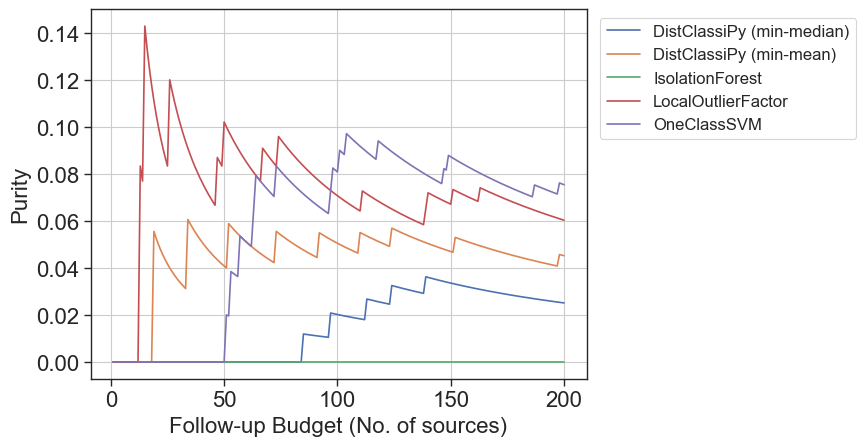

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 53
	Common % = 53.0%
***IsolationForest
	Common = 21
	Common % = 21.0%
***LocalOutlierFactor
	Common = 6
	Common % = 6.0%
***OneClassSVM
	Common = 15
	Common % = 15.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 26 (26.0%)
status
normal       72
anomalous     2
Name: count, dtype: int64
status
normal       0.972973
anomalous    0.027027
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
145318115,DSCT,normal
39800396,CEP,normal
140955823,DSCT,normal
158182542,DSCT,normal
12894334,SNIIn+HostXT_V19,normal
142062076,SLSN-I+host,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
39800396,CEP,normal
140955823,DSCT,normal
2746505,CEP,normal
145318115,DSCT,normal
99295996,SNIIn-MOSFIT,normal
12894334,SNIIn+HostXT_V19,normal


score_IsolationForest


,class,status
snid,,
25095194,DSCT,normal
80651702,dwarf-nova,normal
158182542,DSCT,normal
2746505,CEP,normal
88027215,DSCT,normal
42088553,AGN,normal
39800396,CEP,normal
97153243,DSCT,normal
135511375,CEP,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,normal
140955823,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
48726309,DSCT,normal
93099457,SNIIn-MOSFIT,normal
22922254,SNIb-Templates,normal
106532076,TDE,normal
39800396,CEP,normal
9078946,DSCT,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
12874225,DSCT,normal
62388074,DSCT,normal
155481312,CEP,normal
48726309,DSCT,normal
97153243,DSCT,normal
39800396,CEP,normal
97986635,DSCT,normal
70950988,DSCT,normal


********************************************************************************
**************************  ANOMALY: SNIIb+HostXT_V19  **************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       95
anomalous     5
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

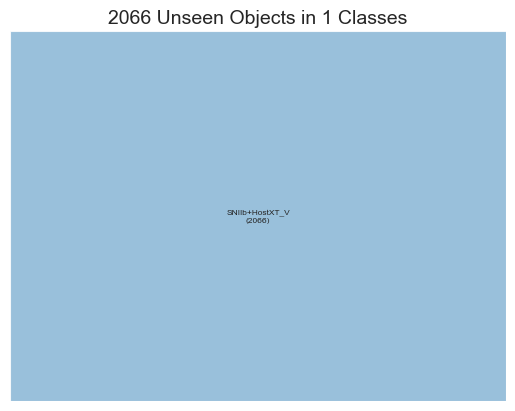

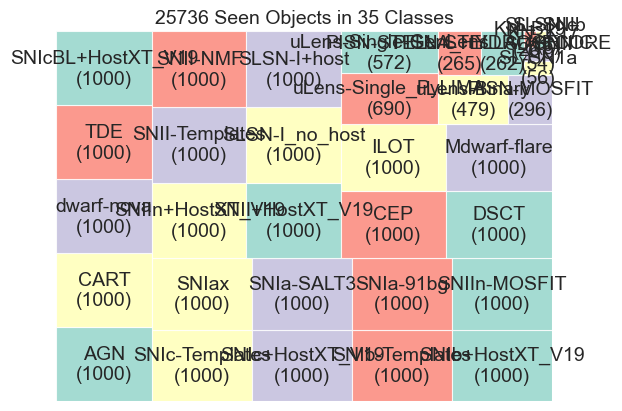

Total anoms:
status
normal       27393
anomalous     2066
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.985
anomalous    0.015
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.96
anomalous    0.04
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

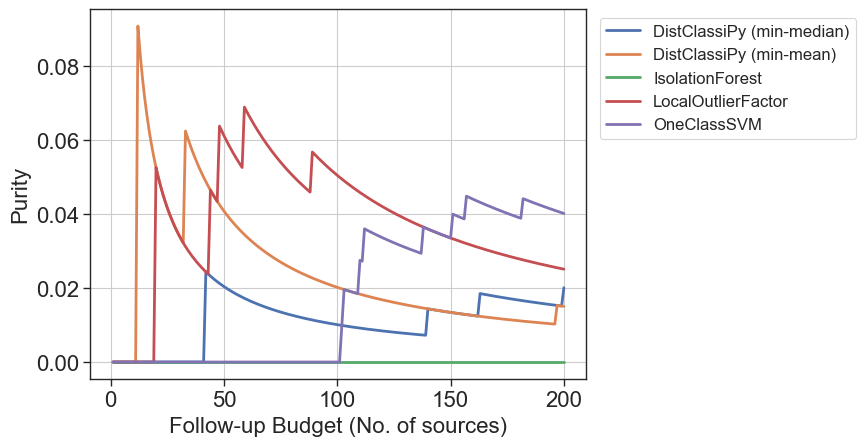

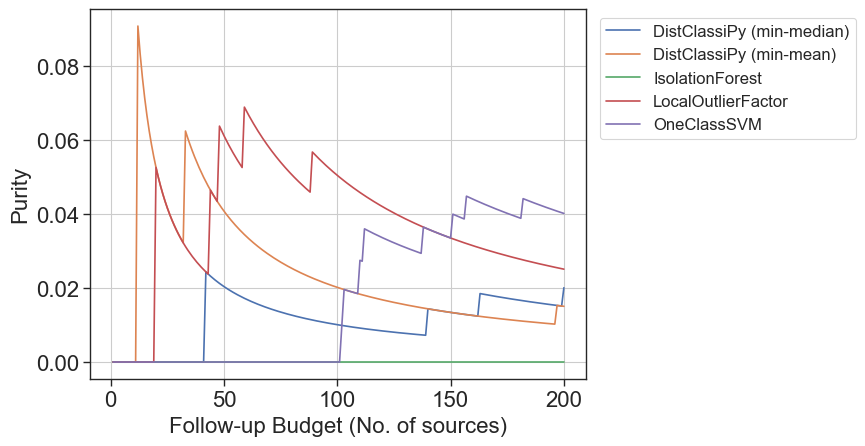

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 54
	Common % = 54.0%
***IsolationForest
	Common = 27
	Common % = 27.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 13
	Common % = 13.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 32 (32.0%)
status
normal       67
anomalous     1
Name: count, dtype: int64
status
normal       0.985294
anomalous    0.014706
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
145318115,DSCT,normal
39800396,CEP,normal
134139354,TDE,normal
140955823,DSCT,normal
158182542,DSCT,normal
4807364,SNIIn+HostXT_V19,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
39800396,CEP,normal
140955823,DSCT,normal
145318115,DSCT,normal
12894334,SNIIn+HostXT_V19,normal
3365416,SNIa-SALT3,normal
86051575,SLSN-I+host,normal


score_IsolationForest


,class,status
snid,,
88027215,DSCT,normal
158182542,DSCT,normal
30406196,DSCT,normal
42088553,AGN,normal
39800396,CEP,normal
25095194,DSCT,normal
12874225,DSCT,normal
135511375,CEP,normal
98945395,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
22922254,SNIb-Templates,normal
39800396,CEP,normal
6131735,AGN,normal
48420977,SNII-Templates,normal
9078946,DSCT,normal
75735322,ILOT,normal


score_OneClassSVM


,class,status
snid,,
62388074,DSCT,normal
12874225,DSCT,normal
48726309,DSCT,normal
155481312,CEP,normal
140955823,DSCT,normal
97153243,DSCT,normal
39800396,CEP,normal
40489115,DSCT,normal
2008943,dwarf-nova,normal


********************************************************************************
**************************  ANOMALY: SNIIn+HostXT_V19  **************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       88
anomalous    12
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       87
anomalous    13
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       95
anomalous     5
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

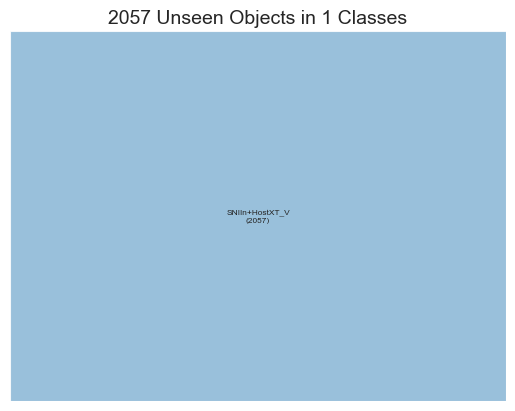

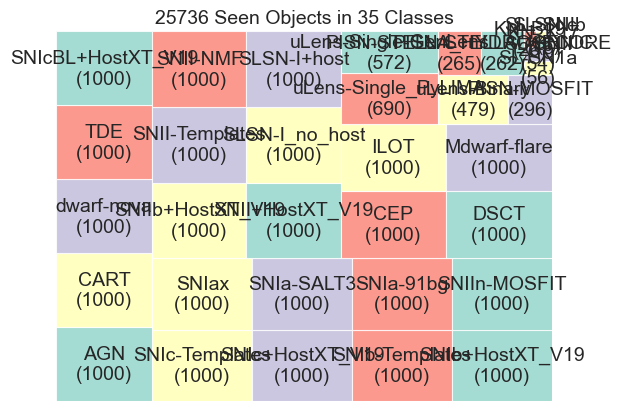

Total anoms:
status
normal       27402
anomalous     2057
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.87
anomalous    0.13
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.91
anomalous    0.09
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.94
anomalous    0.06
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

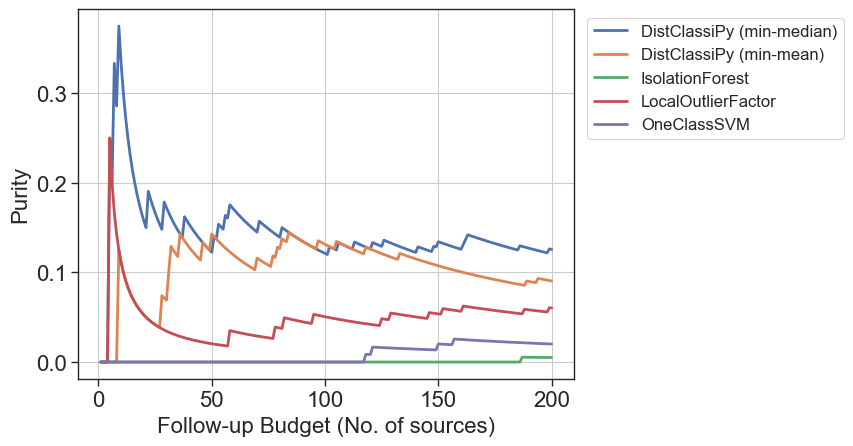

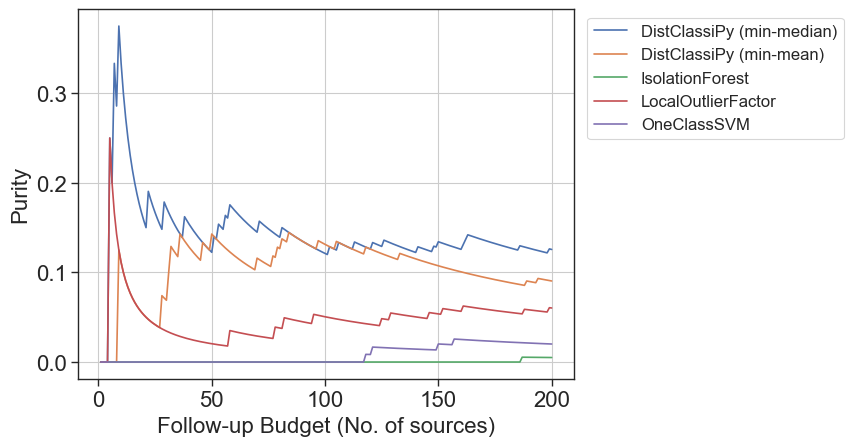

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 59
	Common % = 59.0%
***IsolationForest
	Common = 19
	Common % = 19.0%
***LocalOutlierFactor
	Common = 4
	Common % = 4.0%
***OneClassSVM
	Common = 7
	Common % = 7.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 21 (21.0%)
status
normal       67
anomalous    12
Name: count, dtype: int64
status
normal       0.848101
anomalous    0.151899
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
12894334,SNIIn+HostXT_V19,anomalous
17927341,SNII-NMF,normal
8200402,SNIIn+HostXT_V19,anomalous
134139354,TDE,normal
4807364,SNIIn+HostXT_V19,anomalous
73498688,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
12874225,DSCT,normal
140955823,DSCT,normal
48726309,DSCT,normal
145318115,DSCT,normal
39800396,CEP,normal
6638537,SNII+HostXT_V19,normal
12894334,SNIIn+HostXT_V19,anomalous
99295996,SNIIn-MOSFIT,normal


score_IsolationForest


,class,status
snid,,
39800396,CEP,normal
42088553,AGN,normal
25095194,DSCT,normal
88027215,DSCT,normal
2746505,CEP,normal
158182542,DSCT,normal
129423123,DSCT,normal
97153243,DSCT,normal
12874225,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
140955823,DSCT,normal
48726309,DSCT,normal
10498551,SNIIn+HostXT_V19,anomalous
93099457,SNIIn-MOSFIT,normal
39800396,CEP,normal
46505442,CEP,normal
9078946,DSCT,normal
24672901,AGN,normal


score_OneClassSVM


,class,status
snid,,
48726309,DSCT,normal
62388074,DSCT,normal
64078252,dwarf-nova,normal
12874225,DSCT,normal
140955823,DSCT,normal
97153243,DSCT,normal
39800396,CEP,normal
97986635,DSCT,normal
2746505,CEP,normal


********************************************************************************
****************************  ANOMALY: SNIIn-MOSFIT  ****************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       94
anomalous     6
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       94
anomalous     6
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       94
anomalous     6
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       95
anomalous     5
Name: count, dtype: int64

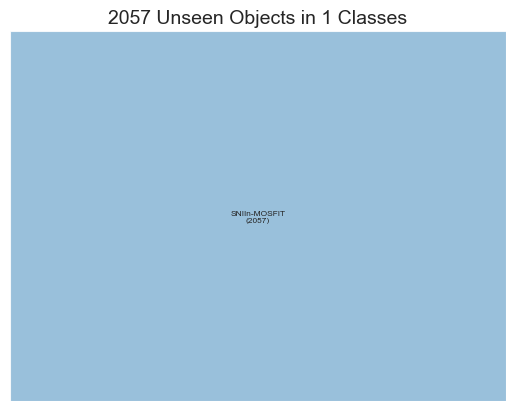

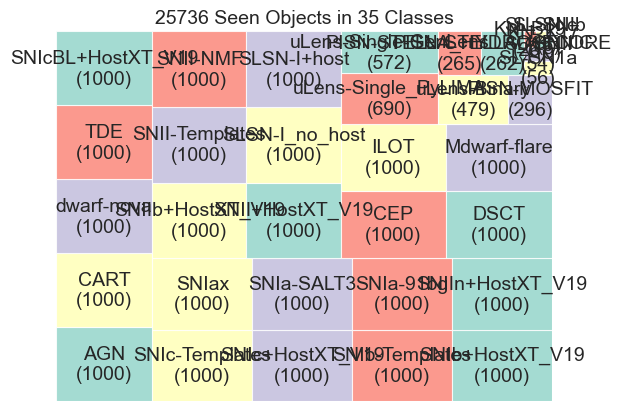

Total anoms:
status
normal       27402
anomalous     2057
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.95
anomalous    0.05
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.94
anomalous    0.06
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.955
anomalous    0.045
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.935
anomalous    0.065
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

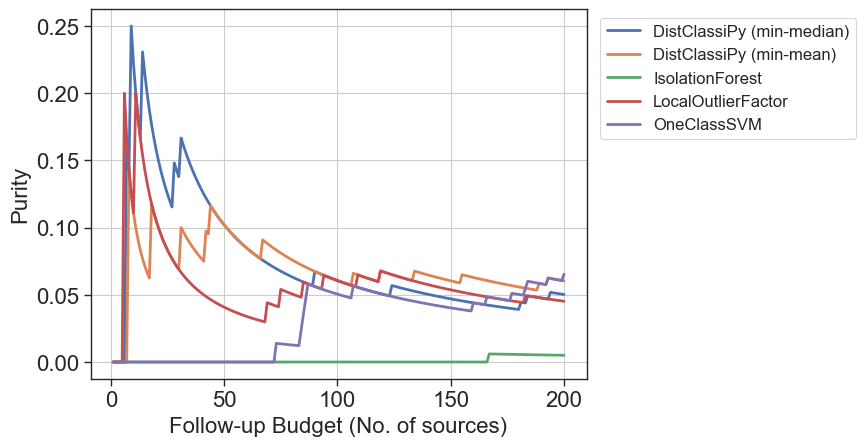

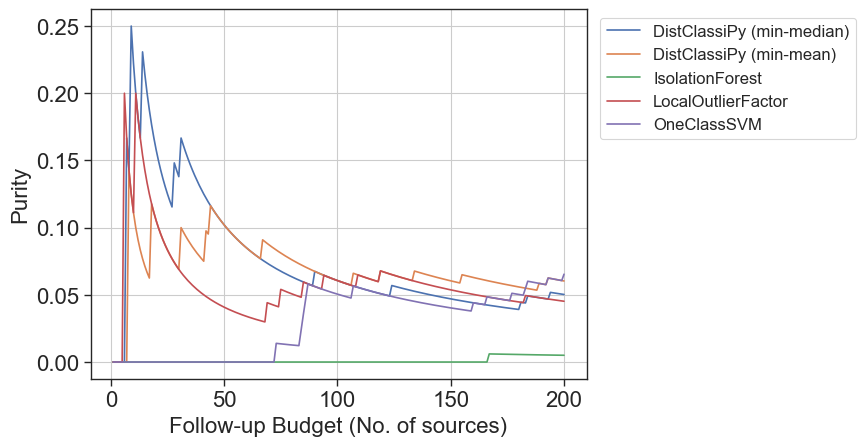

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 59
	Common % = 59.0%
***IsolationForest
	Common = 17
	Common % = 17.0%
***LocalOutlierFactor
	Common = 6
	Common % = 6.0%
***OneClassSVM
	Common = 10
	Common % = 10.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 20 (20.0%)
status
normal       74
anomalous     6
Name: count, dtype: int64
status
normal       0.925
anomalous    0.075
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
134139354,TDE,normal
17927341,SNII-NMF,normal
152540129,SNIIn-MOSFIT,anomalous
23353678,dwarf-nova,normal
64916976,SNIIn-MOSFIT,anomalous
89915162,TDE,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
140955823,DSCT,normal
48726309,DSCT,normal
23353678,dwarf-nova,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal
99295996,SNIIn-MOSFIT,anomalous
5060681,AGN,normal
17927341,SNII-NMF,normal


score_IsolationForest


,class,status
snid,,
30406196,DSCT,normal
25095194,DSCT,normal
88027215,DSCT,normal
80651702,dwarf-nova,normal
35547238,DSCT,normal
158182542,DSCT,normal
97153243,DSCT,normal
129423123,DSCT,normal
54264950,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
140955823,DSCT,normal
48726309,DSCT,normal
106532076,TDE,normal
93099457,SNIIn-MOSFIT,anomalous
4357262,SNIc-Templates,normal
6131735,AGN,normal
63964674,CART,normal
62388074,DSCT,normal


score_OneClassSVM


,class,status
snid,,
64078252,dwarf-nova,normal
48726309,DSCT,normal
62388074,DSCT,normal
140955823,DSCT,normal
97153243,DSCT,normal
101267830,dwarf-nova,normal
70950988,DSCT,normal
97986635,DSCT,normal
110399186,CEP,normal


********************************************************************************
*****************************  ANOMALY: SNIa-91bg  *****************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       97
anomalous     3
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       95
anomalous     5
Name: count, dtype: int64

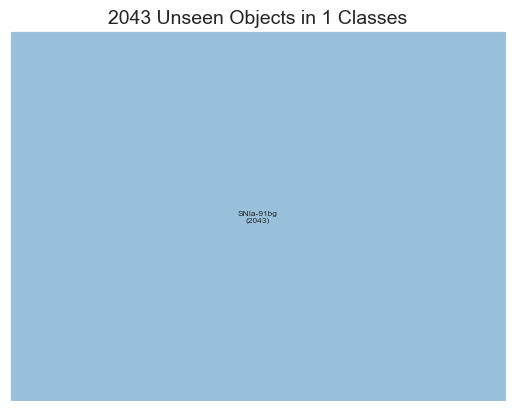

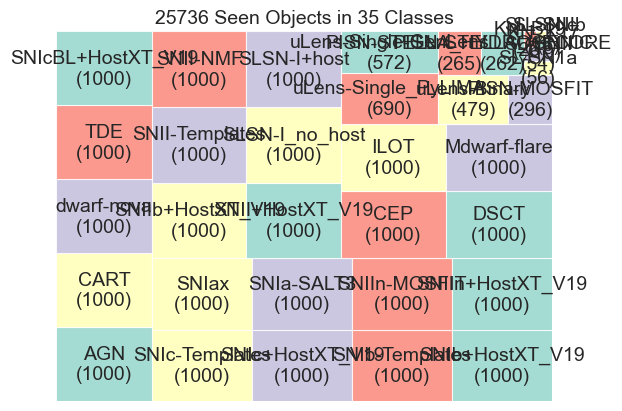

Total anoms:
status
normal       27416
anomalous     2043
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.965
anomalous    0.035
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.935
anomalous    0.065
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

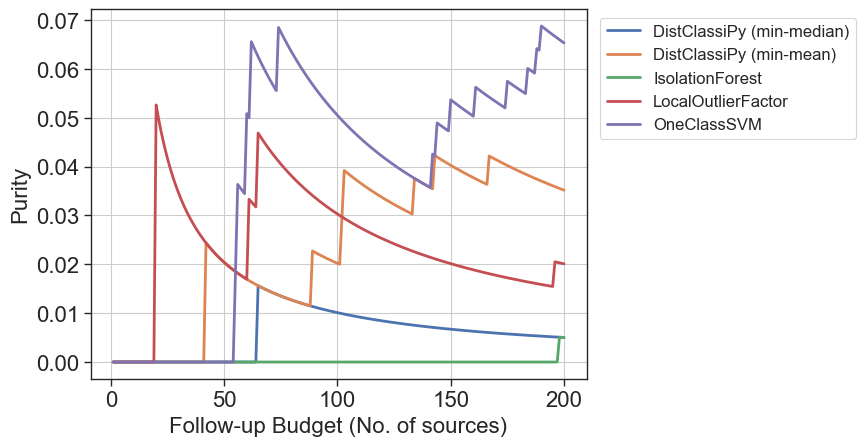

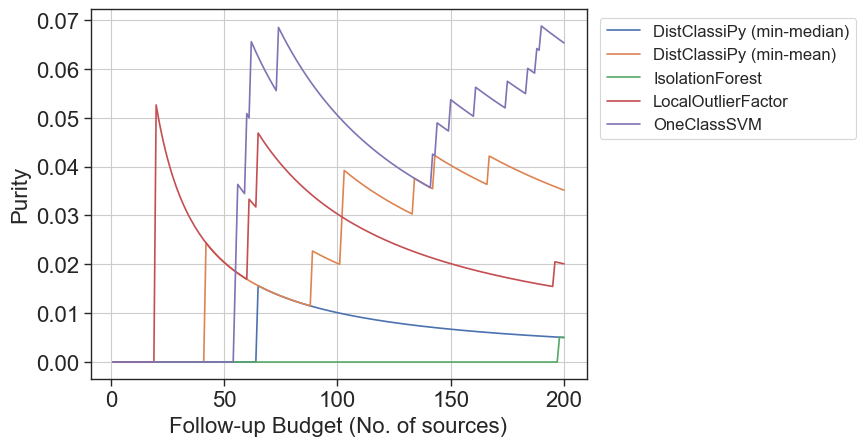

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 55
	Common % = 55.0%
***IsolationForest
	Common = 20
	Common % = 20.0%
***LocalOutlierFactor
	Common = 3
	Common % = 3.0%
***OneClassSVM
	Common = 6
	Common % = 6.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 21 (21.0%)
status
normal       78
anomalous     1
Name: count, dtype: int64
status
normal       0.987342
anomalous    0.012658
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
145318115,DSCT,normal
8591142,SNII-NMF,normal
8728665,SNII-NMF,normal
17927341,SNII-NMF,normal
106621934,TDE,normal
152540129,SNIIn-MOSFIT,normal
43757557,DSCT,normal
84807149,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
12874225,DSCT,normal
140955823,DSCT,normal
138399094,CEP,normal
48726309,DSCT,normal
145318115,DSCT,normal
43757557,DSCT,normal
99295996,SNIIn-MOSFIT,normal
5060681,AGN,normal


score_IsolationForest


,class,status
snid,,
158182542,DSCT,normal
2746505,CEP,normal
35547238,DSCT,normal
30406196,DSCT,normal
50430377,DSCT,normal
97153243,DSCT,normal
80651702,dwarf-nova,normal
25095194,DSCT,normal
42088553,AGN,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
140955823,DSCT,normal
48726309,DSCT,normal
93099457,SNIIn-MOSFIT,normal
138399094,CEP,normal
106532076,TDE,normal
46505442,CEP,normal
55706383,AGN,normal
9078946,DSCT,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
64078252,dwarf-nova,normal
48726309,DSCT,normal
97153243,DSCT,normal
62388074,DSCT,normal
12874225,DSCT,normal
40489115,DSCT,normal
40256654,DSCT,normal
2008943,dwarf-nova,normal


********************************************************************************
*****************************  ANOMALY: SNIa-SALT3  *****************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       99
anomalous     1
Name: count, dtype: int64

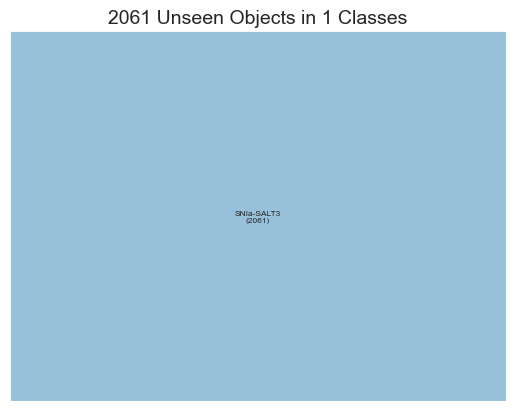

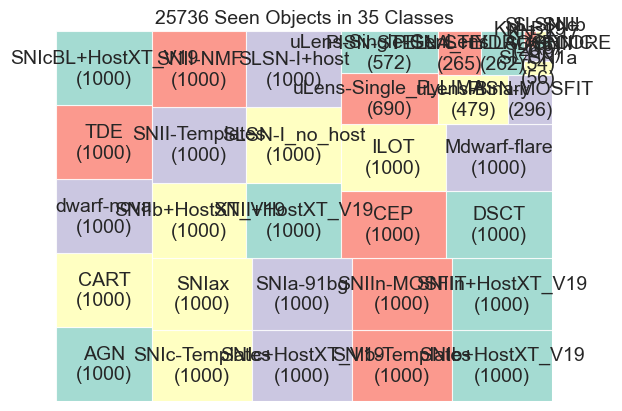

Total anoms:
status
normal       27398
anomalous     2061
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.97
anomalous    0.03
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.985
anomalous    0.015
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.965
anomalous    0.035
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

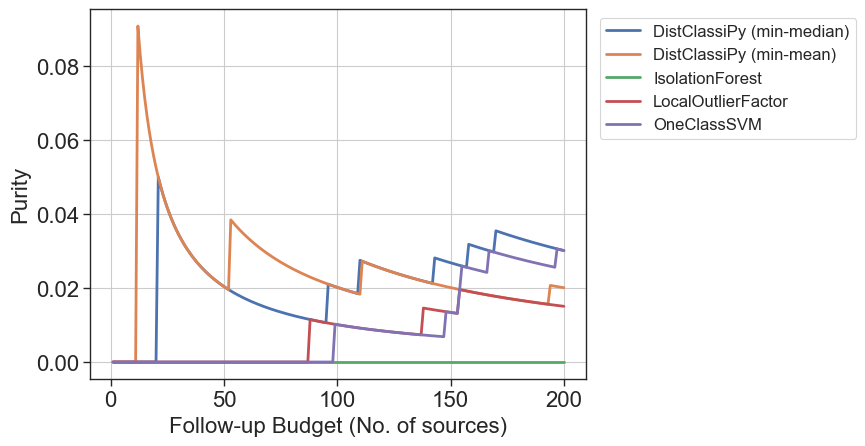

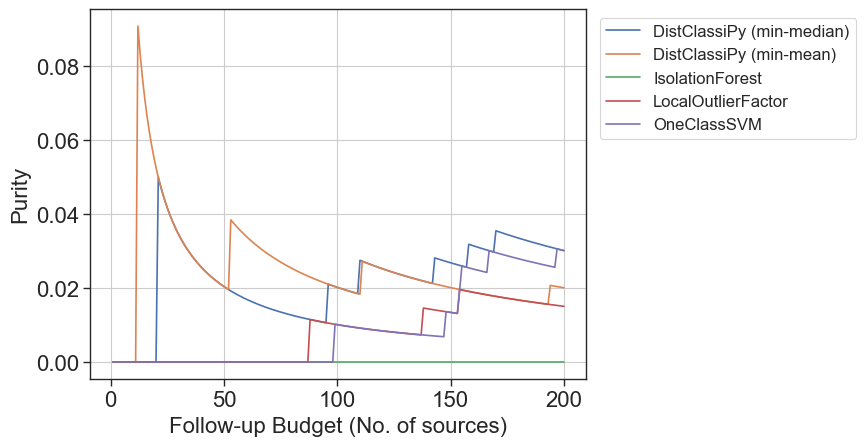

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 60
	Common % = 60.0%
***IsolationForest
	Common = 36
	Common % = 36.0%
***LocalOutlierFactor
	Common = 6
	Common % = 6.0%
***OneClassSVM
	Common = 12
	Common % = 12.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 38 (38.0%)
status
normal       60
anomalous     2
Name: count, dtype: int64
status
normal       0.967742
anomalous    0.032258
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,normal
48726309,DSCT,normal
12874225,DSCT,normal
140955823,DSCT,normal
158182542,DSCT,normal
39800396,CEP,normal
145318115,DSCT,normal
8591142,SNII-NMF,normal
64916976,SNIIn-MOSFIT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
39800396,CEP,normal
140955823,DSCT,normal
158182542,DSCT,normal
145318115,DSCT,normal
88027215,DSCT,normal
119433681,dwarf-nova,normal


score_IsolationForest


,class,status
snid,,
158182542,DSCT,normal
50430377,DSCT,normal
88027215,DSCT,normal
42088553,AGN,normal
25095194,DSCT,normal
129423123,DSCT,normal
30406196,DSCT,normal
39800396,CEP,normal
64804563,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
93099457,SNIIn-MOSFIT,normal
4357262,SNIc-Templates,normal
138399094,CEP,normal
39800396,CEP,normal
50026026,CEP,normal


score_OneClassSVM


,class,status
snid,,
48726309,DSCT,normal
138399094,CEP,normal
39800396,CEP,normal
155481312,CEP,normal
140955823,DSCT,normal
12874225,DSCT,normal
62388074,DSCT,normal
97153243,DSCT,normal
40489115,DSCT,normal


********************************************************************************
*******************************  ANOMALY: SNIax  *******************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       93
anomalous     7
Name: count, dtype: int64

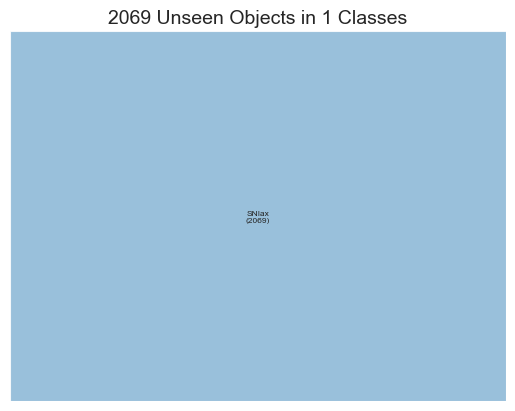

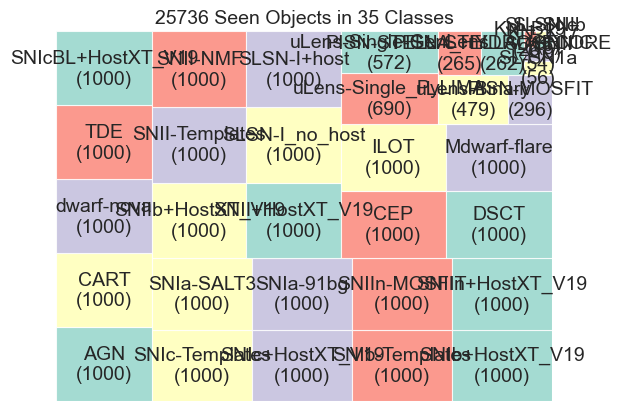

Total anoms:
status
normal       27390
anomalous     2069
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.965
anomalous    0.035
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.955
anomalous    0.045
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.95
anomalous    0.05
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.935
anomalous    0.065
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

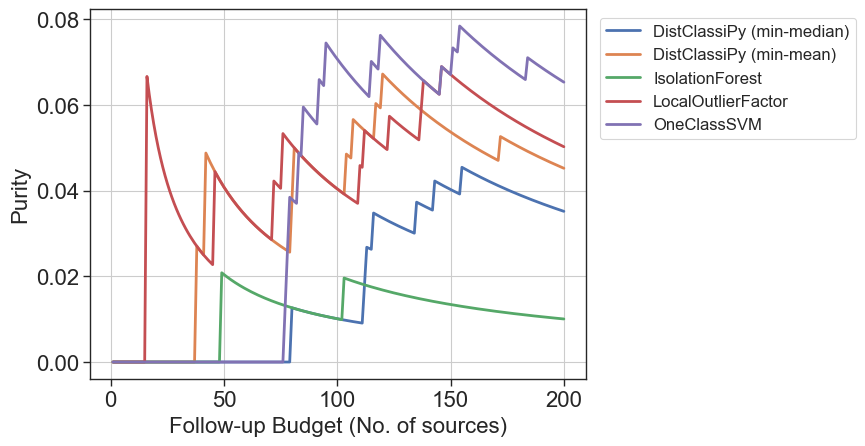

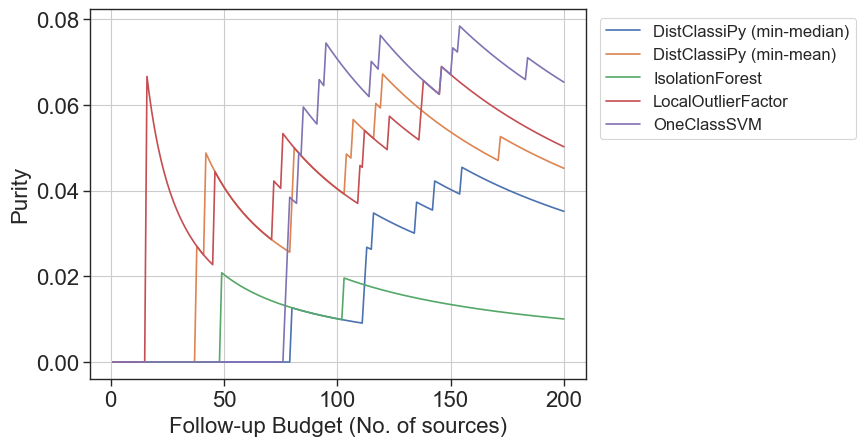

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 56
	Common % = 56.0%
***IsolationForest
	Common = 21
	Common % = 21.0%
***LocalOutlierFactor
	Common = 6
	Common % = 6.0%
***OneClassSVM
	Common = 15
	Common % = 15.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 28 (28.0%)
status
normal       71
anomalous     1
Name: count, dtype: int64
status
normal       0.986111
anomalous    0.013889
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
39800396,CEP,normal
145318115,DSCT,normal
140955823,DSCT,normal
158182542,DSCT,normal
134139354,TDE,normal
6638537,SNII+HostXT_V19,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
39800396,CEP,normal
140955823,DSCT,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal
99295996,SNIIn-MOSFIT,normal
2746505,CEP,normal


score_IsolationForest


,class,status
snid,,
42088553,AGN,normal
30406196,DSCT,normal
158182542,DSCT,normal
149692731,DSCT,normal
39800396,CEP,normal
129423123,DSCT,normal
25095194,DSCT,normal
12874225,DSCT,normal
135511375,CEP,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
154302958,DSCT,normal
39800396,CEP,normal
106532076,TDE,normal
9078946,DSCT,normal
75735322,ILOT,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
155481312,CEP,normal
62388074,DSCT,normal
12874225,DSCT,normal
48726309,DSCT,normal
97153243,DSCT,normal
40489115,DSCT,normal
40256654,DSCT,normal
2008943,dwarf-nova,normal


********************************************************************************
**************************  ANOMALY: SNIb+HostXT_V19  **************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       98
anomalous     2
Name: count, dtype: int64

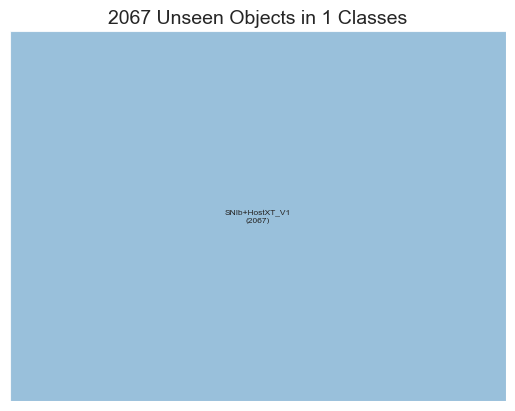

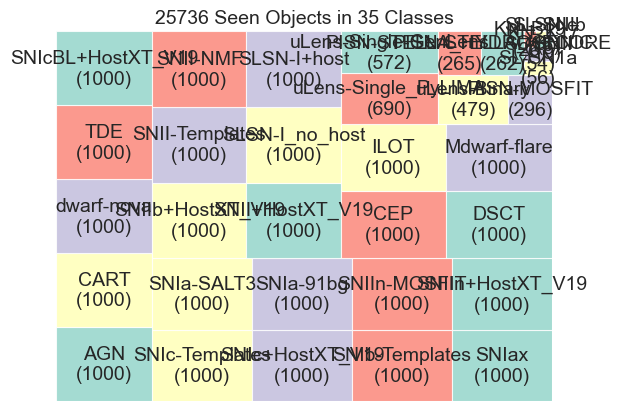

Total anoms:
status
normal       27392
anomalous     2067
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.965
anomalous    0.035
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

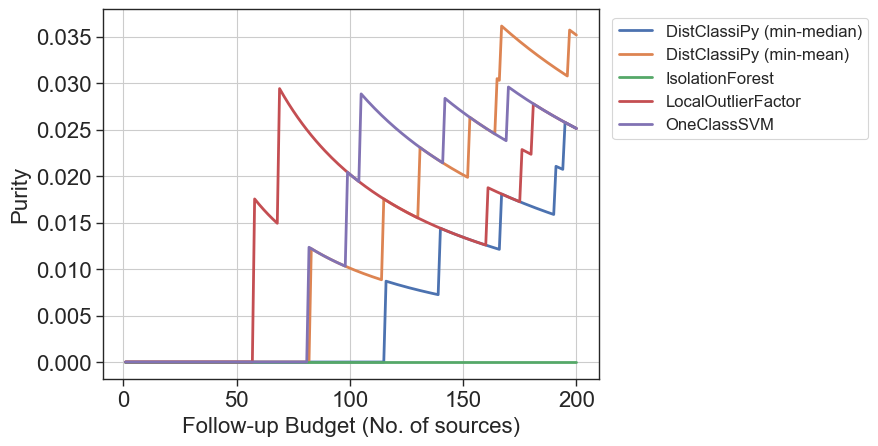

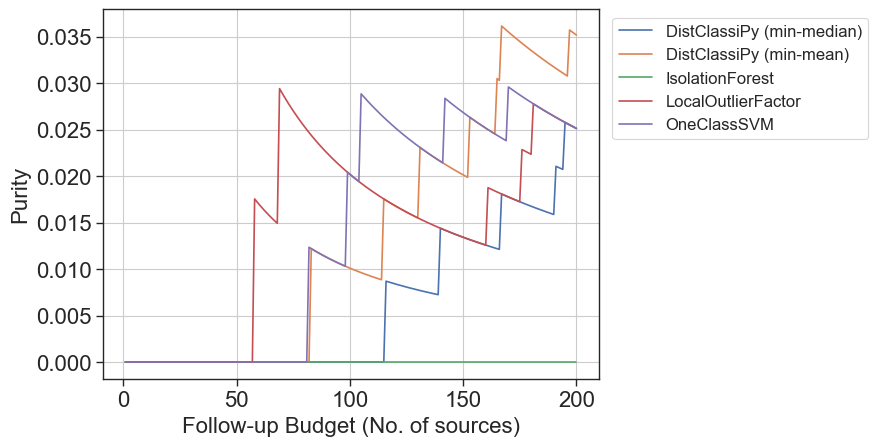

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 56
	Common % = 56.0%
***IsolationForest
	Common = 15
	Common % = 15.0%
***LocalOutlierFactor
	Common = 4
	Common % = 4.0%
***OneClassSVM
	Common = 7
	Common % = 7.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 16 (16.0%)
status
normal    84
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
145318115,DSCT,normal
3365416,SNIa-SALT3,normal
17927341,SNII-NMF,normal
8728665,SNII-NMF,normal
73498688,DSCT,normal
5060681,AGN,normal
1544999,SNII+HostXT_V19,normal
1856725,CEP,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
145318115,DSCT,normal
97153243,DSCT,normal
3365416,SNIa-SALT3,normal
99295996,SNIIn-MOSFIT,normal
5060681,AGN,normal


score_IsolationForest


,class,status
snid,,
42088553,AGN,normal
2746505,CEP,normal
129423123,DSCT,normal
135511375,CEP,normal
25095194,DSCT,normal
97153243,DSCT,normal
30406196,DSCT,normal
50430377,DSCT,normal
35547238,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
155481312,CEP,normal
140955823,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
48726309,DSCT,normal
24672901,AGN,normal
4357262,SNIc-Templates,normal
46505442,CEP,normal
93099457,SNIIn-MOSFIT,normal


score_OneClassSVM


,class,status
snid,,
97153243,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
155481312,CEP,normal
64078252,dwarf-nova,normal
62388074,DSCT,normal
2746505,CEP,normal
101267830,dwarf-nova,normal
34576023,dwarf-nova,normal


********************************************************************************
***************************  ANOMALY: SNIb-Templates  ***************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       95
anomalous     5
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       94
anomalous     6
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       92
anomalous     8
Name: count, dtype: int64

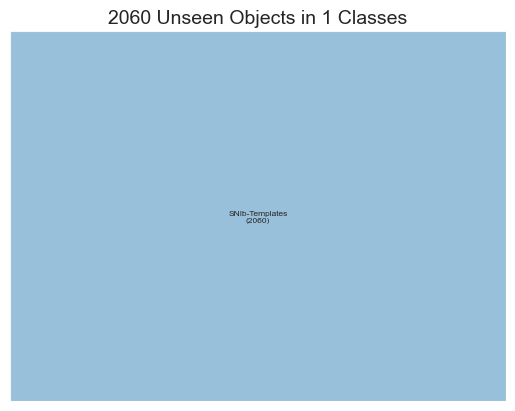

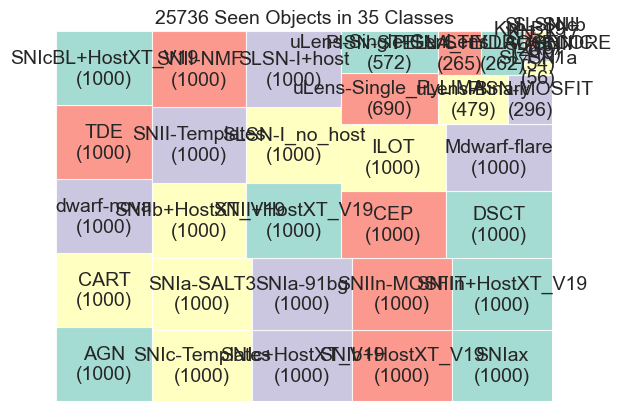

Total anoms:
status
normal       27399
anomalous     2060
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.965
anomalous    0.035
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.95
anomalous    0.05
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.985
anomalous    0.015
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.935
anomalous    0.065
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

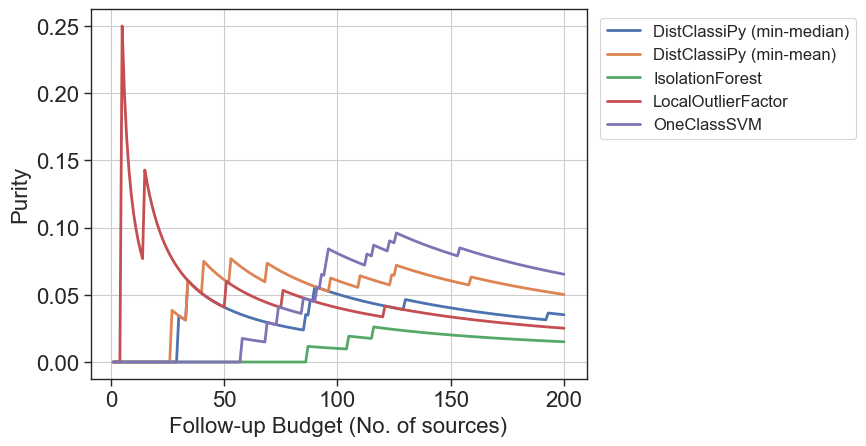

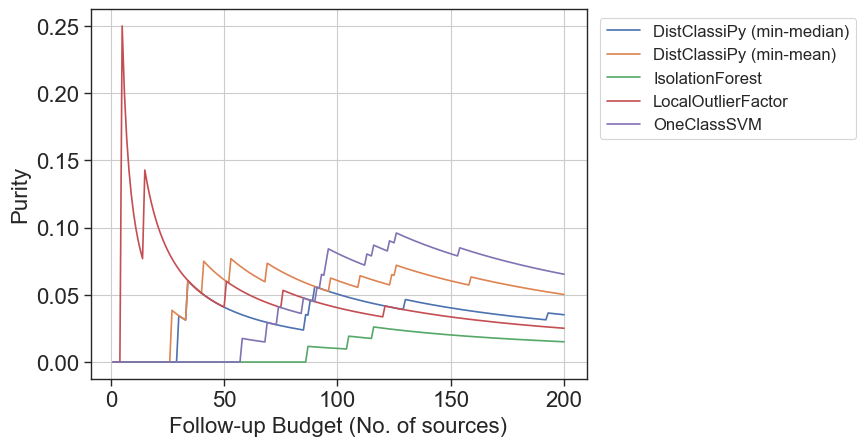

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 58
	Common % = 58.0%
***IsolationForest
	Common = 25
	Common % = 25.0%
***LocalOutlierFactor
	Common = 4
	Common % = 4.0%
***OneClassSVM
	Common = 6
	Common % = 6.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 28 (28.0%)
status
normal       69
anomalous     3
Name: count, dtype: int64
status
normal       0.958333
anomalous    0.041667
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
12874225,DSCT,normal
145318115,DSCT,normal
48726309,DSCT,normal
17927341,SNII-NMF,normal
12894334,SNIIn+HostXT_V19,normal
142891596,DSCT,normal
8591142,SNII-NMF,normal
22361580,ILOT,normal
43757557,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
145318115,DSCT,normal
34892193,dwarf-nova,normal
99295996,SNIIn-MOSFIT,normal
12894334,SNIIn+HostXT_V19,normal
86051575,SLSN-I+host,normal
5060681,AGN,normal


score_IsolationForest


,class,status
snid,,
98945395,DSCT,normal
42088553,AGN,normal
158182542,DSCT,normal
129423123,DSCT,normal
134231880,DSCT,normal
41352453,DSCT,normal
15660705,DSCT,normal
25095194,DSCT,normal
97153243,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
140955823,DSCT,normal
48726309,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
22922254,SNIb-Templates,anomalous
34892193,dwarf-nova,normal
62388074,DSCT,normal
150740300,TDE,normal
51931138,SNII-Templates,normal
117101986,SNIIn-MOSFIT,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
62388074,DSCT,normal
48726309,DSCT,normal
12874225,DSCT,normal
34892193,dwarf-nova,normal
97153243,DSCT,normal
26482462,dwarf-nova,normal
36049081,DSCT,normal
51038624,DSCT,normal


********************************************************************************
**************************  ANOMALY: SNIc+HostXT_V19  **************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       97
anomalous     3
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       99
anomalous     1
Name: count, dtype: int64

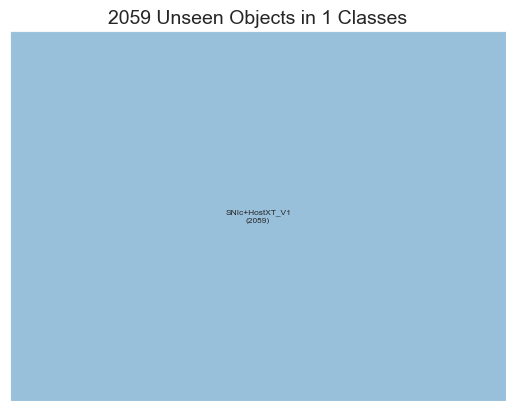

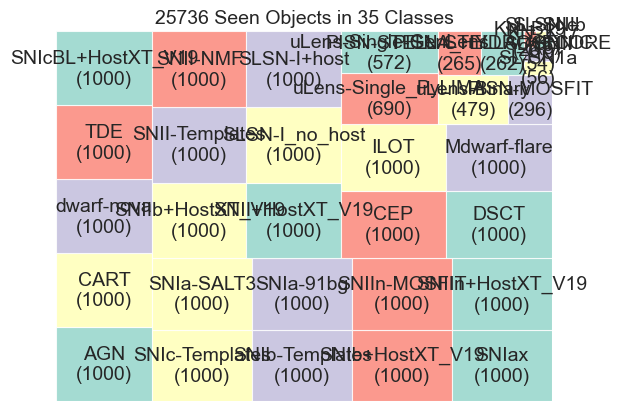

Total anoms:
status
normal       27400
anomalous     2059
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

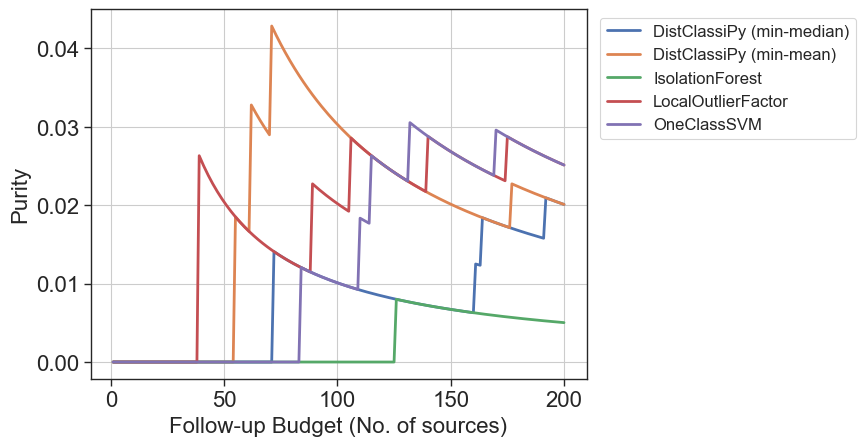

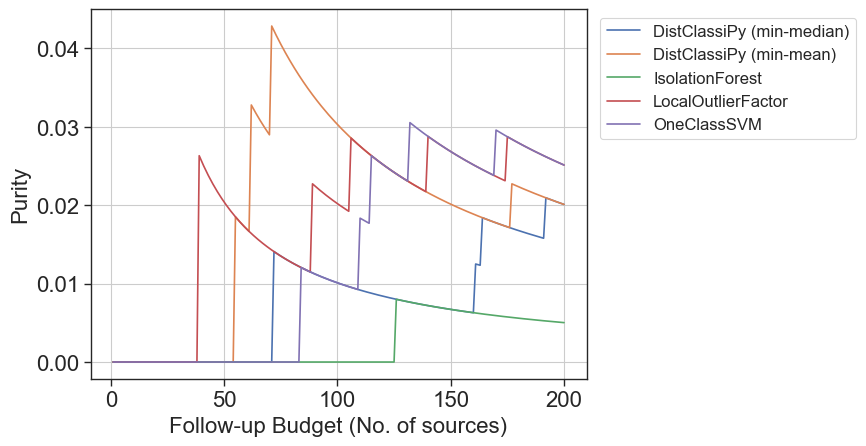

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 62
	Common % = 62.0%
***IsolationForest
	Common = 24
	Common % = 24.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 15
	Common % = 15.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 34 (34.0%)
status
normal       65
anomalous     1
Name: count, dtype: int64
status
normal       0.984848
anomalous    0.015152
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
12874225,DSCT,normal
140955823,DSCT,normal
145318115,DSCT,normal
17927341,SNII-NMF,normal
158182542,DSCT,normal
12894334,SNIIn+HostXT_V19,normal
19369061,DSCT,normal
146997022,DSCT,normal
8200402,SNIIn+HostXT_V19,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
12874225,DSCT,normal
140955823,DSCT,normal
34892193,dwarf-nova,normal
145318115,DSCT,normal
23353678,dwarf-nova,normal
99295996,SNIIn-MOSFIT,normal
12894334,SNIIn+HostXT_V19,normal
119433681,dwarf-nova,normal
89915162,TDE,normal


score_IsolationForest


,class,status
snid,,
88027215,DSCT,normal
25095194,DSCT,normal
158182542,DSCT,normal
2746505,CEP,normal
35547238,DSCT,normal
80651702,dwarf-nova,normal
50430377,DSCT,normal
97153243,DSCT,normal
135511375,CEP,normal


score_LocalOutlierFactor


,class,status
snid,,
140955823,DSCT,normal
34892193,dwarf-nova,normal
22922254,SNIb-Templates,normal
15742380,ILOT,normal
138399094,CEP,normal
46505442,CEP,normal
9078946,DSCT,normal
8016756,SNII-NMF,normal
14063527,DSCT,normal


score_OneClassSVM


,class,status
snid,,
34892193,dwarf-nova,normal
12874225,DSCT,normal
140955823,DSCT,normal
62388074,DSCT,normal
97153243,DSCT,normal
101267830,dwarf-nova,normal
138399094,CEP,normal
110399186,CEP,normal
40489115,DSCT,normal


********************************************************************************
***************************  ANOMALY: SNIc-Templates  ***************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       95
anomalous     5
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       97
anomalous     3
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       93
anomalous     7
Name: count, dtype: int64

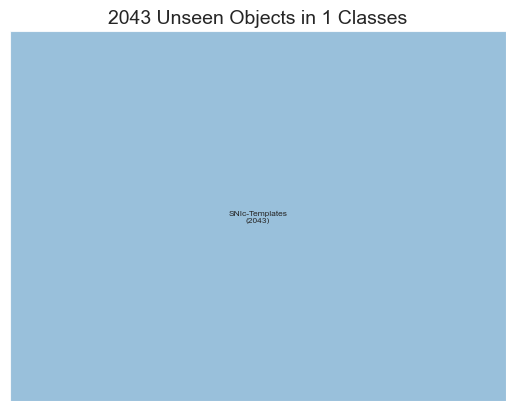

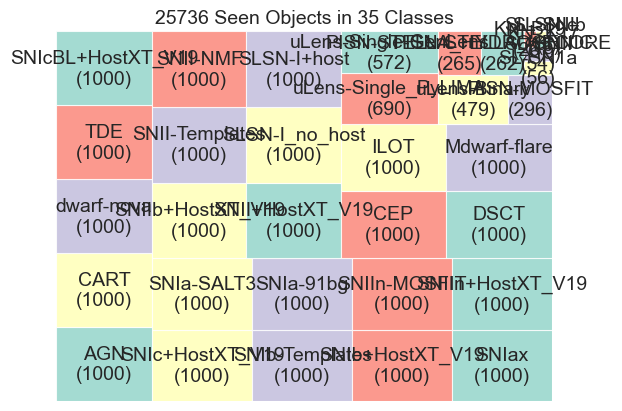

Total anoms:
status
normal       27416
anomalous     2043
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.955
anomalous    0.045
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.905
anomalous    0.095
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

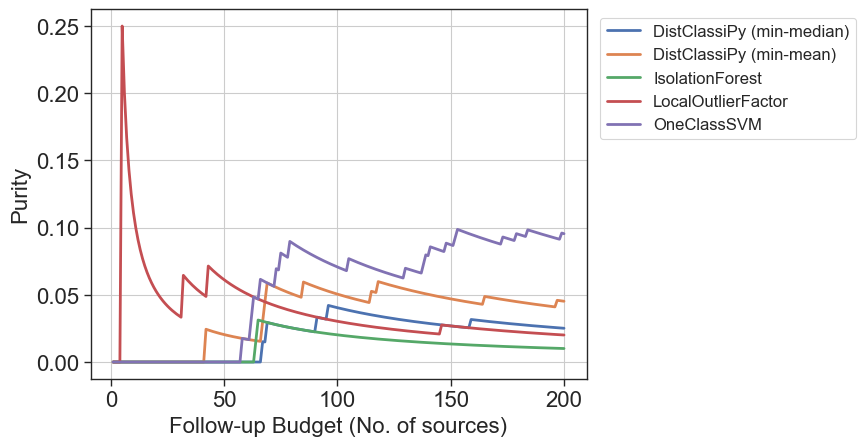

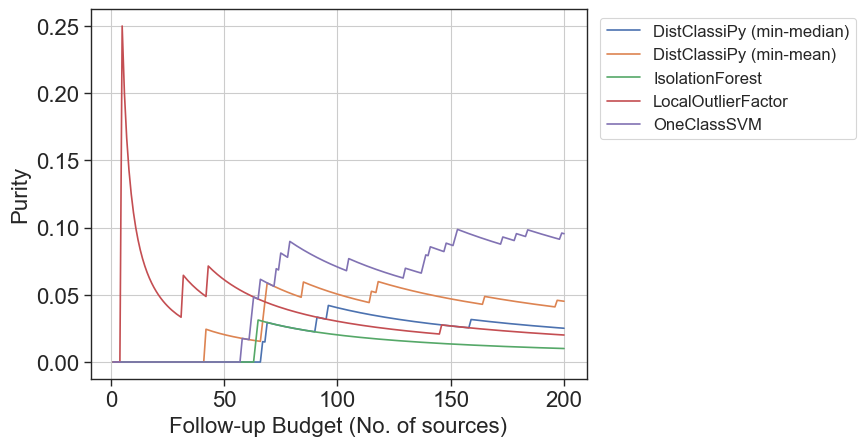

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 59
	Common % = 59.0%
***IsolationForest
	Common = 38
	Common % = 38.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 15
	Common % = 15.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 39 (39.0%)
status
normal       59
anomalous     2
Name: count, dtype: int64
status
normal       0.967213
anomalous    0.032787
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal
64916976,SNIIn-MOSFIT,normal
12894334,SNIIn+HostXT_V19,normal
158182542,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal
12894334,SNIIn+HostXT_V19,normal
119433681,dwarf-nova,normal
89915162,TDE,normal


score_IsolationForest


,class,status
snid,,
88027215,DSCT,normal
42088553,AGN,normal
25095194,DSCT,normal
35547238,DSCT,normal
158182542,DSCT,normal
30406196,DSCT,normal
80651702,dwarf-nova,normal
97153243,DSCT,normal
50430377,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,normal
140955823,DSCT,normal
48726309,DSCT,normal
4357262,SNIc-Templates,anomalous
46505442,CEP,normal
24672901,AGN,normal
62388074,DSCT,normal
154302958,DSCT,normal
48420977,SNII-Templates,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
48726309,DSCT,normal
155481312,CEP,normal
12874225,DSCT,normal
62388074,DSCT,normal
97153243,DSCT,normal
40489115,DSCT,normal
40256654,DSCT,normal
2008943,dwarf-nova,normal


********************************************************************************
*************************  ANOMALY: SNIcBL+HostXT_V19  *************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
TDE                       1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       94
anomalous     6
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       94
anomalous     6
Name: count, dtype: int64

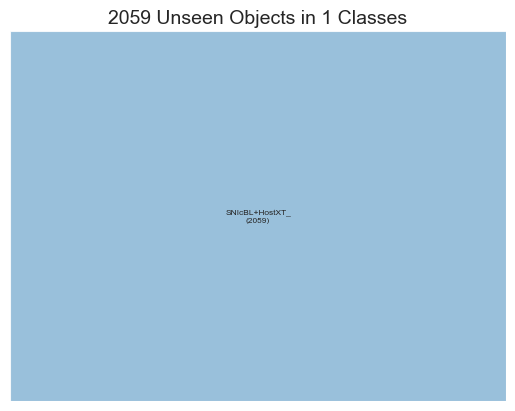

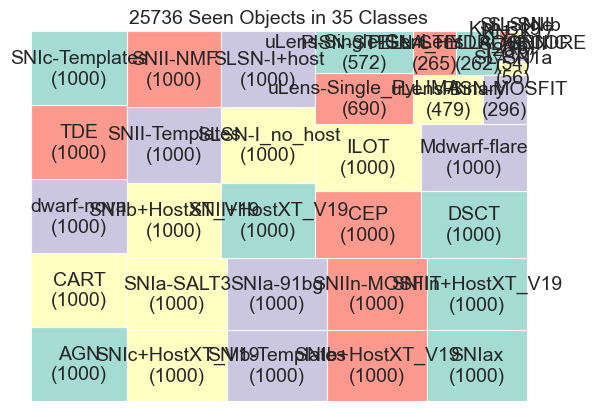

Total anoms:
status
normal       27400
anomalous     2059
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.94
anomalous    0.06
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.945
anomalous    0.055
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.985
anomalous    0.015
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.97
anomalous    0.03
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.94
anomalous    0.06
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

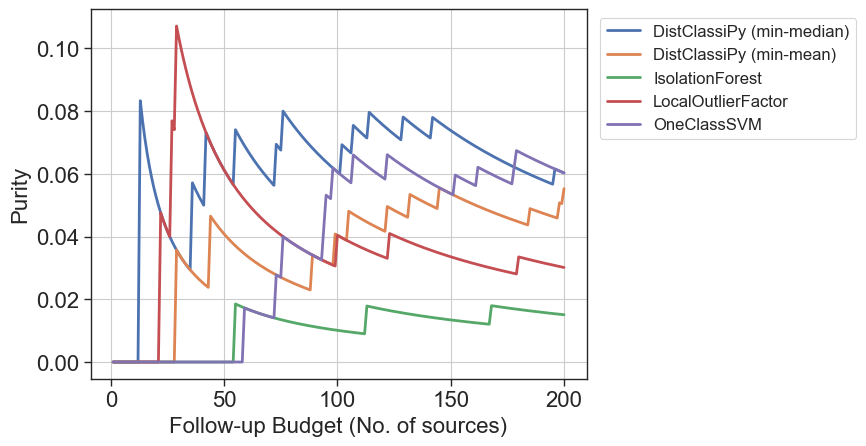

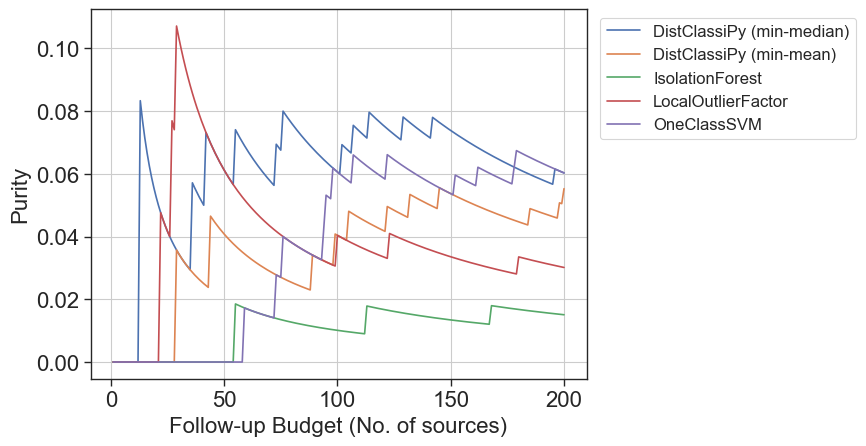

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 60
	Common % = 60.0%
***IsolationForest
	Common = 17
	Common % = 17.0%
***LocalOutlierFactor
	Common = 4
	Common % = 4.0%
***OneClassSVM
	Common = 6
	Common % = 6.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 18 (18.0%)
status
normal       76
anomalous     6
Name: count, dtype: int64
status
normal       0.926829
anomalous    0.073171
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,normal
6638537,SNII+HostXT_V19,normal
145318115,DSCT,normal
8591142,SNII-NMF,normal
8200402,SNIIn+HostXT_V19,normal
4807364,SNIIn+HostXT_V19,normal
152540129,SNIIn-MOSFIT,normal
3365416,SNIa-SALT3,normal
73498688,DSCT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,normal
12874225,DSCT,normal
48726309,DSCT,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal
3365416,SNIa-SALT3,normal
5060681,AGN,normal
8591142,SNII-NMF,normal
43757557,DSCT,normal


score_IsolationForest


,class,status
snid,,
80651702,dwarf-nova,normal
88027215,DSCT,normal
129423123,DSCT,normal
158182542,DSCT,normal
64804563,DSCT,normal
30406196,DSCT,normal
97153243,DSCT,normal
134231880,DSCT,normal
12874225,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,normal
48726309,DSCT,normal
93099457,SNIIn-MOSFIT,normal
22922254,SNIb-Templates,normal
46505442,CEP,normal
106532076,TDE,normal
24672901,AGN,normal
42942701,SNII-Templates,normal
39893162,SNIax,normal


score_OneClassSVM


,class,status
snid,,
64078252,dwarf-nova,normal
48726309,DSCT,normal
12874225,DSCT,normal
62388074,DSCT,normal
97153243,DSCT,normal
97986635,DSCT,normal
70950988,DSCT,normal
36049081,DSCT,normal
8993482,DSCT,normal


********************************************************************************
********************************  ANOMALY: TDE  ********************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
dwarf-nova                1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIMA

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       91
anomalous     9
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       90
anomalous    10
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       90
anomalous    10
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       99
anomalous     1
Name: count, dtype: int64

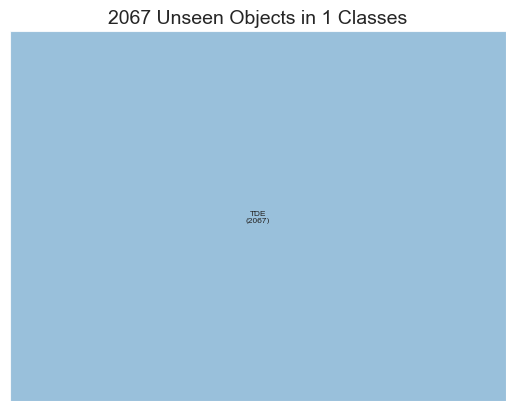

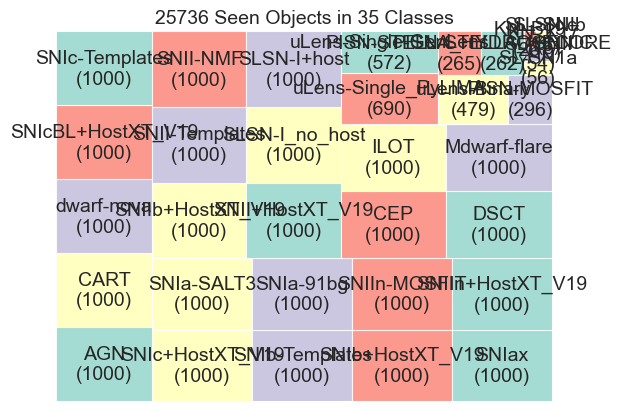

Total anoms:
status
normal       27392
anomalous     2067
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.91
anomalous    0.09
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.93
anomalous    0.07
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.99
anomalous    0.01
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.935
anomalous    0.065
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.97
anomalous    0.03
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

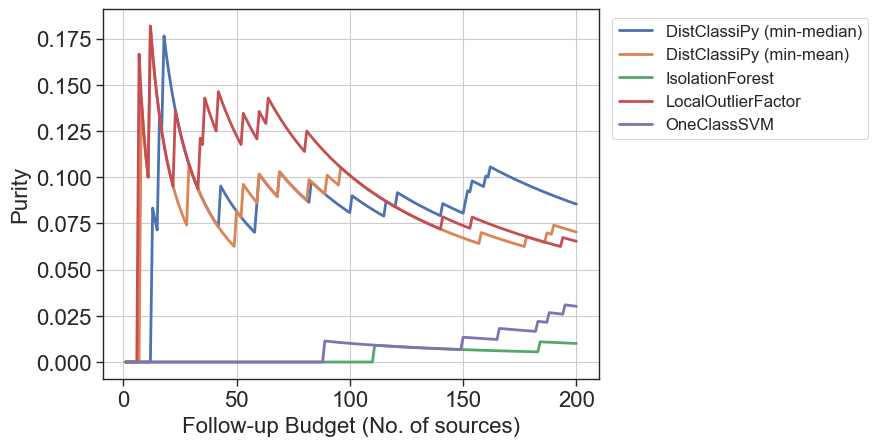

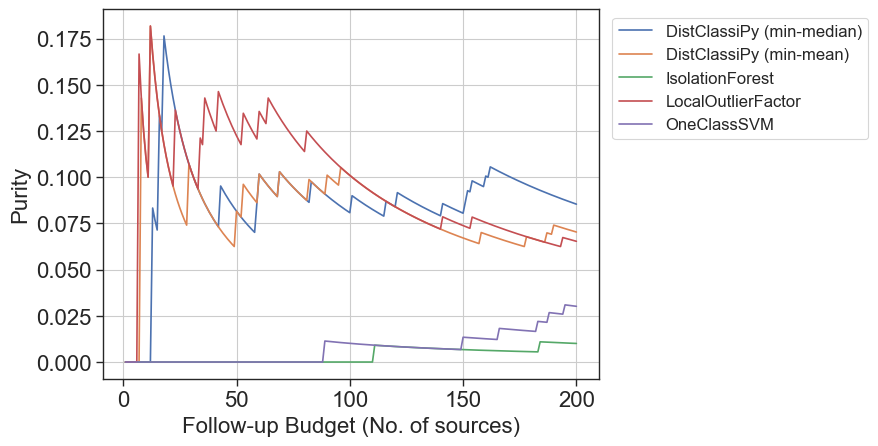

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 54
	Common % = 54.0%
***IsolationForest
	Common = 27
	Common % = 27.0%
***LocalOutlierFactor
	Common = 4
	Common % = 4.0%
***OneClassSVM
	Common = 8
	Common % = 8.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 28 (28.0%)
status
normal       63
anomalous     9
Name: count, dtype: int64
status
normal       0.875
anomalous    0.125
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
43757557,DSCT,normal
8591142,SNII-NMF,normal
158182542,DSCT,normal
6638537,SNII+HostXT_V19,normal
19369061,DSCT,normal
64916976,SNIIn-MOSFIT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
6638537,SNII+HostXT_V19,normal
3365416,SNIa-SALT3,normal
86051575,SLSN-I+host,normal
89915162,TDE,anomalous
1544999,SNII+HostXT_V19,normal
2746505,CEP,normal


score_IsolationForest


,class,status
snid,,
88027215,DSCT,normal
129423123,DSCT,normal
30406196,DSCT,normal
42088553,AGN,normal
25095194,DSCT,normal
158182542,DSCT,normal
51038624,DSCT,normal
15660705,DSCT,normal
66480100,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
140955823,DSCT,normal
48726309,DSCT,normal
10498551,SNIIn+HostXT_V19,normal
4357262,SNIc-Templates,normal
93099457,SNIIn-MOSFIT,normal
106532076,TDE,anomalous
138399094,CEP,normal
46505442,CEP,normal
62388074,DSCT,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
62388074,DSCT,normal
12874225,DSCT,normal
48726309,DSCT,normal
97153243,DSCT,normal
138399094,CEP,normal
34576023,dwarf-nova,normal
70950988,DSCT,normal
24978225,DSCT,normal


********************************************************************************
*****************************  ANOMALY: dwarf-nova  *****************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
CART                      1000
TDE                       1000
SNIcBL+HostXT_V19         1000
SNIc-Templates            1000
SNIc+HostXT_V19           1000
SNIb-Templates            1000
SNIb+HostXT_V19           1000
SNIax                     1000
SNIa-SALT3                1000
SNIa-91bg                 1000
SNIIn-MOSFIT              1000
SNIIn+HostXT_V19          1000
SNIIb+HostXT_V19          1000
SNII-Templates            1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare              1000
uLens-Single_PyLIM

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       84
anomalous    16
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       78
anomalous    22
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       91
anomalous     9
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       76
anomalous    24
Name: count, dtype: int64

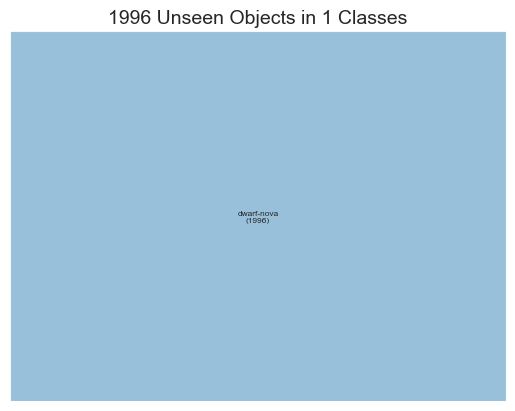

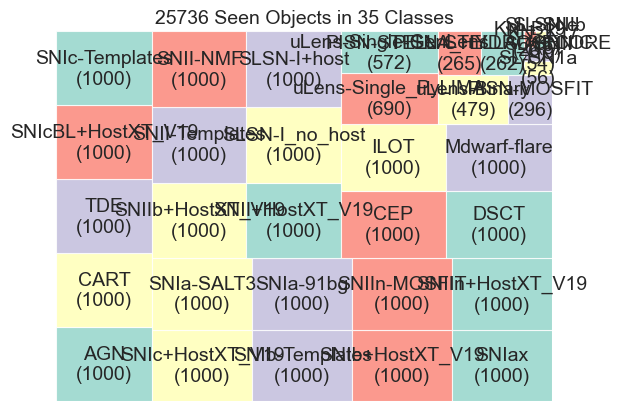

Total anoms:
status
normal       27463
anomalous     1996
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.885
anomalous    0.115
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.83
anomalous    0.17
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.915
anomalous    0.085
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.855
anomalous    0.145
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

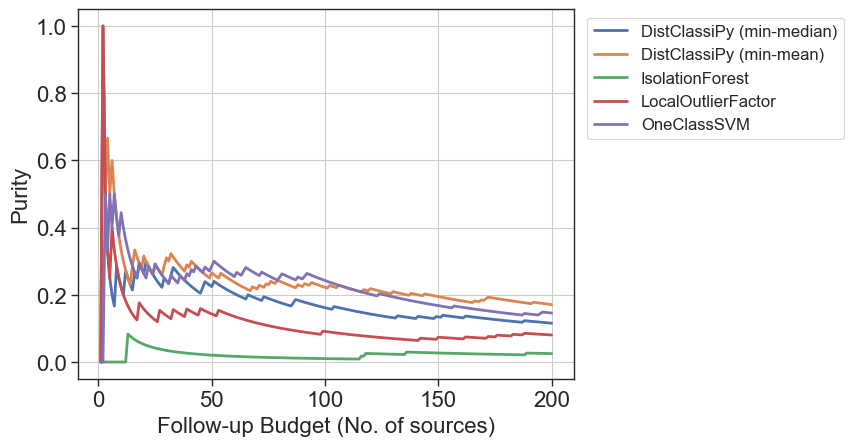

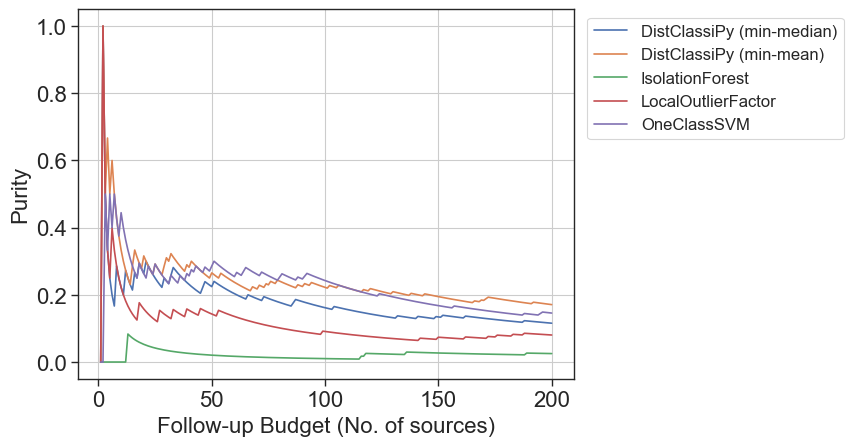

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 63
	Common % = 63.0%
***IsolationForest
	Common = 22
	Common % = 22.0%
***LocalOutlierFactor
	Common = 7
	Common % = 7.0%
***OneClassSVM
	Common = 14
	Common % = 14.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 28 (28.0%)
status
normal       60
anomalous    12
Name: count, dtype: int64
status
normal       0.833333
anomalous    0.166667
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
64078252,dwarf-nova,anomalous
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal
17927341,SNII-NMF,normal
66480100,DSCT,normal
8200402,SNIIn+HostXT_V19,normal
77690319,dwarf-nova,anomalous
5418834,CART,normal
64916976,SNIIn-MOSFIT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
64078252,dwarf-nova,anomalous
12874225,DSCT,normal
34892193,dwarf-nova,anomalous
140955823,DSCT,normal
23353678,dwarf-nova,anomalous
48726309,DSCT,normal
145318115,DSCT,normal
6638537,SNII+HostXT_V19,normal
88027215,DSCT,normal


score_IsolationForest


,class,status
snid,,
88027215,DSCT,normal
42088553,AGN,normal
30406196,DSCT,normal
129423123,DSCT,normal
25095194,DSCT,normal
50430377,DSCT,normal
158182542,DSCT,normal
39800396,CEP,normal
35547238,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
64078252,dwarf-nova,anomalous
140955823,DSCT,normal
48726309,DSCT,normal
39800396,CEP,normal
34892193,dwarf-nova,anomalous
62388074,DSCT,normal
4357262,SNIc-Templates,normal
22922254,SNIb-Templates,normal
46505442,CEP,normal


score_OneClassSVM


,class,status
snid,,
40256654,DSCT,normal
34576023,dwarf-nova,anomalous
140955823,DSCT,normal
2008943,dwarf-nova,anomalous
97153243,DSCT,normal
64078252,dwarf-nova,anomalous
48726309,DSCT,normal
12874225,DSCT,normal
34892193,dwarf-nova,anomalous


********************************************************************************
****************************  ANOMALY: uLens-Binary  ****************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
SNIax                     1000
SNII-Templates            1000
SNIIb+HostXT_V19          1000
SNIIn+HostXT_V19          1000
SNIIn-MOSFIT              1000
SNIa-91bg                 1000
SNIa-SALT3                1000
SNIb+HostXT_V19           1000
CART                      1000
SNIb-Templates            1000
SNIc+HostXT_V19           1000
SNIc-Templates            1000
SNIcBL+HostXT_V19         1000
TDE                       1000
dwarf-nova                1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare      

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       93
anomalous     7
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal       92
anomalous     8
Name: count, dtype: int64

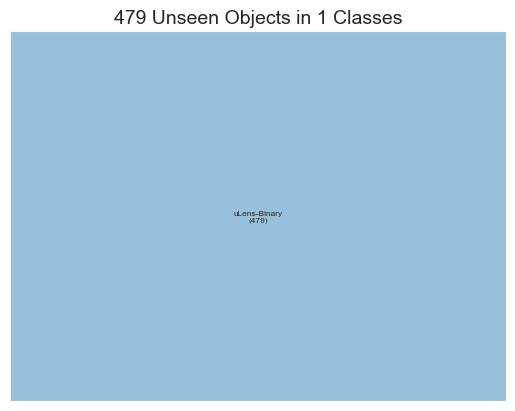

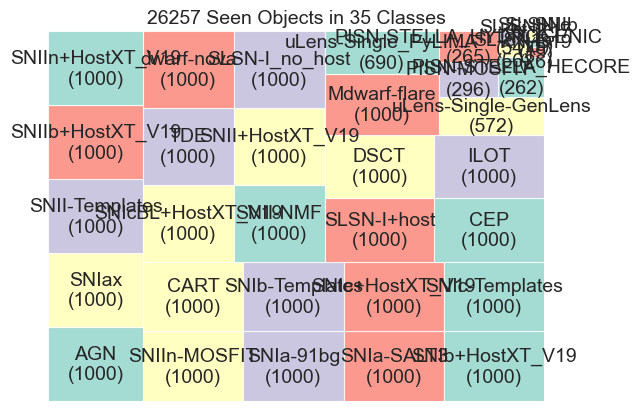

Total anoms:
status
normal       28459
anomalous      479
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.985
anomalous    0.015
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.945
anomalous    0.055
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.93
anomalous    0.07
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

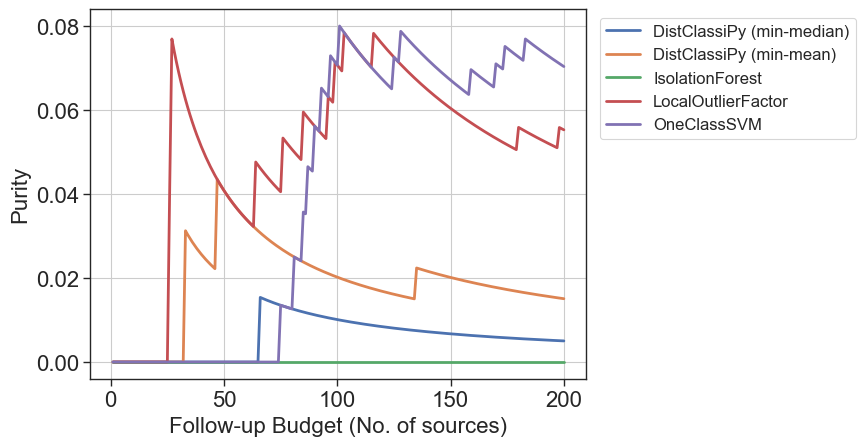

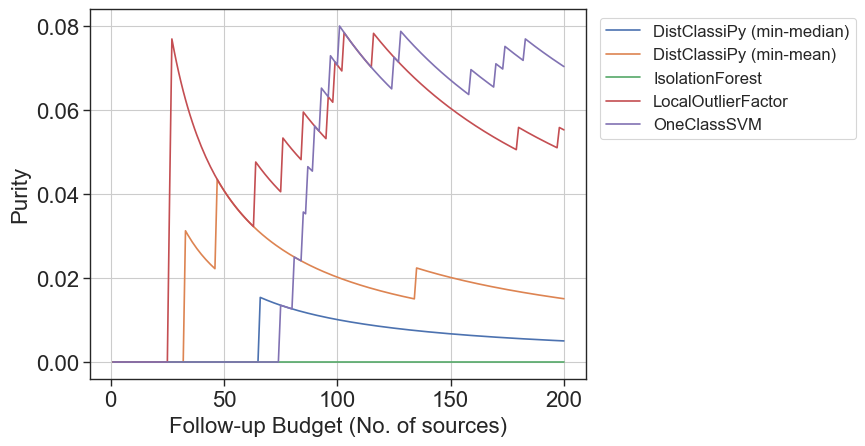

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 57
	Common % = 57.0%
***IsolationForest
	Common = 28
	Common % = 28.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 14
	Common % = 14.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 35 (35.0%)
status
normal       64
anomalous     1
Name: count, dtype: int64
status
normal       0.984615
anomalous    0.015385
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
140955823,DSCT,normal
39800396,CEP,normal
158182542,DSCT,normal
145318115,DSCT,normal
134139354,TDE,normal
43757557,DSCT,normal
5060681,AGN,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
155481312,CEP,normal
12874225,DSCT,normal
39800396,CEP,normal
140955823,DSCT,normal
145318115,DSCT,normal
99295996,SNIIn-MOSFIT,normal
3365416,SNIa-SALT3,normal
136000172,dwarf-nova,normal
1544999,SNII+HostXT_V19,normal


score_IsolationForest


,class,status
snid,,
42088553,AGN,normal
25095194,DSCT,normal
158182542,DSCT,normal
39800396,CEP,normal
30406196,DSCT,normal
88027215,DSCT,normal
97153243,DSCT,normal
129423123,DSCT,normal
50430377,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
155481312,CEP,normal
140955823,DSCT,normal
39800396,CEP,normal
93099457,SNIIn-MOSFIT,normal
6131735,AGN,normal
46505442,CEP,normal
62388074,DSCT,normal
63964674,CART,normal
55706383,AGN,normal


score_OneClassSVM


,class,status
snid,,
140955823,DSCT,normal
12874225,DSCT,normal
62388074,DSCT,normal
155481312,CEP,normal
97153243,DSCT,normal
39800396,CEP,normal
26482462,dwarf-nova,normal
97986635,DSCT,normal
70950988,DSCT,normal


********************************************************************************
************************  ANOMALY: uLens-Single-GenLens  ************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
SNIax                     1000
SNII-Templates            1000
SNIIb+HostXT_V19          1000
SNIIn+HostXT_V19          1000
SNIIn-MOSFIT              1000
SNIa-91bg                 1000
SNIa-SALT3                1000
SNIb+HostXT_V19           1000
CART                      1000
SNIb-Templates            1000
SNIc+HostXT_V19           1000
SNIc-Templates            1000
SNIcBL+HostXT_V19         1000
TDE                       1000
dwarf-nova                1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare      

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal    100
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       99
anomalous     1
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

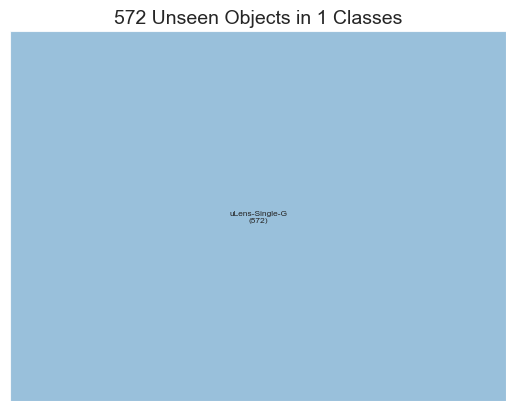

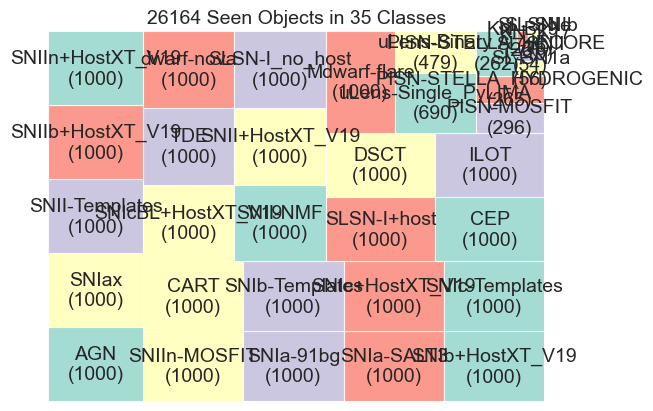

Total anoms:
status
normal       28459
anomalous      572
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.98
anomalous    0.02
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal    1.0
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.96
anomalous    0.04
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.985
anomalous    0.015
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

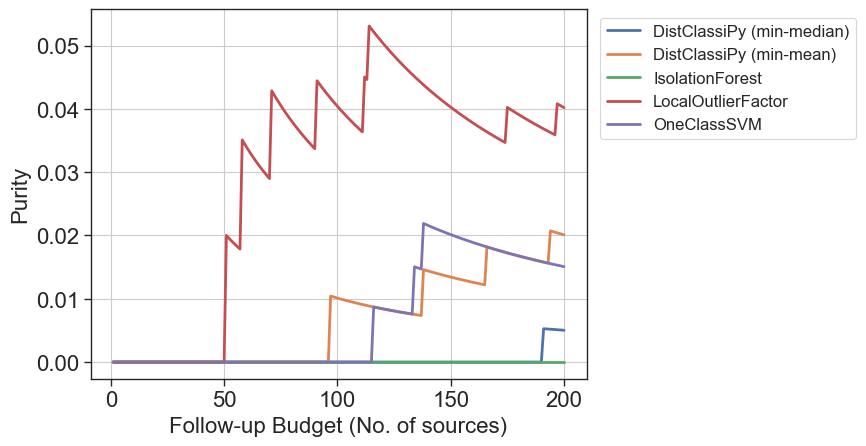

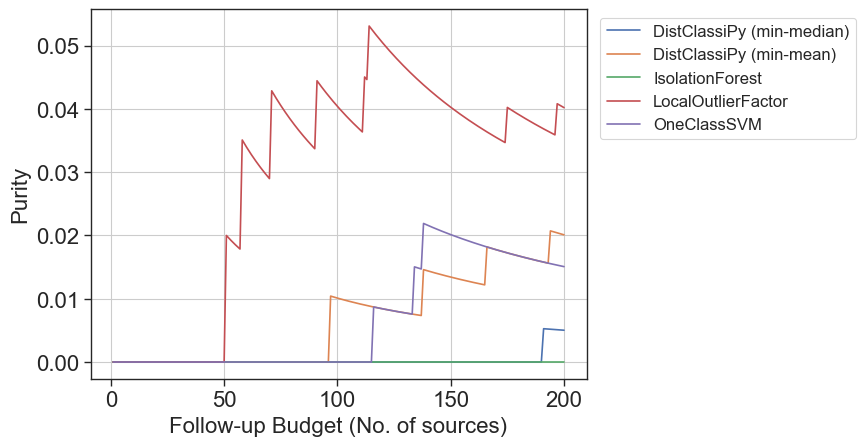

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 57
	Common % = 57.0%
***IsolationForest
	Common = 19
	Common % = 19.0%
***LocalOutlierFactor
	Common = 5
	Common % = 5.0%
***OneClassSVM
	Common = 11
	Common % = 11.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 25 (25.0%)
status
normal    75
Name: count, dtype: int64
status
normal    1.0
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
12874225,DSCT,normal
48726309,DSCT,normal
43757557,DSCT,normal
140955823,DSCT,normal
158182542,DSCT,normal
145318115,DSCT,normal
19094894,DSCT,normal
19369061,DSCT,normal
64916976,SNIIn-MOSFIT,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
12874225,DSCT,normal
48726309,DSCT,normal
140955823,DSCT,normal
34892193,dwarf-nova,normal
145318115,DSCT,normal
99295996,SNIIn-MOSFIT,normal
119433681,dwarf-nova,normal
3365416,SNIa-SALT3,normal
86051575,SLSN-I+host,normal


score_IsolationForest


,class,status
snid,,
35547238,DSCT,normal
158182542,DSCT,normal
88027215,DSCT,normal
50430377,DSCT,normal
2746505,CEP,normal
25095194,DSCT,normal
97153243,DSCT,normal
30406196,DSCT,normal
12874225,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
140955823,DSCT,normal
48726309,DSCT,normal
34892193,dwarf-nova,normal
138399094,CEP,normal
46505442,CEP,normal
4357262,SNIc-Templates,normal
62388074,DSCT,normal
55706383,AGN,normal
9078946,DSCT,normal


score_OneClassSVM


,class,status
snid,,
48726309,DSCT,normal
62388074,DSCT,normal
12874225,DSCT,normal
140955823,DSCT,normal
34892193,dwarf-nova,normal
97153243,DSCT,normal
138399094,CEP,normal
101267830,dwarf-nova,normal
97986635,DSCT,normal


********************************************************************************
************************  ANOMALY: uLens-Single_PyLIMA  ************************
********************************************************************************
TRAIN VALUE COUNT:
class
AGN                       1000
SNIax                     1000
SNII-Templates            1000
SNIIb+HostXT_V19          1000
SNIIn+HostXT_V19          1000
SNIIn-MOSFIT              1000
SNIa-91bg                 1000
SNIa-SALT3                1000
SNIb+HostXT_V19           1000
CART                      1000
SNIb-Templates            1000
SNIc+HostXT_V19           1000
SNIc-Templates            1000
SNIcBL+HostXT_V19         1000
TDE                       1000
dwarf-nova                1000
SNII-NMF                  1000
SNII+HostXT_V19           1000
SLSN-I_no_host            1000
SLSN-I+host               1000
CEP                       1000
DSCT                      1000
ILOT                      1000
Mdwarf-flare       

Running Models:   0%|          | 0/5 [00:00<?, ?it/s]

How many anomalies in top 100 preds?
********** score_DistClassiPy (min-median) **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_DistClassiPy (min-mean) **********


status
normal       96
anomalous     4
Name: count, dtype: int64

********** score_IsolationForest **********


status
normal    100
Name: count, dtype: int64

********** score_LocalOutlierFactor **********


status
normal       98
anomalous     2
Name: count, dtype: int64

********** score_OneClassSVM **********


status
normal    100
Name: count, dtype: int64

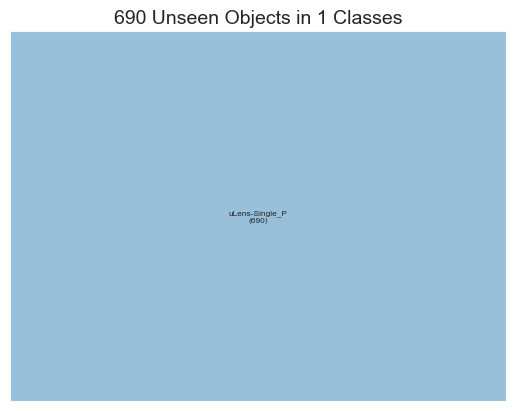

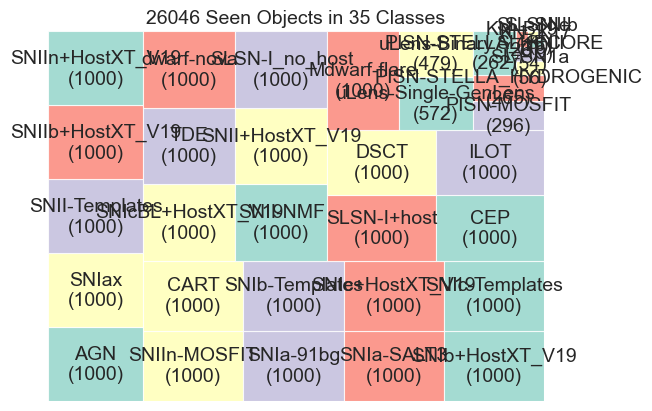

Total anoms:
status
normal       28459
anomalous      690
Name: count, dtype: int64
********** Check top 200 candidates for each model **********

--- Top 200 candidates for DistClassiPy (min-median) ---


status
normal       0.97
anomalous    0.03
Name: proportion, dtype: float64


--- Top 200 candidates for DistClassiPy (min-mean) ---


status
normal       0.97
anomalous    0.03
Name: proportion, dtype: float64


--- Top 200 candidates for IsolationForest ---


status
normal       0.995
anomalous    0.005
Name: proportion, dtype: float64


--- Top 200 candidates for LocalOutlierFactor ---


status
normal       0.975
anomalous    0.025
Name: proportion, dtype: float64


--- Top 200 candidates for OneClassSVM ---


status
normal       0.97
anomalous    0.03
Name: proportion, dtype: float64

method:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

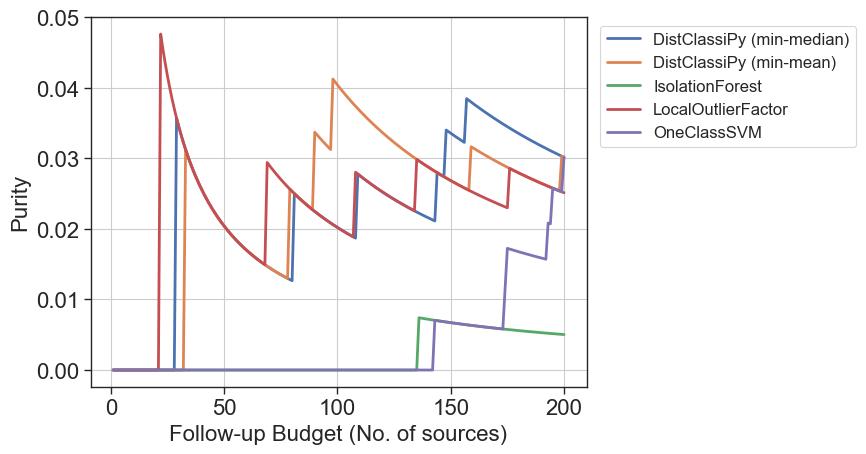

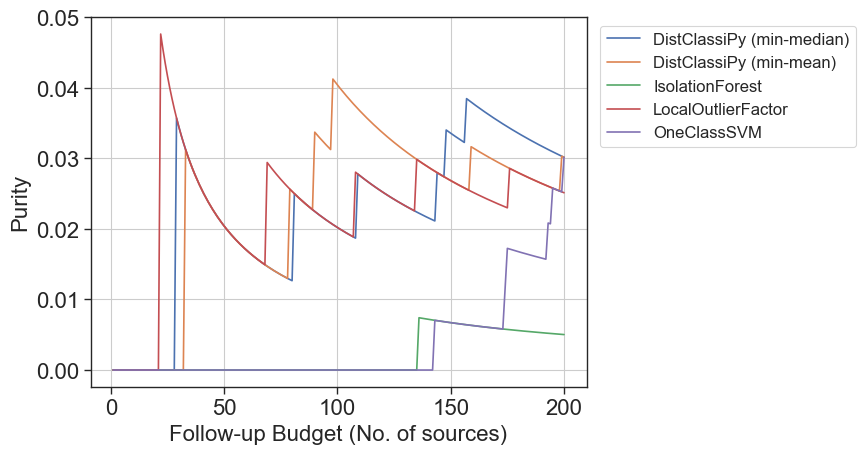

Comparing top 100 DistClassiPy (min-median) with
***DistClassiPy (min-mean)
	Common = 56
	Common % = 56.0%
***IsolationForest
	Common = 13
	Common % = 13.0%
***LocalOutlierFactor
	Common = 1
	Common % = 1.0%
***OneClassSVM
	Common = 8
	Common % = 8.0%
DistClassiPy (min-median) common with top 100 for ALL OTHER: 19 (19.0%)
status
normal       79
anomalous     2
Name: count, dtype: int64
status
normal       0.975309
anomalous    0.024691
Name: proportion, dtype: float64
score_DistClassiPy (min-median)


,class,status
snid,,
12874225,DSCT,normal
145318115,DSCT,normal
12894334,SNIIn+HostXT_V19,normal
6638537,SNII+HostXT_V19,normal
5060681,AGN,normal
8200402,SNIIn+HostXT_V19,normal
89915162,TDE,normal
19369061,DSCT,normal
120180279,SNIcBL+HostXT_V19,normal


score_DistClassiPy (min-mean)


,class,status
snid,,
12874225,DSCT,normal
145318115,DSCT,normal
12894334,SNIIn+HostXT_V19,normal
99295996,SNIIn-MOSFIT,normal
6638537,SNII+HostXT_V19,normal
89915162,TDE,normal
5060681,AGN,normal
11716512,SNII+HostXT_V19,normal
38304588,SNIIb+HostXT_V19,normal


score_IsolationForest


,class,status
snid,,
88027215,DSCT,normal
158182542,DSCT,normal
42088553,AGN,normal
97153243,DSCT,normal
12874225,DSCT,normal
2746505,CEP,normal
25095194,DSCT,normal
129423123,DSCT,normal
15660705,DSCT,normal


score_LocalOutlierFactor


,class,status
snid,,
106532076,TDE,normal
138399094,CEP,normal
50026026,CEP,normal
51931138,SNII-Templates,normal
150740300,TDE,normal
117101986,SNIIn-MOSFIT,normal
9078946,DSCT,normal
48420977,SNII-Templates,normal
146922112,DSCT,normal


score_OneClassSVM


,class,status
snid,,
12874225,DSCT,normal
97153243,DSCT,normal
138399094,CEP,normal
26482462,dwarf-nova,normal
101267830,dwarf-nova,normal
51038624,DSCT,normal
40489115,DSCT,normal
117272388,DSCT,normal
84807149,DSCT,normal


In [15]:
for anomaly_subclass in allclasses:
    print("*"*80)
    title = f" ANOMALY: {anomaly_subclass} "
    ntitle = 40 - (1+len(title)//2)
    
    print("*"*ntitle, title ,"*"*ntitle)
    print("*"*80)

    new_unknowns = [anomaly_subclass]
    # new_knowns = [cl for cl in allclasses if cl not in [
    #     anomaly_subclass,
    #     "SL-SN1a",
    #     "SL-SNII",
    #     "KN_B19",
    #     "KN_K17",
    #     "SL-SNIc",
    #     "SL-SNIb"
    # ]
    #              ]

    new_knowns = [cl for cl in allclasses if cl not in [anomaly_subclass]]
    
    run_anom_exp(commondat, new_knowns=new_knowns, new_unknowns=new_unknowns, 
                 final_features=myfeatures)